In [2]:
import numpy as np          # Para trabajar con arreglos numéricos
import pandas as pd         # Para manejar tablas de datos (DataFrames)
import matplotlib.pyplot as plt  # Para hacer gráficos
import seaborn as sns

from sklearn.feature_selection import chi2

# Herramientas de machine learning (scikit-learn)
from sklearn.model_selection import train_test_split, StratifiedKFold
from sklearn.metrics import roc_auc_score, roc_curve, auc                       # Medir calidad de los modelos
from sklearn.ensemble import RandomForestClassifier, GradientBoostingClassifier  # Modelos de árboles

# Para análisis de supervivencia
from lifelines import KaplanMeierFitter                                       # Para crear curvas de supervivencia
from lifelines.statistics import logrank_test                                 # Prueba para comparar curvas
from sksurv.ensemble import RandomSurvivalForest                              # Modelo de bosque para supervivencia
from sksurv.util import Surv                                                   # Formato de datos para supervivencia
from sksurv.metrics import concordance_index_censored                        # Medida para evaluar modelos de supervivencia

# Para balancear datos y generar muestras nuevas
from imblearn.over_sampling import SMOTE                                   # Para balancear datos desbalanceados

# Para usar XGBoost, un modelo potente basado en árboles
import xgboost as xgb          

from lightgbm import LGBMClassifier
from sklearn.model_selection import GridSearchCV, StratifiedKFold
import numpy as np
import matplotlib.pyplot as plt
from sklearn.metrics import roc_curve

In [3]:
import pandas as pd 

df = pd.read_csv('data/merged_data.csv', index_col = 0)
df.head()

,ADH1C_expression,ADH1C_scna,ADH1C_muta,APBB1IP_expression,APBB1IP_scna,APBB1IP_muta,BTK_expression,BTK_scna,BTK_muta,CARD11_expression,...,TRAT1_muta,status,histological_type_infiltratingductalcarcinoma,histological_type_infiltratinglobularcarcinoma,histological_type_medullarycarcinoma,histological_type_metaplasticcarcinoma,histological_type_mixedhistology(pleasespecify),histological_type_mucinouscarcinoma,"histological_type_other,specify",survival_3yr
TCGA.A1.A0SB,4.0676,-0.001,0,6.1278,-0.001,0,4.6367,0.000,0,5.2457,...,0,False,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0
TCGA.A1.A0SD,2.4062,-0.007,0,7.7529,0.103,0,6.8136,-0.060,0,6.3815,...,0,False,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0
TCGA.A1.A0SE,4.1789,-0.010,0,6.5865,0.813,0,6.6013,-0.008,0,6.0334,...,0,False,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1
TCGA.A1.A0SF,5.3368,0.020,0,8.1893,0.347,0,6.9586,0.065,0,7.2255,...,0,False,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1
TCGA.A1.A0SG,1.8156,-0.012,0,8.1031,0.000,0,7.8543,0.010,0,7.6702,...,0,False,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0


In [23]:
df.dtypes

ADH1C_expression                                   float64
ADH1C_scna                                         float64
ADH1C_muta                                           int64
APBB1IP_expression                                 float64
APBB1IP_scna                                       float64
                                                    ...   
histological_type_metaplasticcarcinoma             float64
histological_type_mixedhistology(pleasespecify)    float64
histological_type_mucinouscarcinoma                float64
histological_type_other,specify                    float64
survival_3yr                                         int64
Length: 123, dtype: object

In [4]:
# Función para evaluar modelo y obtener AUC
def evaluar_modelo(modelo, X, y, cv):
    auc_scores = []
    for train_idx, test_idx in cv.split(X, y):
        X_train, X_test = X[train_idx], X[test_idx]
        y_train, y_test = y[train_idx], y[test_idx]

        modelo.fit(X_train, y_train)
        y_proba = modelo.predict_proba(X_test)[:, 1]
        auc = roc_auc_score(y_test, y_proba)
        auc_scores.append(auc)

    return auc_scores, y_test, y_proba

In [5]:
X = df.drop('survival_3yr', axis=1)
y = df['survival_3yr']

# aumento de la data con SMOTE
smote = SMOTE(random_state=42)
X_resampled, y_resampled = smote.fit_resample(X, y)

X = X_resampled.values
y = y_resampled.values

# validacion cruzada
cv = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)

Fitting 5 folds for each of 2916 candidates, totalling 14580 fits


d:\Coding\investigacionIA\entorno\Lib\site-packages\sklearn\model_selection\_validation.py:528: FitFailedWarning: 
4860 fits failed out of a total of 14580.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
1950 fits failed with the following error:
Traceback (most recent call last):
  File "d:\Coding\investigacionIA\entorno\Lib\site-packages\sklearn\model_selection\_validation.py", line 866, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "d:\Coding\investigacionIA\entorno\Lib\site-packages\sklearn\base.py", line 1382, in wrapper
    estimator._validate_params()
  File "d:\Coding\investigacionIA\entorno\Lib\site-packages\sklearn\base.py", line 436, in _validate_params
    validate_parameter_constraints(
  File "

Mejores hiperparámetros Gradient Boosting: {'learning_rate': 0.2, 'max_depth': 6, 'max_features': 'sqrt', 'min_samples_leaf': 1, 'min_samples_split': 5, 'n_estimators': 300, 'subsample': 0.8}
AUC ROC promedio Gradient Boosting optimizado: 0.7128 ± 0.0242


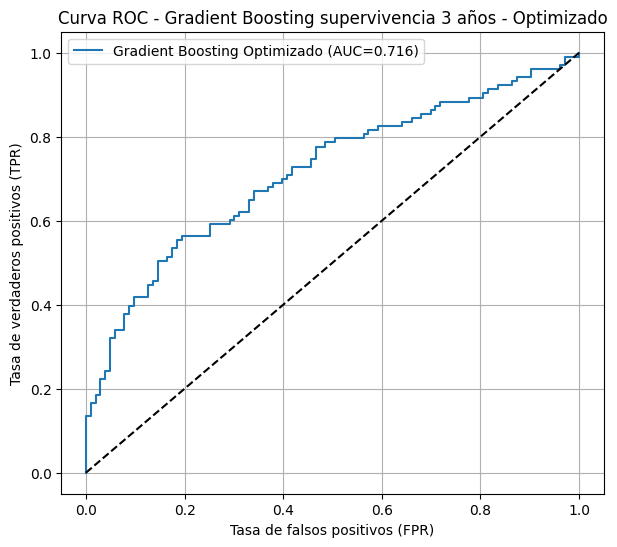

In [14]:
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.model_selection import GridSearchCV, StratifiedKFold
import numpy as np
import matplotlib.pyplot as plt
from sklearn.metrics import roc_curve

# Definir el modelo base sin ajustar parámetros
gb_clf = GradientBoostingClassifier(random_state=42)

# Definir rango de hiperparámetros a explorar
param_grid = {
    "n_estimators": [100, 200, 300],
    "max_depth": [3, 4, 5, 6],
    "learning_rate": [0.01, 0.1, 0.2],
    "subsample": [0.6, 0.8, 1.0],
    "max_features": ["auto", "sqrt", "log2"],
    "min_samples_leaf": [1, 2, 4],
    "min_samples_split": [2, 5, 10],
}

# Validacion cruzada estratificada
cv = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)

# Crear GridSearchCV
grid_search = GridSearchCV(
    estimator=gb_clf,
    param_grid=param_grid,
    scoring="roc_auc",
    cv=cv,
    n_jobs=-1,
    verbose=2,
)

# Ajustar al conjunto de datos
grid_search.fit(X, y)

# Mostrar mejores hiperparámetros
print("Mejores hiperparámetros Gradient Boosting:", grid_search.best_params_)

# Usar el mejor modelo para evaluar con tu función personalizada
best_gb = grid_search.best_estimator_
auc_gb, y_test_gb, y_proba_gb = evaluar_modelo(best_gb, X, y, cv)
print(
    f"AUC ROC promedio Gradient Boosting optimizado: {np.mean(auc_gb):.4f} ± {np.std(auc_gb):.4f}"
)

# Graficar la curva ROC del último fold
fpr, tpr, _ = roc_curve(y_test_gb, y_proba_gb)
plt.figure(figsize=(7, 6))
plt.plot(fpr, tpr, label=f"Gradient Boosting Optimizado (AUC={auc_gb[-1]:.3f})")
plt.plot([0, 1], [0, 1], "k--")
plt.xlabel("Tasa de falsos positivos (FPR)")
plt.ylabel("Tasa de verdaderos positivos (TPR)")
plt.title("Curva ROC - Gradient Boosting supervivencia 3 años - Optimizado")
plt.legend()
plt.grid(True)
plt.show()

Fitting 5 folds for each of 1728 candidates, totalling 8640 fits


d:\Coding\investigacionIA\entorno\Lib\site-packages\xgboost\training.py:183: UserWarning: [23:23:47] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


Mejores hiperparámetros XGBoost: {'colsample_bytree': 1.0, 'gamma': 0.1, 'learning_rate': 0.2, 'max_depth': 8, 'n_estimators': 100, 'subsample': 1.0}


d:\Coding\investigacionIA\entorno\Lib\site-packages\xgboost\training.py:183: UserWarning: [23:23:48] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)
d:\Coding\investigacionIA\entorno\Lib\site-packages\xgboost\training.py:183: UserWarning: [23:23:48] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)
d:\Coding\investigacionIA\entorno\Lib\site-packages\xgboost\training.py:183: UserWarning: [23:23:49] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)
d:\Coding\investigacionIA\entorno\Lib\site-packages\xgboost\training.py:183: UserWarning: [23:23:50] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encode

AUC ROC promedio XGBoost optimizado: 0.7064 ± 0.0295


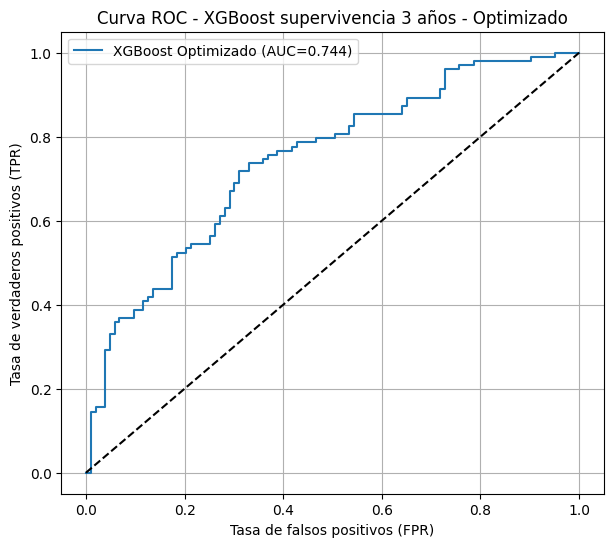

In [15]:
from sklearn.model_selection import GridSearchCV
import xgboost as xgb

# Define el modelo base
xgb_clf = xgb.XGBClassifier(random_state=42, use_label_encoder=False, eval_metric='logloss')

# Define la grilla de hiperparámetros a probar
param_grid = {
    'n_estimators': [100, 200, 300],
    'max_depth': [3, 4, 6, 8],
    'learning_rate': [0.01, 0.1, 0.2, 0.3],
    'subsample': [0.5, 0.6, 0.8, 1.0],
    'colsample_bytree': [0.6, 0.8, 1.0],
    'gamma': [0, 0.1, 0.5]
}

# Configurar GridSearchCV
grid_search_xgb = GridSearchCV(estimator=xgb_clf, param_grid=param_grid, scoring='roc_auc', cv=cv, n_jobs=-1, verbose=2)

# Ajustar al conjunto de datos
grid_search_xgb.fit(X, y)

# Mejor conjunto de hiperparámetros encontrado
print("Mejores hiperparámetros XGBoost:", grid_search_xgb.best_params_)

# Evaluar el mejor modelo con tu función evaluar_modelo
best_xgb = grid_search_xgb.best_estimator_
auc_xgb, y_test_xgb, y_proba_xgb = evaluar_modelo(best_xgb, X, y, cv)
print(f"AUC ROC promedio XGBoost optimizado: {np.mean(auc_xgb):.4f} ± {np.std(auc_xgb):.4f}")

# Graficar curva ROC del primer fold
fpr, tpr, _ = roc_curve(y_test_xgb, y_proba_xgb)
plt.figure(figsize=(7,6))
plt.plot(fpr, tpr, label=f'XGBoost Optimizado (AUC={auc_xgb[-1]:.3f})')
plt.plot([0,1], [0,1], 'k--')
plt.xlabel('Tasa de falsos positivos (FPR)')
plt.ylabel('Tasa de verdaderos positivos (TPR)')
plt.title('Curva ROC - XGBoost supervivencia 3 años - Optimizado')
plt.legend()
plt.grid(True)
plt.show()

Fitting 5 folds for each of 648 candidates, totalling 3240 fits
Mejores hiperparámetros: {'bootstrap': False, 'max_depth': None, 'max_features': 0.3, 'min_samples_leaf': 2, 'min_samples_split': 5, 'n_estimators': 100}
AUC ROC promedio Random Forest optimizado: 0.7247 ± 0.0168


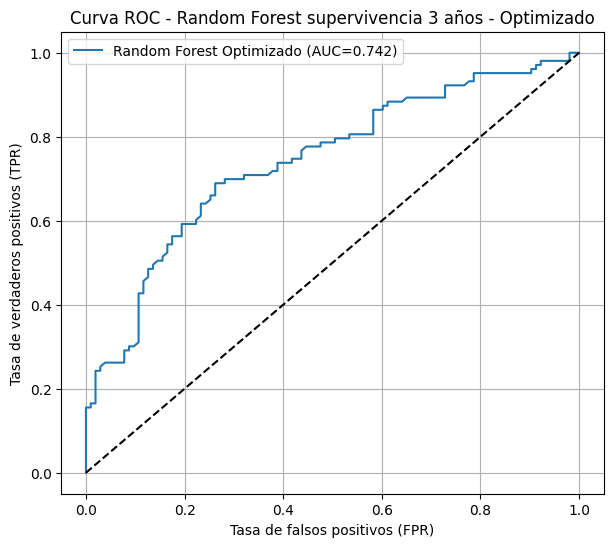

In [16]:
from sklearn.model_selection import GridSearchCV
from sklearn.ensemble import RandomForestClassifier

# Define el modelo base
rf = RandomForestClassifier(random_state=42)

# Define la grilla de hiperparámetros a probar
param_grid = {
    'n_estimators': [100, 200, 300],
    'max_depth': [6, 8, 10, None],
    'min_samples_split': [2, 5, 10],
    'min_samples_leaf': [1, 2, 4],
    'max_features': [0.3, 0.5, 0.7],
    'bootstrap': [True, False]
}

# Definir validación cruzada estratificada 5 folds
cv = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)

# Crear GridSearchCV
grid_search = GridSearchCV(estimator=rf, param_grid=param_grid, cv=cv, scoring='roc_auc', n_jobs=-1, verbose=2)

# Ajustar al conjunto de datos
grid_search.fit(X, y)

# Mejor conjunto de hiperparámetros encontrado
print("Mejores hiperparámetros:", grid_search.best_params_)

# Evaluar el mejor modelo con la función evaluar_modelo que usas
best_rf = grid_search.best_estimator_
auc_scores, y_test, y_proba = evaluar_modelo(best_rf, X, y, cv)
print(f"AUC ROC promedio Random Forest optimizado: {np.mean(auc_scores):.4f} ± {np.std(auc_scores):.4f}")

# Graficar curva ROC del primer fold
fpr, tpr, _ = roc_curve(y_test, y_proba)
plt.figure(figsize=(7,6))
plt.plot(fpr, tpr, label=f'Random Forest Optimizado (AUC={auc_scores[-1]:.3f})')
plt.plot([0,1], [0,1], 'k--')
plt.xlabel('Tasa de falsos positivos (FPR)')
plt.ylabel('Tasa de verdaderos positivos (TPR)')
plt.title('Curva ROC - Random Forest supervivencia 3 años - Optimizado')
plt.legend()
plt.grid(True)
plt.show()


[LightGBM] [Info] Number of positive: 516, number of negative: 516
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000690 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 19404
[LightGBM] [Info] Number of data points in the train set: 1032, number of used features: 81
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500000 -> initscore=0.000000
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits w

d:\Coding\investigacionIA\entorno\Lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


[LightGBM] [Info] Number of positive: 412, number of negative: 413
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000899 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 19331
[LightGBM] [Info] Number of data points in the train set: 825, number of used features: 81
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.499394 -> initscore=-0.002424
[LightGBM] [Info] Start training from score -0.002424
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, be

d:\Coding\investigacionIA\entorno\Lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

d:\Coding\investigacionIA\entorno\Lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

d:\Coding\investigacionIA\entorno\Lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

d:\Coding\investigacionIA\entorno\Lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


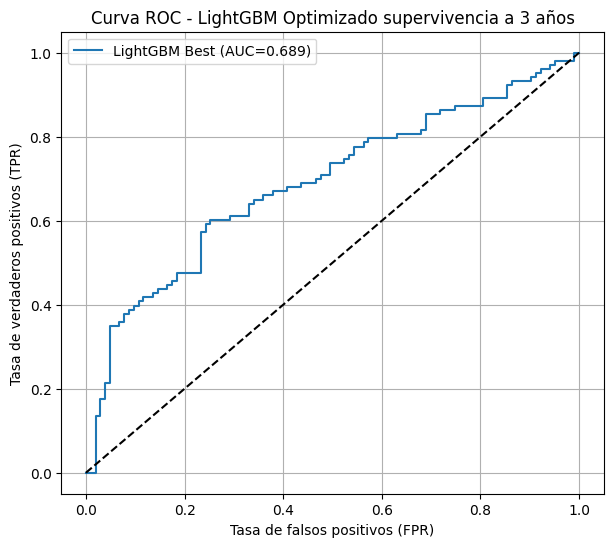

In [17]:
from lightgbm import LGBMClassifier
from sklearn.model_selection import GridSearchCV, StratifiedKFold
import numpy as np
import matplotlib.pyplot as plt
from sklearn.metrics import roc_curve

param_grid = {
    'n_estimators': [50, 100, 200],
    'max_depth': [3, 5, 7],
    'learning_rate': [0.01, 0.1, 0.2],
    'num_leaves': [31, 50, 100],
    'subsample': [0.8, 1.0],
    'colsample_bytree': [0.8, 1.0]
}

cv = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)

lgbm_clf = LGBMClassifier(random_state=42)

grid_search = GridSearchCV(estimator=lgbm_clf, param_grid=param_grid, scoring='roc_auc', cv=cv, n_jobs=-1)
grid_search.fit(X, y)

best_lgbm = grid_search.best_estimator_

print("Mejores hiperparámetros encontrados:")
print(grid_search.best_params_)
print(f"Mejor AUC ROC en validación cruzada: {grid_search.best_score_:.4f}")

# Evaluar con mejores hiperparámetros
auc_lgbm_best, y_test_lgbm_best, y_proba_lgbm_best = evaluar_modelo(best_lgbm, X, y, cv)
print(f"AUC ROC promedio LightGBM (grid search): {np.mean(auc_lgbm_best):.4f} ± {np.std(auc_lgbm_best):.4f}")

# Graficar curva ROC último fold
fpr, tpr, _ = roc_curve(y_test_lgbm_best, y_proba_lgbm_best)
plt.figure(figsize=(7,6))
plt.plot(fpr, tpr, label=f'LightGBM Best (AUC={auc_lgbm_best[-1]:.3f})')
plt.plot([0,1], [0,1], 'k--')
plt.xlabel('Tasa de falsos positivos (FPR)')
plt.ylabel('Tasa de verdaderos positivos (TPR)')
plt.title('Curva ROC - LightGBM Optimizado supervivencia a 3 años')
plt.legend()
plt.grid(True)
plt.show()


In [6]:
X = np.asarray(X, dtype=np.float32)
y = np.asarray(y, dtype=np.float32)

In [29]:
print("Tipos de datos:")
print(f"X dtype: {X.dtype}")
print(f"y dtype: {y.dtype}")

Tipos de datos:
X dtype: float32
y dtype: float32


7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step 
Modelo hiperparams: units1-32_units2-16_dropout-0.2_activation-relu_optimizer-adam_batch_size-16_epochs-40
AUC promedio en CV: 0.608


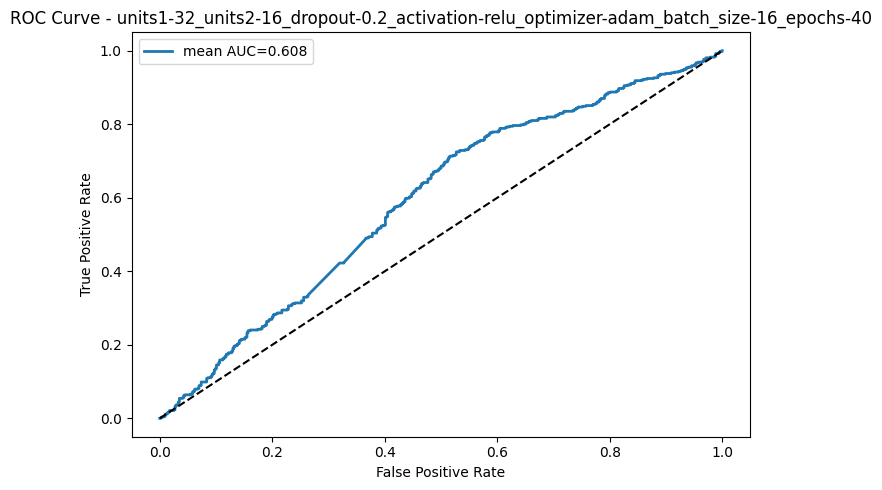

7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step 
Modelo hiperparams: units1-32_units2-16_dropout-0.2_activation-relu_optimizer-adam_batch_size-32_epochs-40
AUC promedio en CV: 0.593


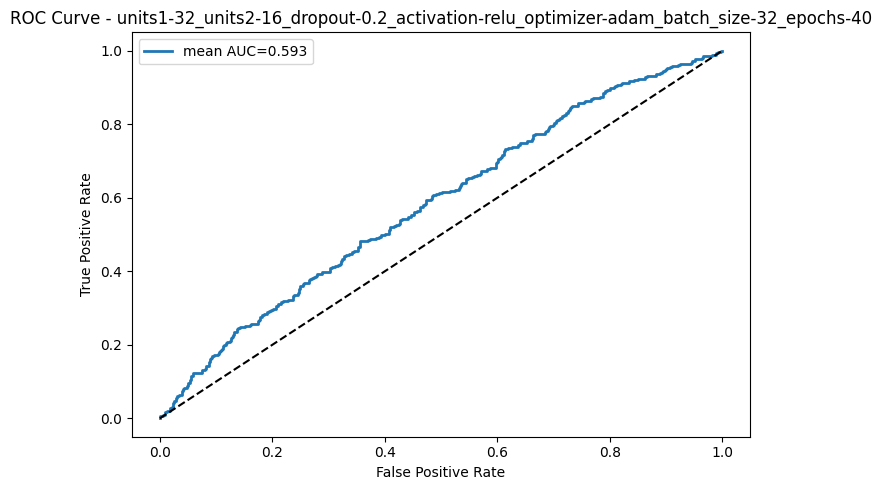

7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step 
Modelo hiperparams: units1-32_units2-16_dropout-0.2_activation-relu_optimizer-adam_batch_size-64_epochs-40
AUC promedio en CV: 0.601


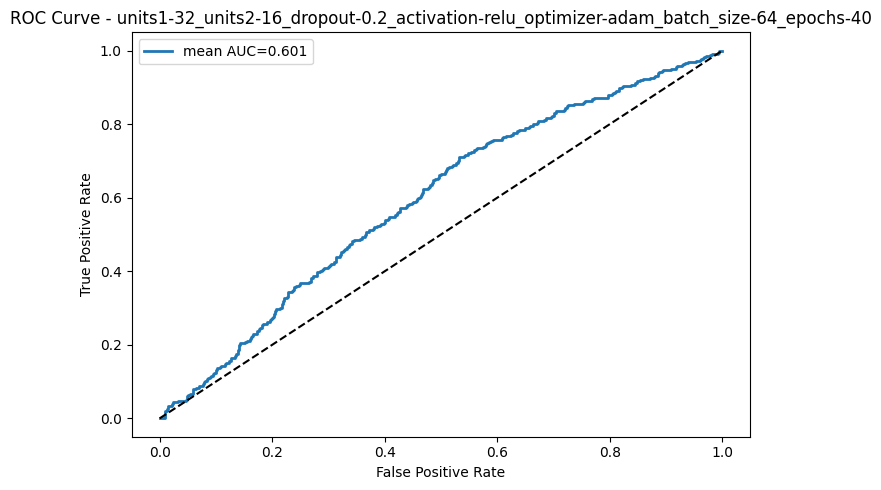

7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step 
Modelo hiperparams: units1-32_units2-16_dropout-0.2_activation-relu_optimizer-rmsprop_batch_size-16_epochs-40
AUC promedio en CV: 0.589


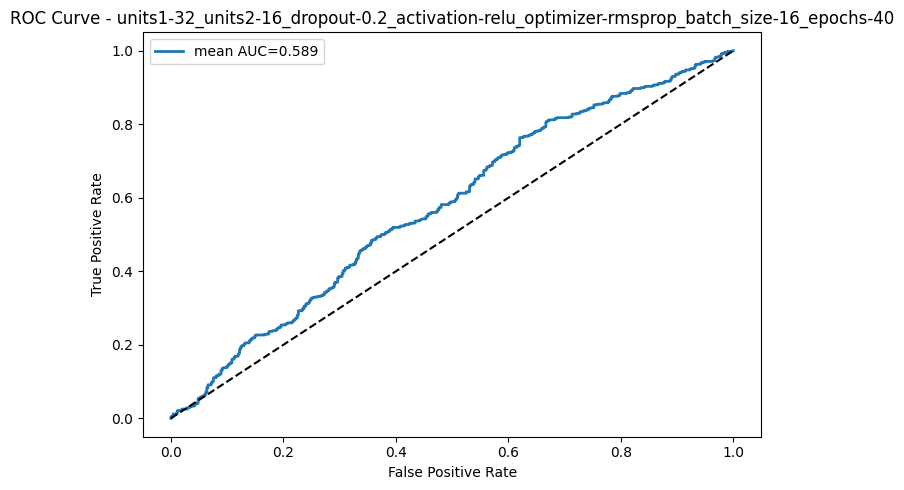

7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step 
Modelo hiperparams: units1-32_units2-16_dropout-0.2_activation-relu_optimizer-rmsprop_batch_size-32_epochs-40
AUC promedio en CV: 0.592


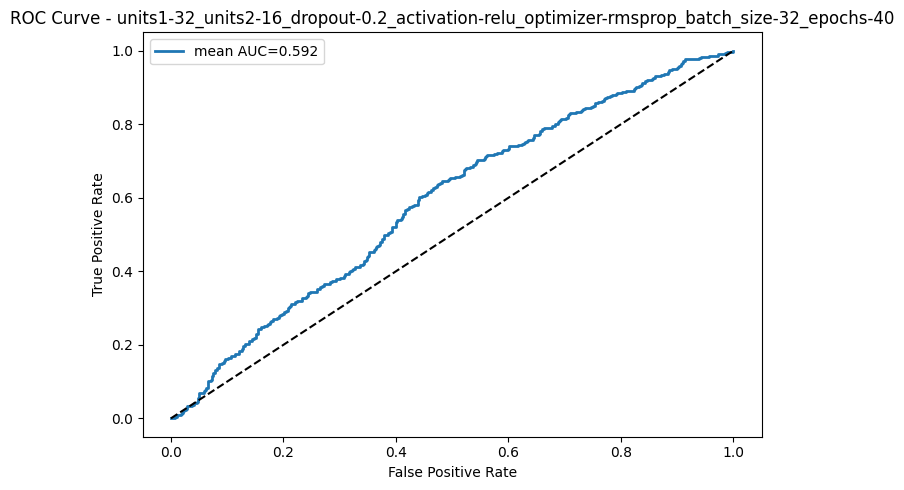

7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step 
Modelo hiperparams: units1-32_units2-16_dropout-0.2_activation-relu_optimizer-rmsprop_batch_size-64_epochs-40
AUC promedio en CV: 0.586


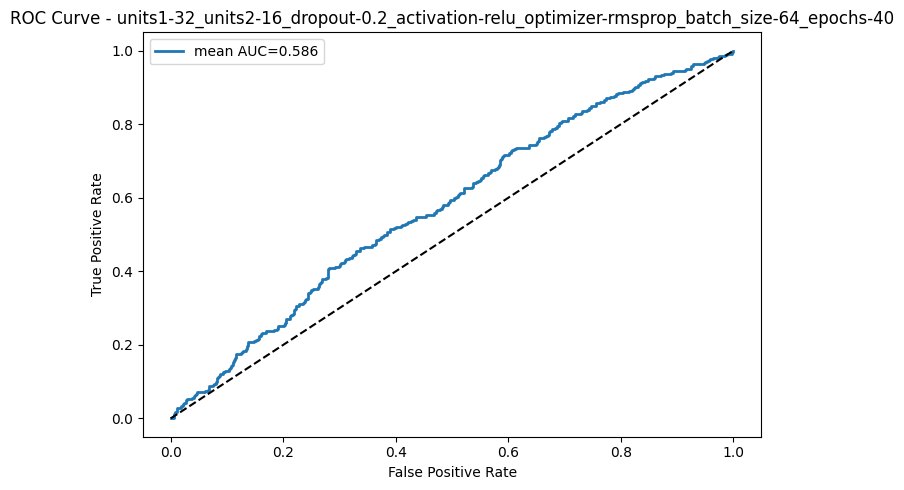

7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step 
Modelo hiperparams: units1-32_units2-16_dropout-0.2_activation-tanh_optimizer-adam_batch_size-16_epochs-40
AUC promedio en CV: 0.628


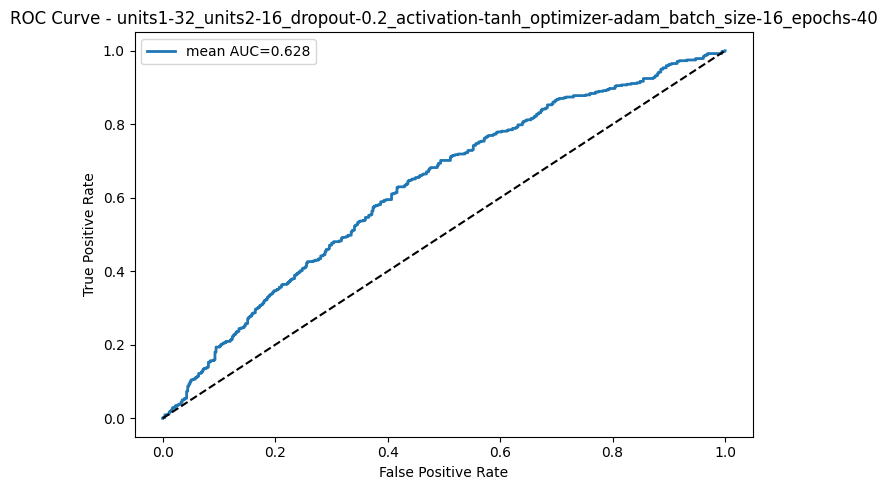

7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step 
Modelo hiperparams: units1-32_units2-16_dropout-0.2_activation-tanh_optimizer-adam_batch_size-32_epochs-40
AUC promedio en CV: 0.626


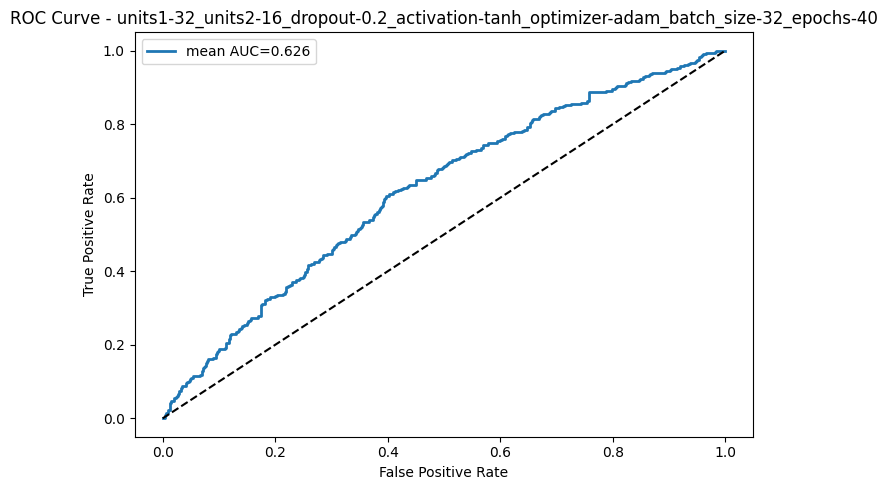

7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step 
Modelo hiperparams: units1-32_units2-16_dropout-0.2_activation-tanh_optimizer-adam_batch_size-64_epochs-40
AUC promedio en CV: 0.642


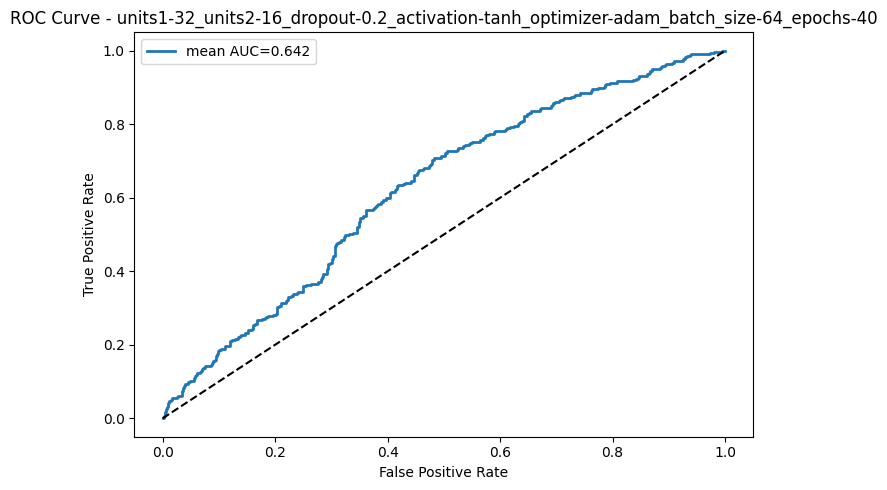

7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step 
Modelo hiperparams: units1-32_units2-16_dropout-0.2_activation-tanh_optimizer-rmsprop_batch_size-16_epochs-40
AUC promedio en CV: 0.621


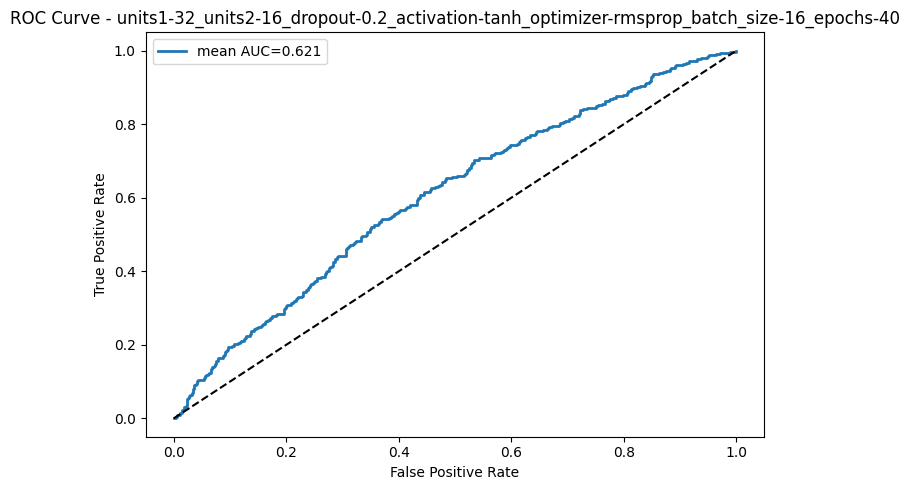

7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step 
Modelo hiperparams: units1-32_units2-16_dropout-0.2_activation-tanh_optimizer-rmsprop_batch_size-32_epochs-40
AUC promedio en CV: 0.640


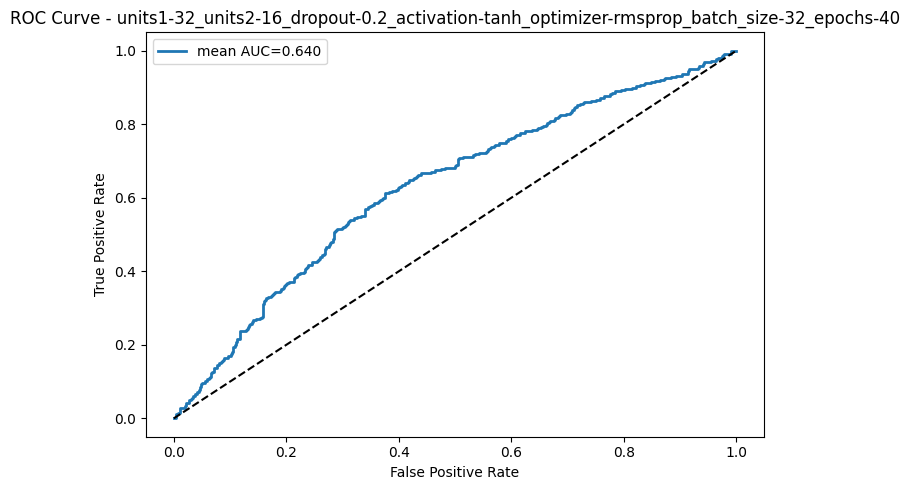

7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step 
Modelo hiperparams: units1-32_units2-16_dropout-0.2_activation-tanh_optimizer-rmsprop_batch_size-64_epochs-40
AUC promedio en CV: 0.605


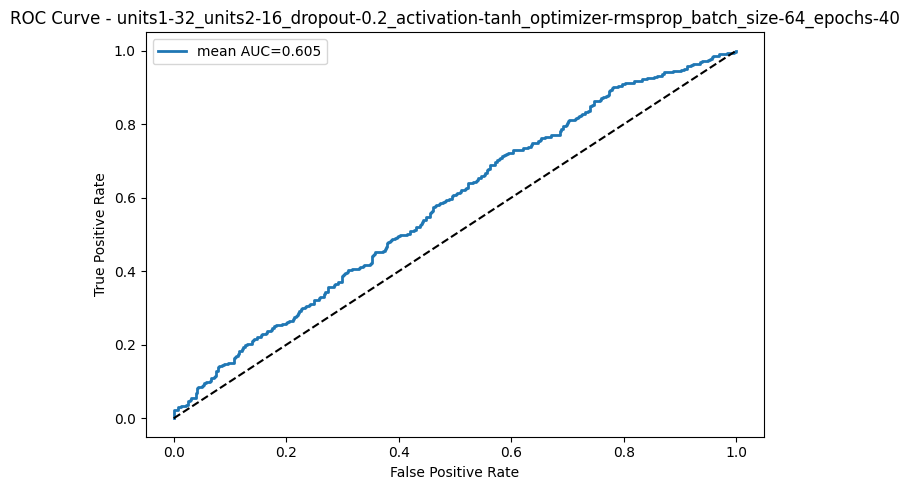

7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step 
Modelo hiperparams: units1-32_units2-16_dropout-0.2_activation-elu_optimizer-adam_batch_size-16_epochs-40
AUC promedio en CV: 0.625


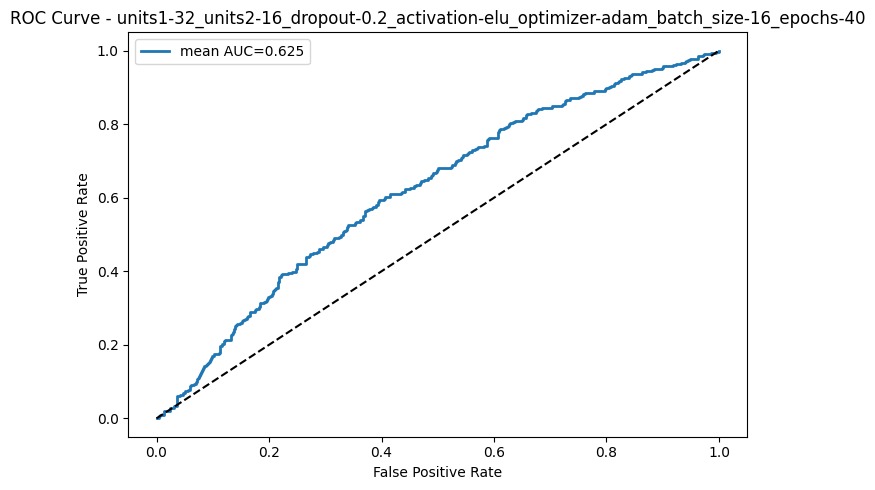

7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 
Modelo hiperparams: units1-32_units2-16_dropout-0.2_activation-elu_optimizer-adam_batch_size-32_epochs-40
AUC promedio en CV: 0.640


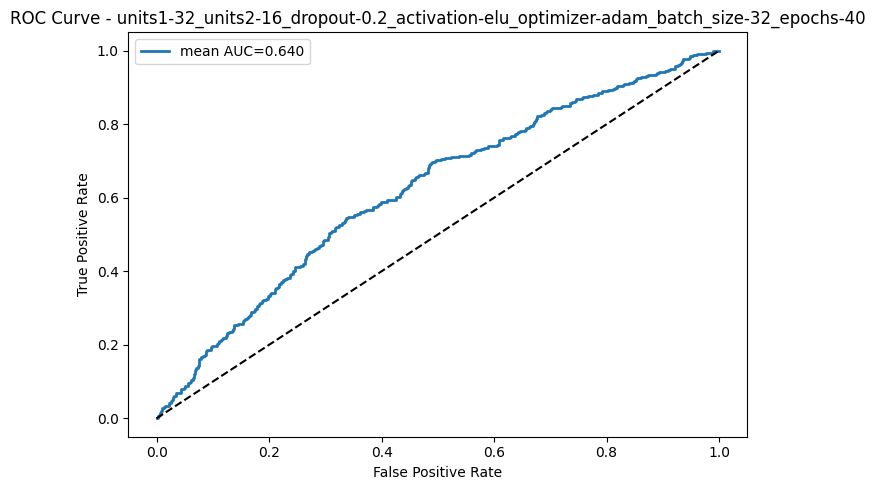

7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step 
Modelo hiperparams: units1-32_units2-16_dropout-0.2_activation-elu_optimizer-adam_batch_size-64_epochs-40
AUC promedio en CV: 0.623


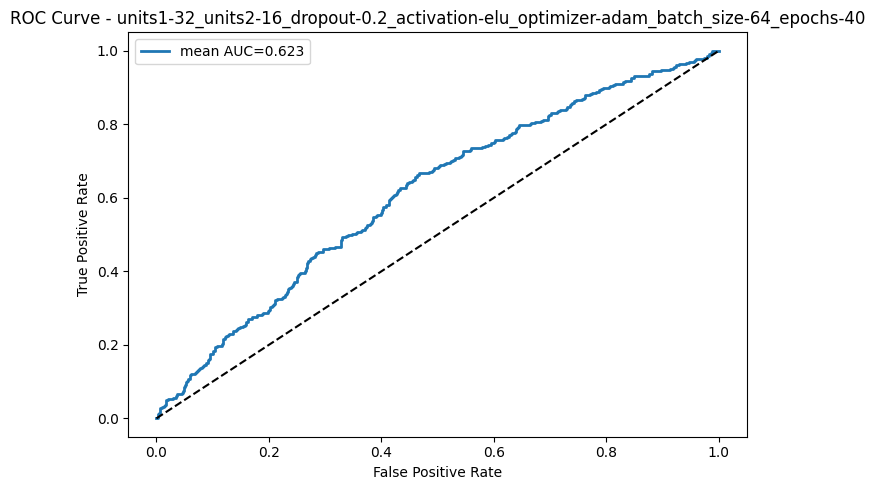

7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step 
Modelo hiperparams: units1-32_units2-16_dropout-0.2_activation-elu_optimizer-rmsprop_batch_size-16_epochs-40
AUC promedio en CV: 0.621


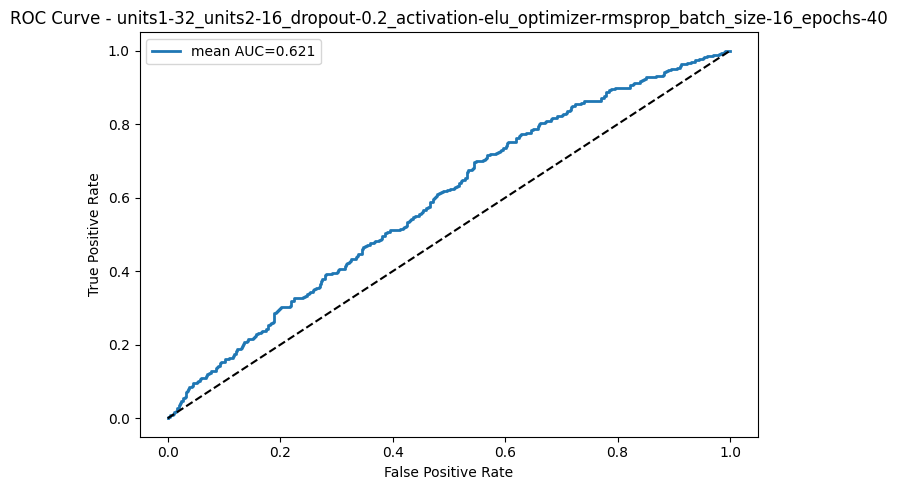

7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step 
Modelo hiperparams: units1-32_units2-16_dropout-0.2_activation-elu_optimizer-rmsprop_batch_size-32_epochs-40
AUC promedio en CV: 0.621


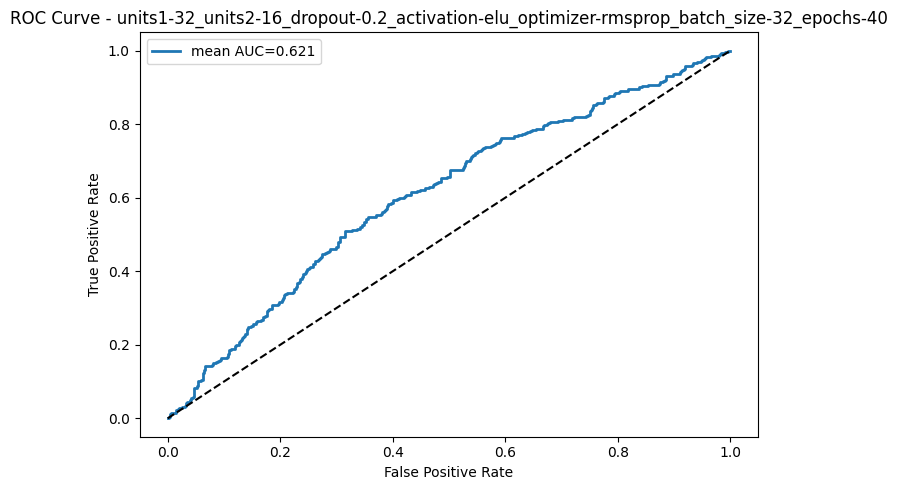

7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 
Modelo hiperparams: units1-32_units2-16_dropout-0.2_activation-elu_optimizer-rmsprop_batch_size-64_epochs-40
AUC promedio en CV: 0.621


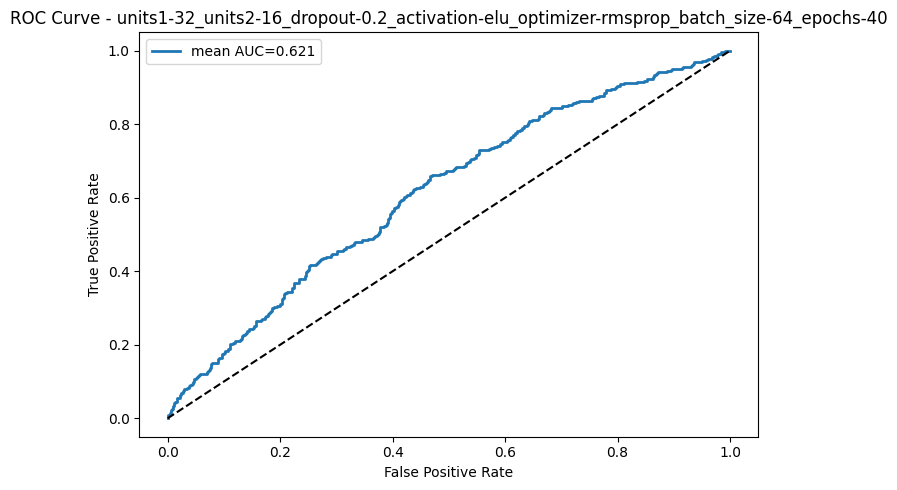

7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 
Modelo hiperparams: units1-32_units2-16_dropout-0.5_activation-relu_optimizer-adam_batch_size-16_epochs-40
AUC promedio en CV: 0.507


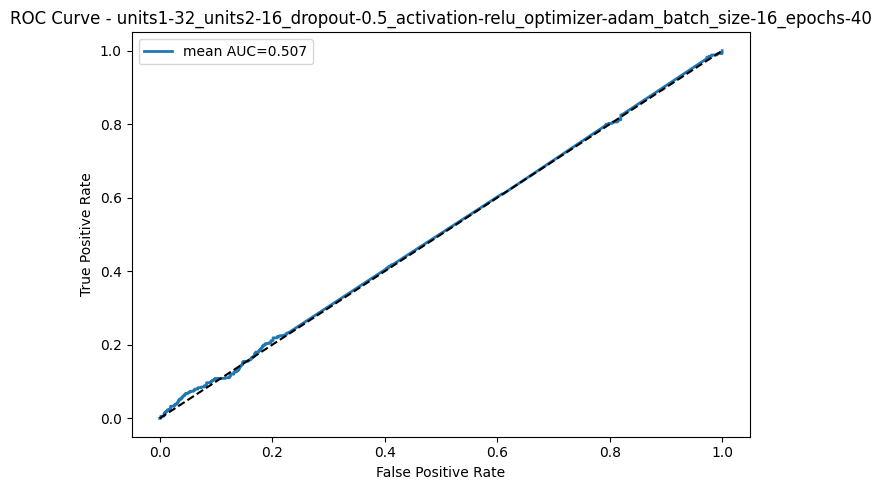

7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 
Modelo hiperparams: units1-32_units2-16_dropout-0.5_activation-relu_optimizer-adam_batch_size-32_epochs-40
AUC promedio en CV: 0.581


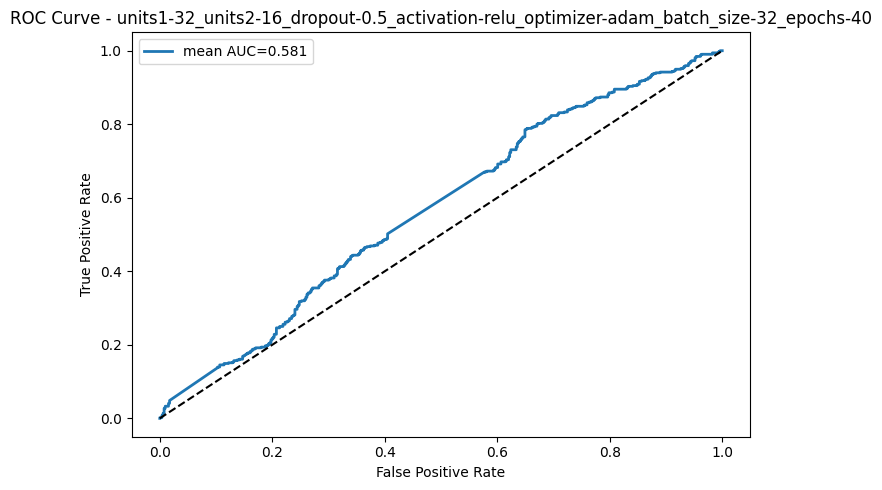

7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step 
Modelo hiperparams: units1-32_units2-16_dropout-0.5_activation-relu_optimizer-adam_batch_size-64_epochs-40
AUC promedio en CV: 0.568


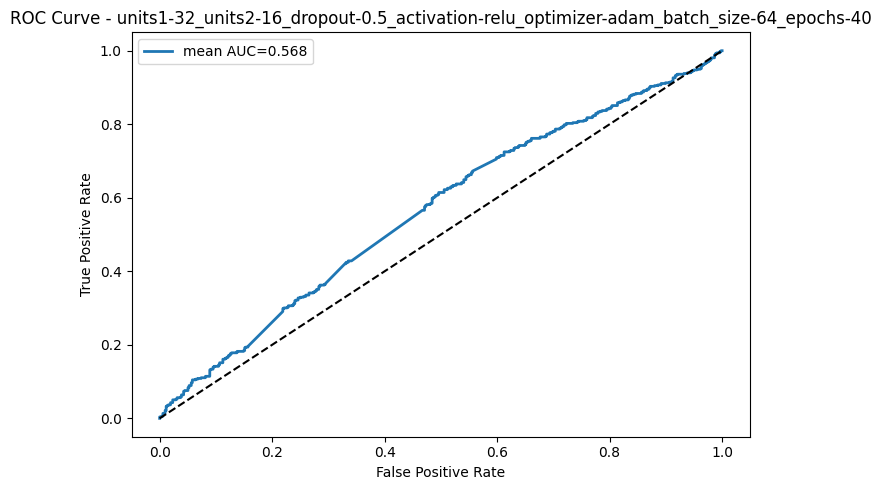

7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step 
Modelo hiperparams: units1-32_units2-16_dropout-0.5_activation-relu_optimizer-rmsprop_batch_size-16_epochs-40
AUC promedio en CV: 0.530


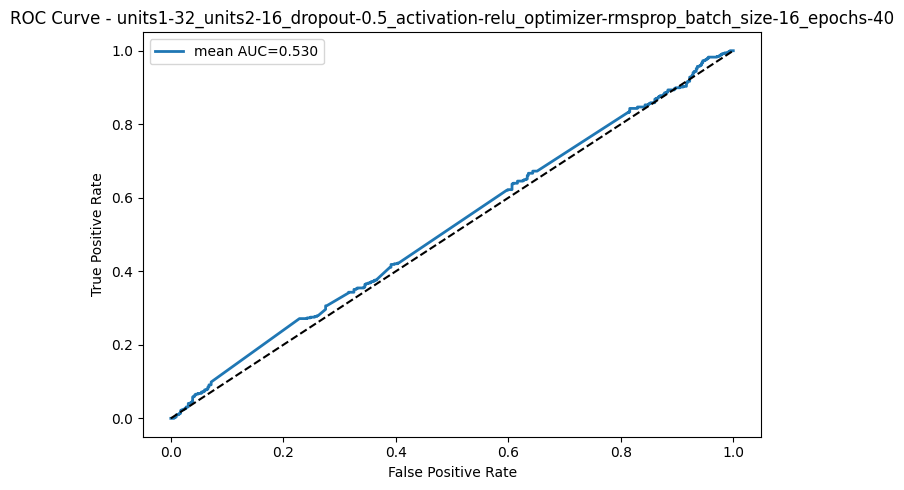

7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step 
Modelo hiperparams: units1-32_units2-16_dropout-0.5_activation-relu_optimizer-rmsprop_batch_size-32_epochs-40
AUC promedio en CV: 0.531


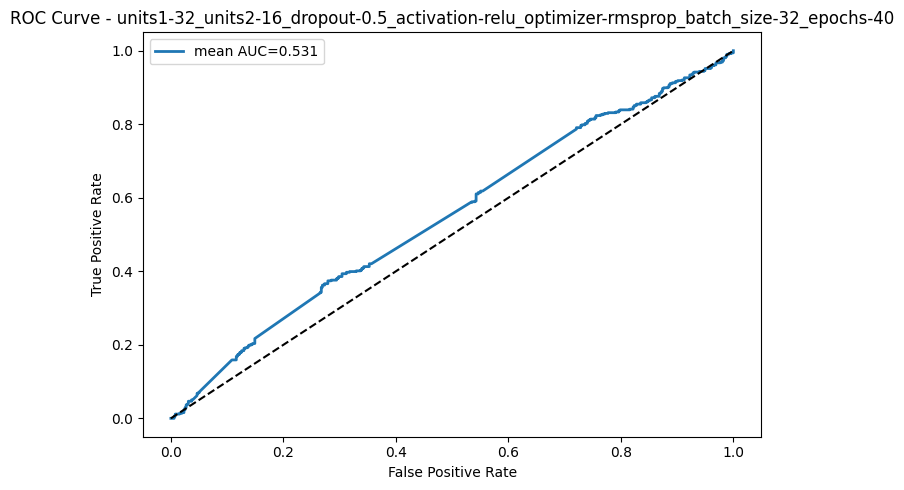

7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step 
Modelo hiperparams: units1-32_units2-16_dropout-0.5_activation-relu_optimizer-rmsprop_batch_size-64_epochs-40
AUC promedio en CV: 0.564


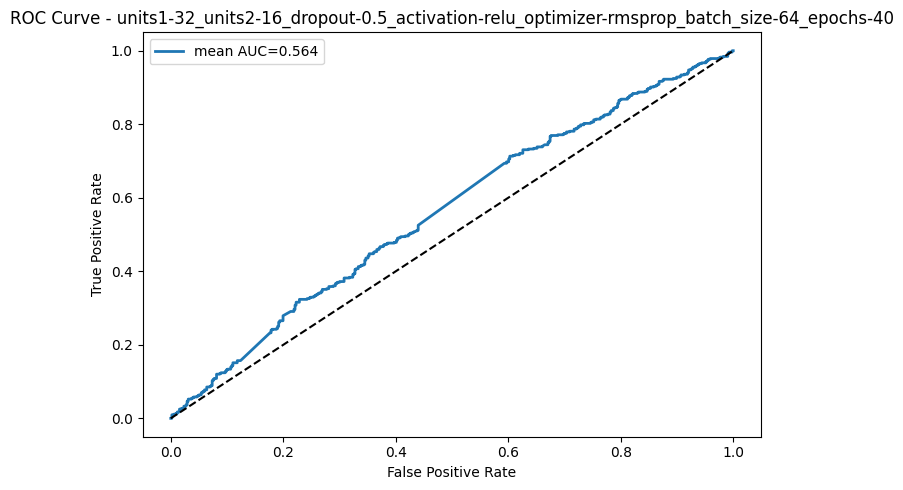

7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 
Modelo hiperparams: units1-32_units2-16_dropout-0.5_activation-tanh_optimizer-adam_batch_size-16_epochs-40
AUC promedio en CV: 0.608


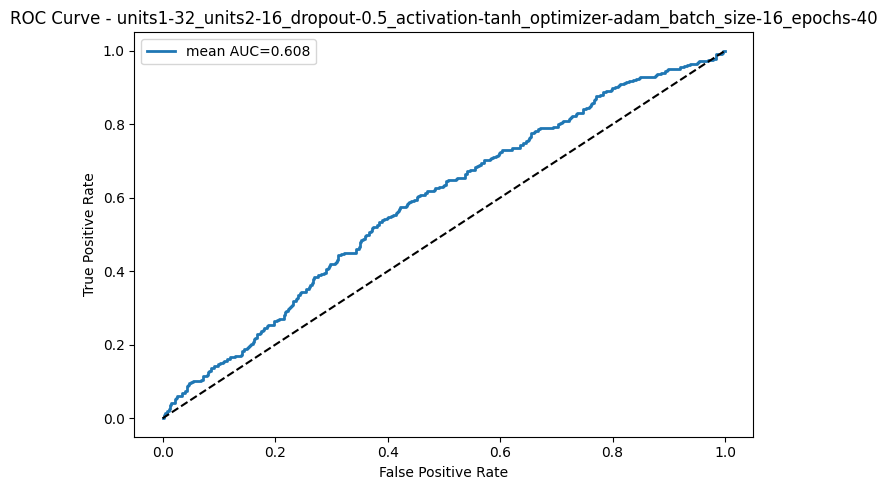

7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step 
Modelo hiperparams: units1-32_units2-16_dropout-0.5_activation-tanh_optimizer-adam_batch_size-32_epochs-40
AUC promedio en CV: 0.591


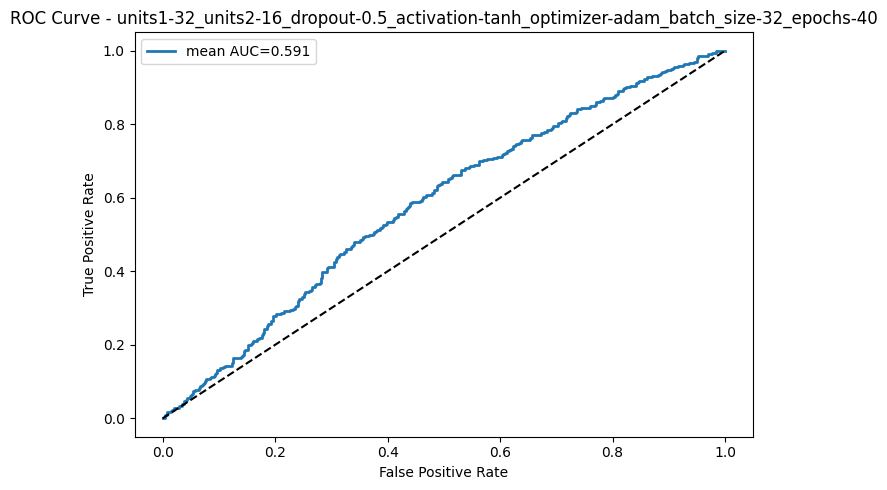

7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step 
Modelo hiperparams: units1-32_units2-16_dropout-0.5_activation-tanh_optimizer-adam_batch_size-64_epochs-40
AUC promedio en CV: 0.607


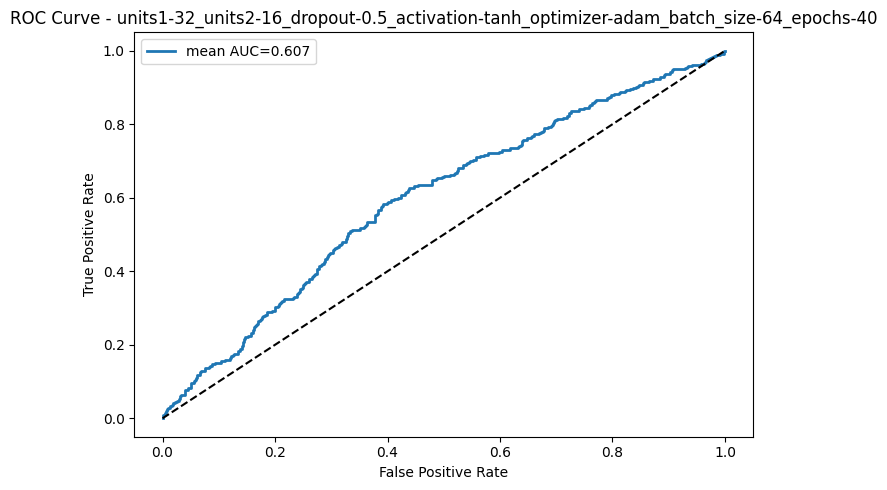

7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
Modelo hiperparams: units1-32_units2-16_dropout-0.5_activation-tanh_optimizer-rmsprop_batch_size-16_epochs-40
AUC promedio en CV: 0.601


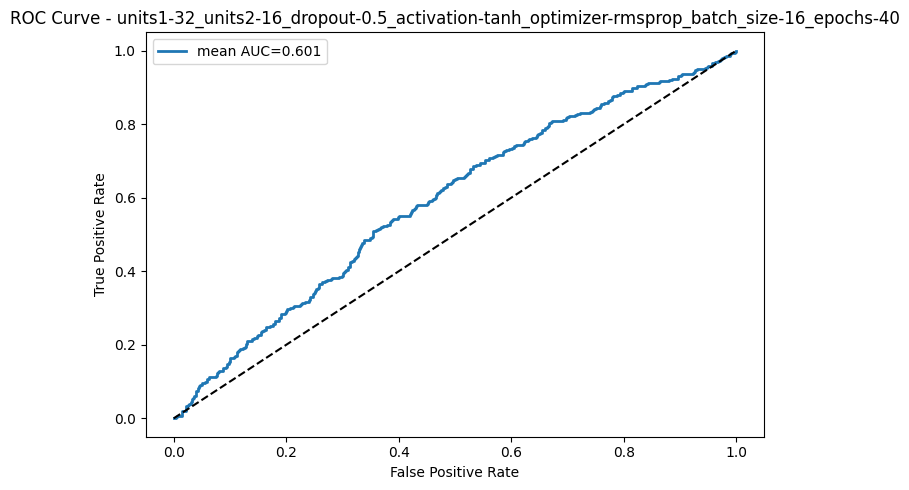

7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step 
Modelo hiperparams: units1-32_units2-16_dropout-0.5_activation-tanh_optimizer-rmsprop_batch_size-32_epochs-40
AUC promedio en CV: 0.599


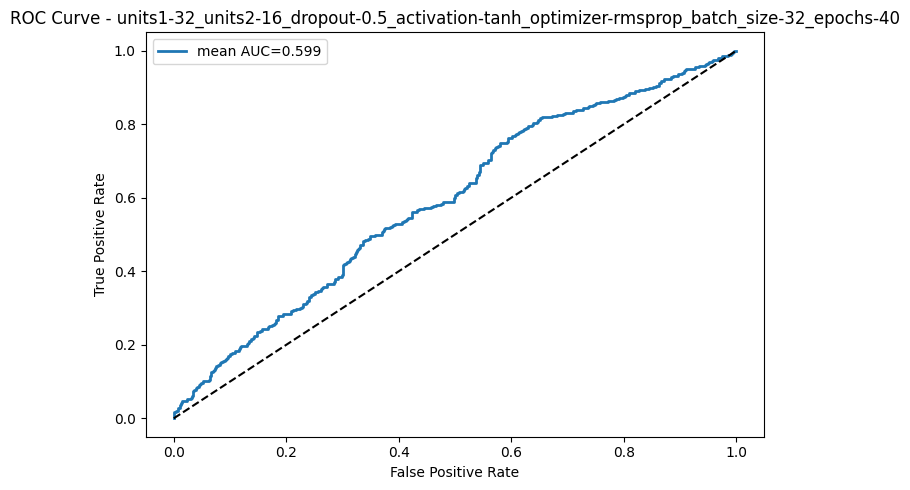

7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step 
Modelo hiperparams: units1-32_units2-16_dropout-0.5_activation-tanh_optimizer-rmsprop_batch_size-64_epochs-40
AUC promedio en CV: 0.613


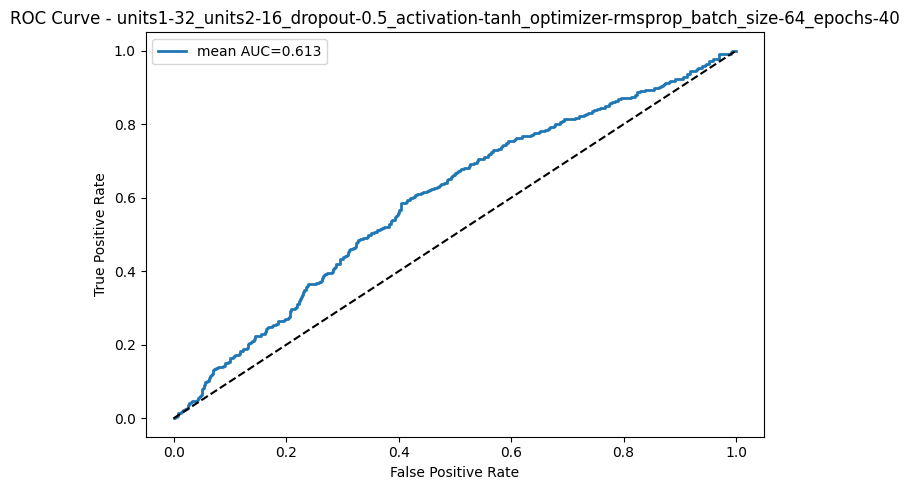

7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step 
Modelo hiperparams: units1-32_units2-16_dropout-0.5_activation-elu_optimizer-adam_batch_size-16_epochs-40
AUC promedio en CV: 0.610


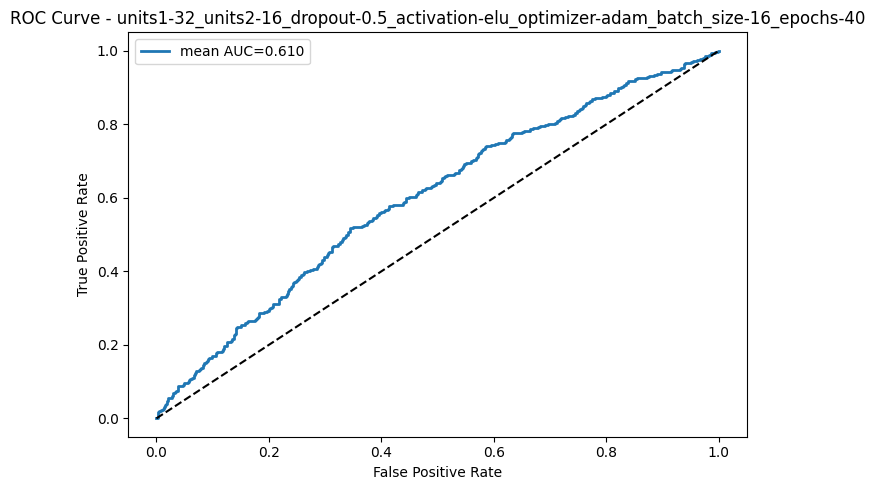

7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step 
Modelo hiperparams: units1-32_units2-16_dropout-0.5_activation-elu_optimizer-adam_batch_size-32_epochs-40
AUC promedio en CV: 0.609


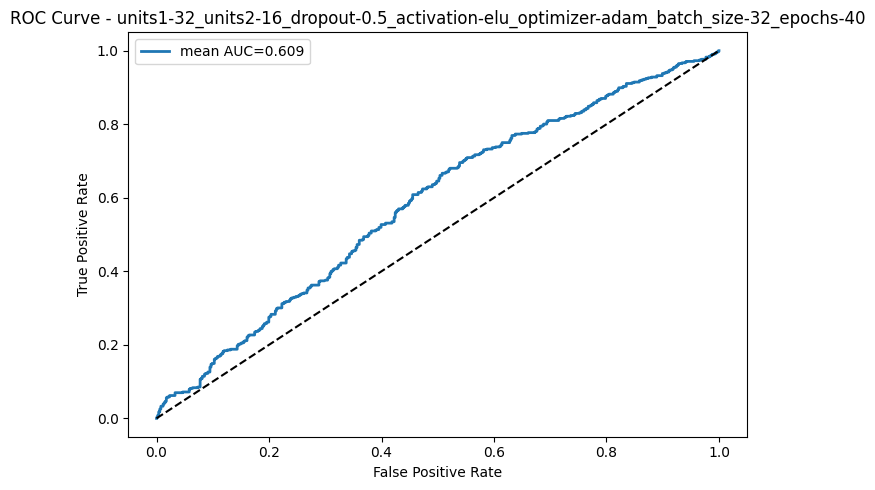

7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step 
Modelo hiperparams: units1-32_units2-16_dropout-0.5_activation-elu_optimizer-adam_batch_size-64_epochs-40
AUC promedio en CV: 0.604


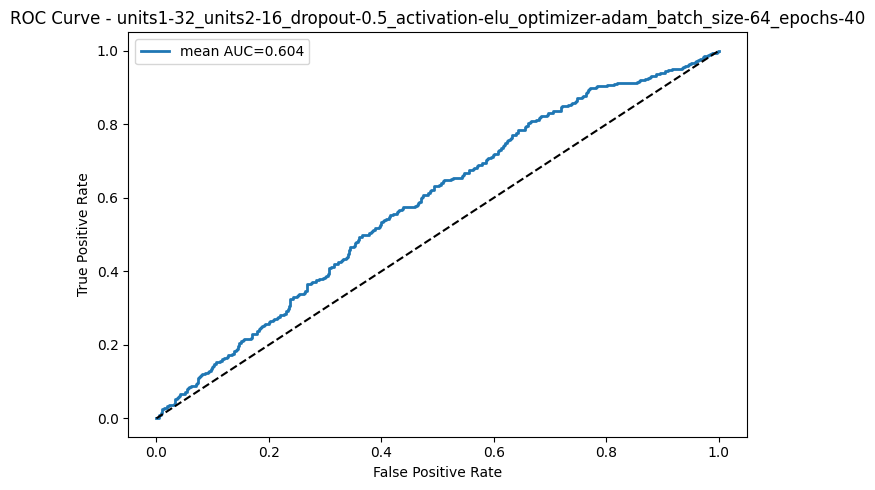

7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step 
Modelo hiperparams: units1-32_units2-16_dropout-0.5_activation-elu_optimizer-rmsprop_batch_size-16_epochs-40
AUC promedio en CV: 0.622


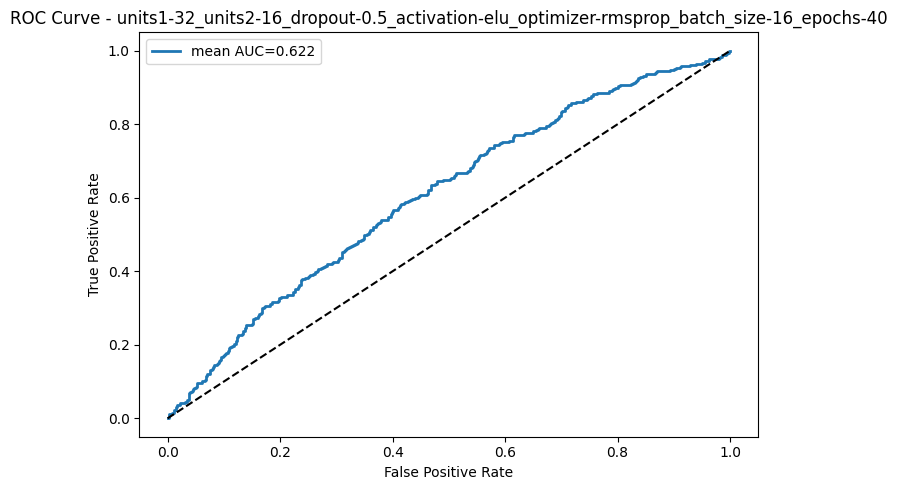

7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step 
Modelo hiperparams: units1-32_units2-16_dropout-0.5_activation-elu_optimizer-rmsprop_batch_size-32_epochs-40
AUC promedio en CV: 0.610


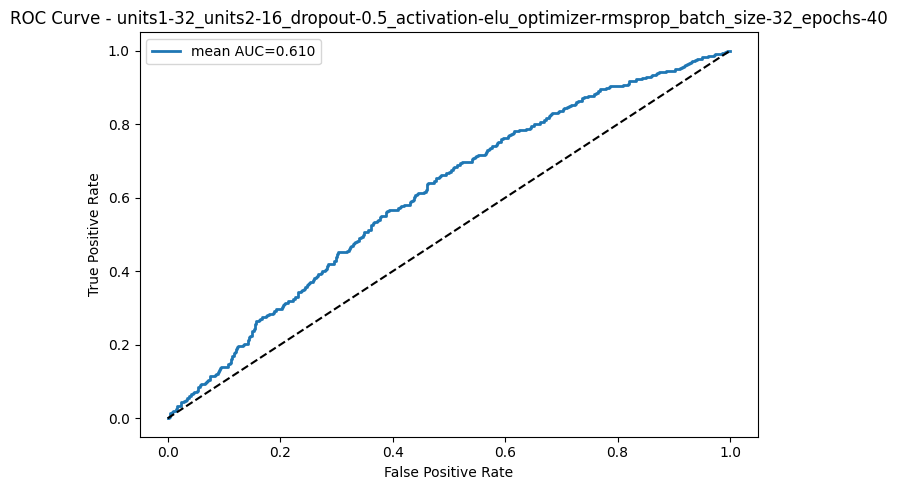

7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 
Modelo hiperparams: units1-32_units2-16_dropout-0.5_activation-elu_optimizer-rmsprop_batch_size-64_epochs-40
AUC promedio en CV: 0.595


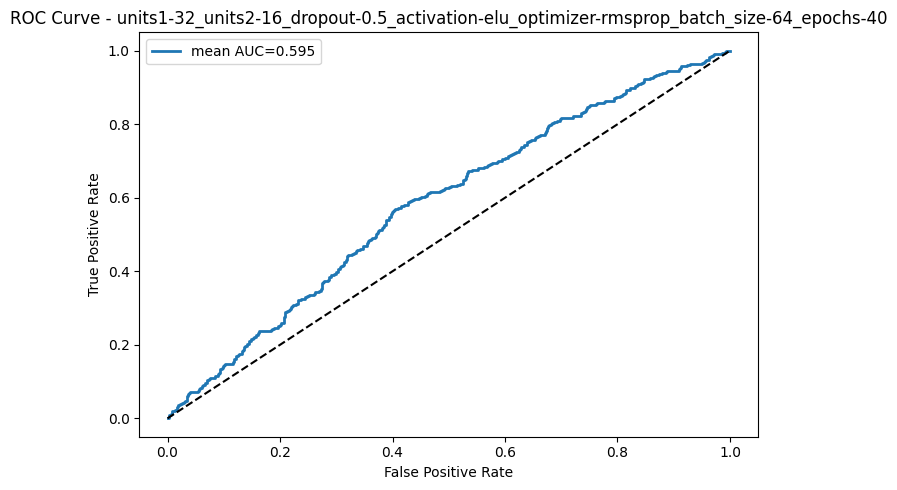

7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
Modelo hiperparams: units1-32_units2-32_dropout-0.2_activation-relu_optimizer-adam_batch_size-16_epochs-40
AUC promedio en CV: 0.571


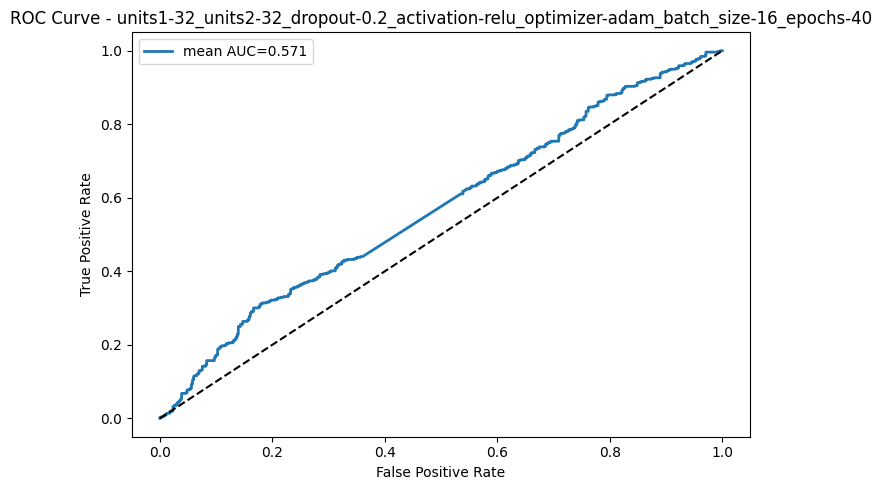

7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
Modelo hiperparams: units1-32_units2-32_dropout-0.2_activation-relu_optimizer-adam_batch_size-32_epochs-40
AUC promedio en CV: 0.593


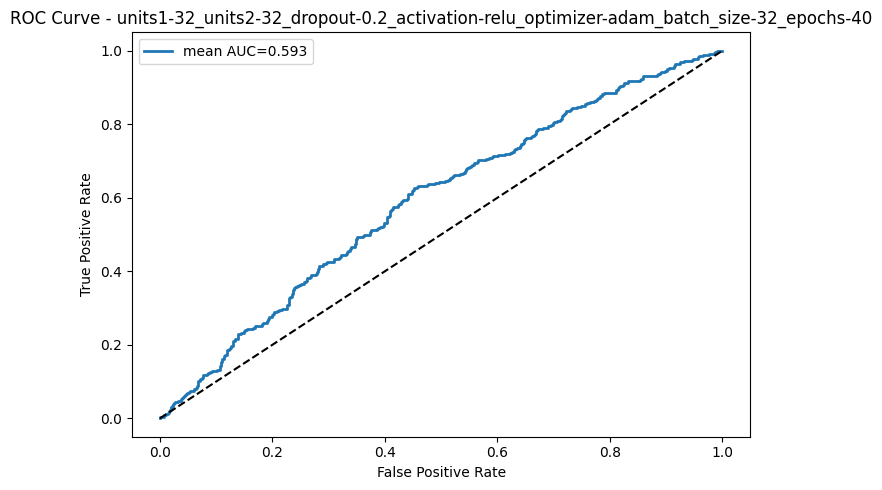

7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
Modelo hiperparams: units1-32_units2-32_dropout-0.2_activation-relu_optimizer-adam_batch_size-64_epochs-40
AUC promedio en CV: 0.604


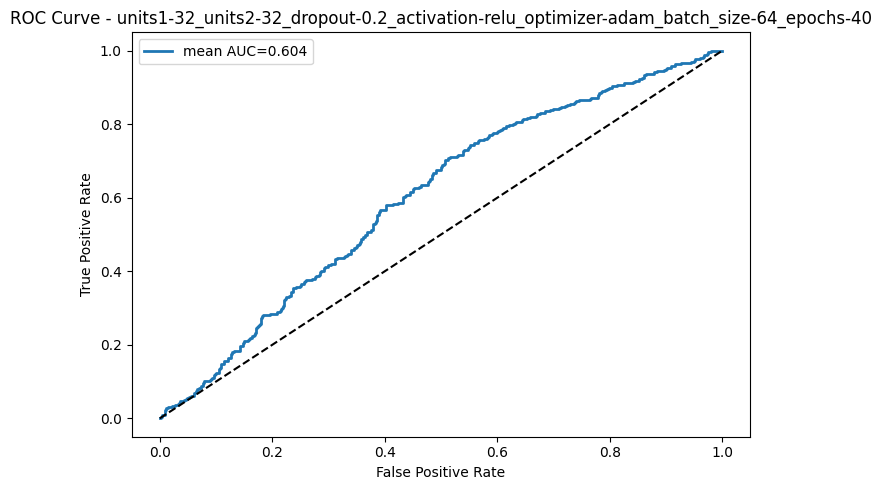

7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 
Modelo hiperparams: units1-32_units2-32_dropout-0.2_activation-relu_optimizer-rmsprop_batch_size-16_epochs-40
AUC promedio en CV: 0.601


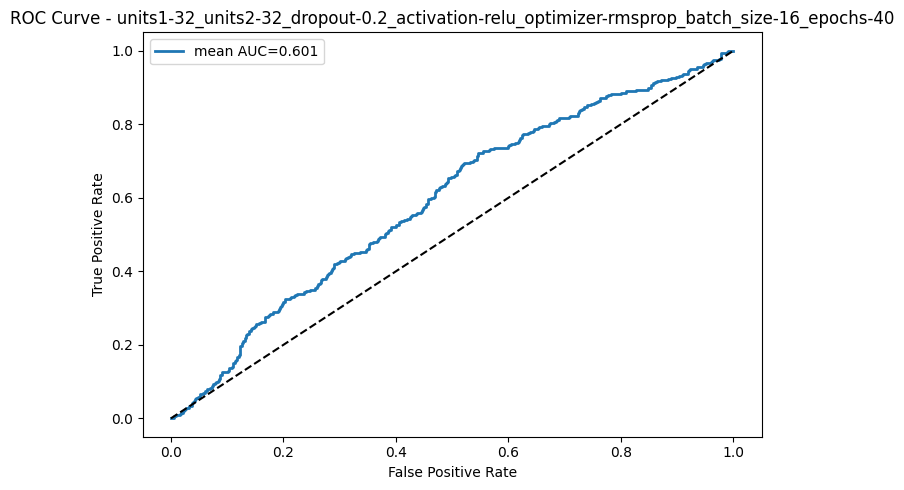

7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 
Modelo hiperparams: units1-32_units2-32_dropout-0.2_activation-relu_optimizer-rmsprop_batch_size-32_epochs-40
AUC promedio en CV: 0.601


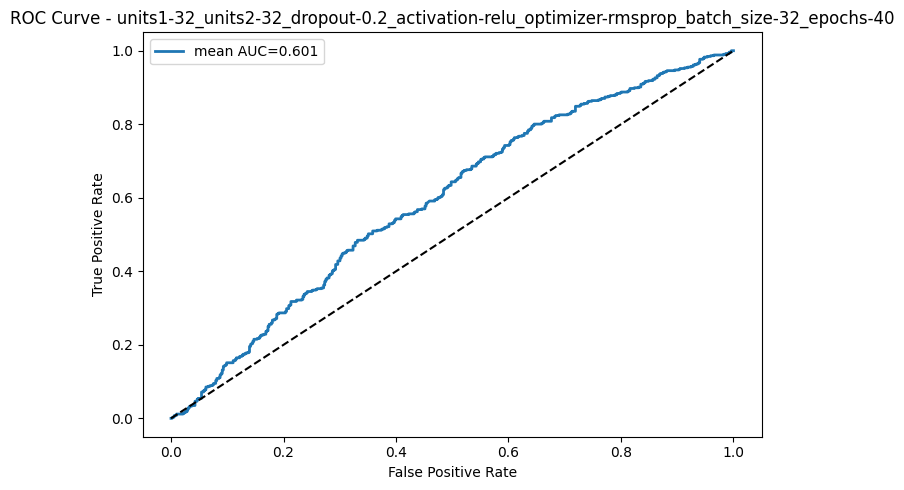

7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step
Modelo hiperparams: units1-32_units2-32_dropout-0.2_activation-relu_optimizer-rmsprop_batch_size-64_epochs-40
AUC promedio en CV: 0.608


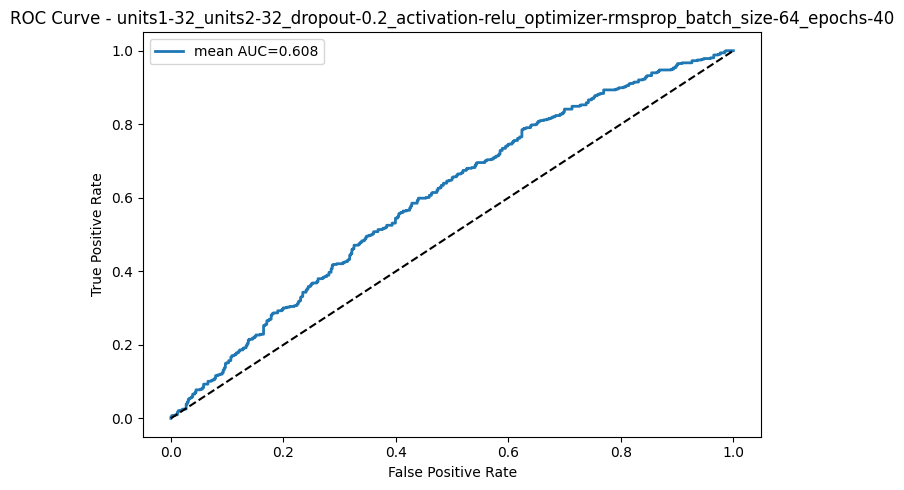

7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
Modelo hiperparams: units1-32_units2-32_dropout-0.2_activation-tanh_optimizer-adam_batch_size-16_epochs-40
AUC promedio en CV: 0.628


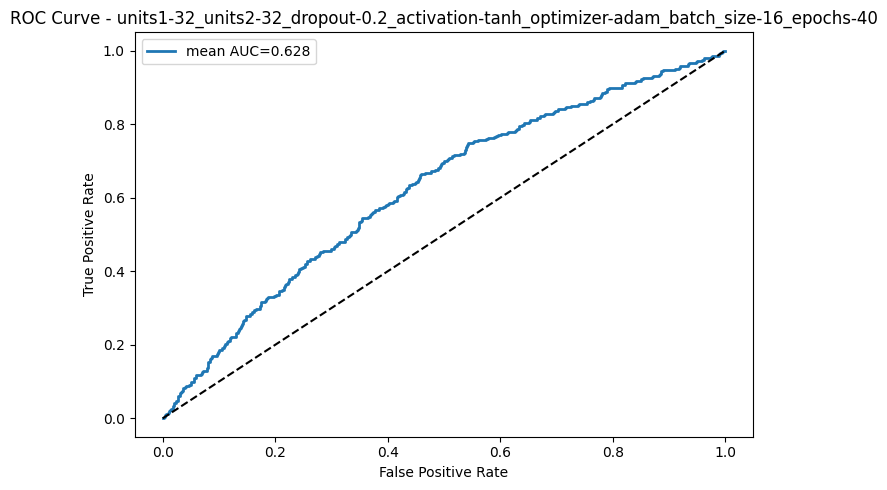

7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
Modelo hiperparams: units1-32_units2-32_dropout-0.2_activation-tanh_optimizer-adam_batch_size-32_epochs-40
AUC promedio en CV: 0.632


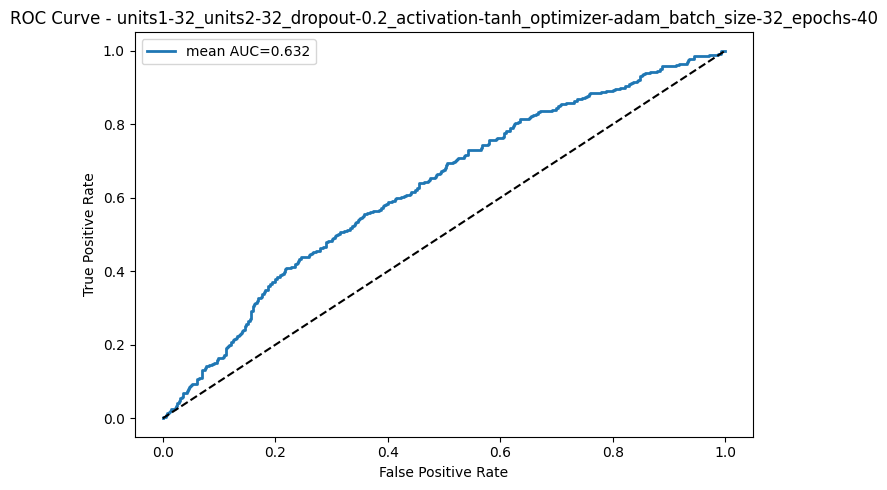

7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
Modelo hiperparams: units1-32_units2-32_dropout-0.2_activation-tanh_optimizer-adam_batch_size-64_epochs-40
AUC promedio en CV: 0.602


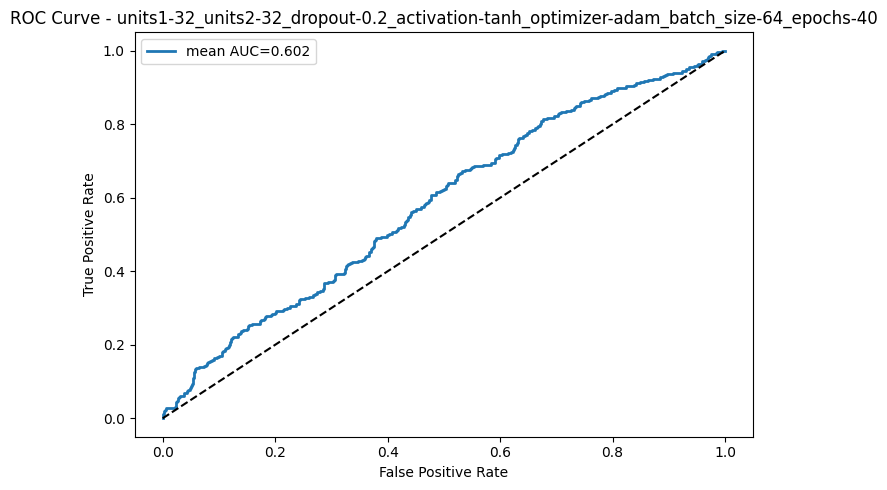

7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step 
Modelo hiperparams: units1-32_units2-32_dropout-0.2_activation-tanh_optimizer-rmsprop_batch_size-16_epochs-40
AUC promedio en CV: 0.616


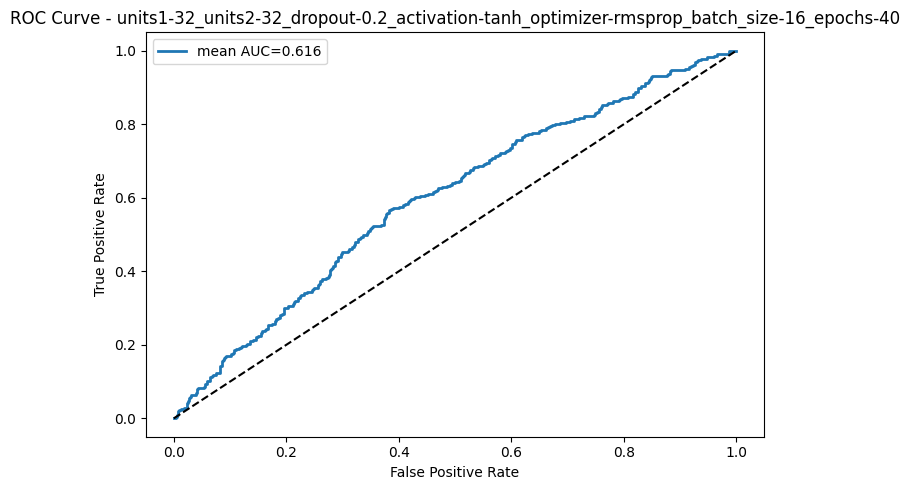

7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step
7/7 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step 
Modelo hiperparams: units1-32_units2-32_dropout-0.2_activation-tanh_optimizer-rmsprop_batch_size-32_epochs-40
AUC promedio en CV: 0.626


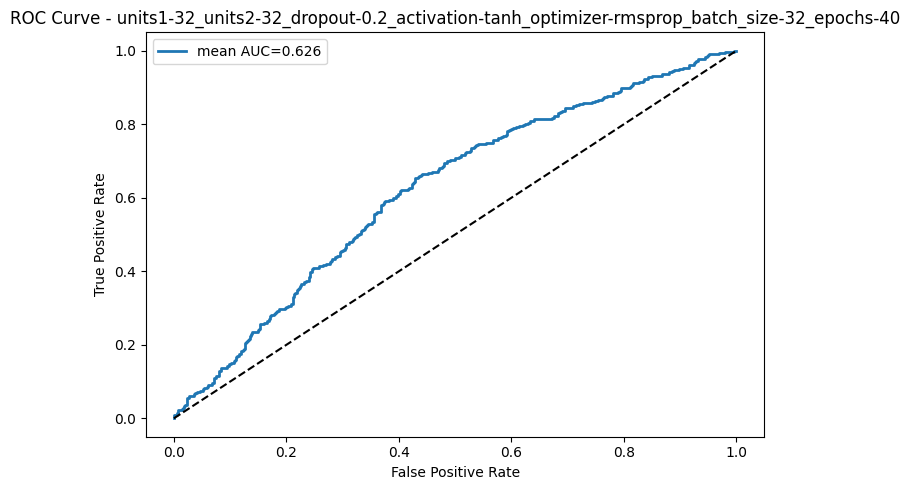

7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step 
Modelo hiperparams: units1-32_units2-32_dropout-0.2_activation-tanh_optimizer-rmsprop_batch_size-64_epochs-40
AUC promedio en CV: 0.630


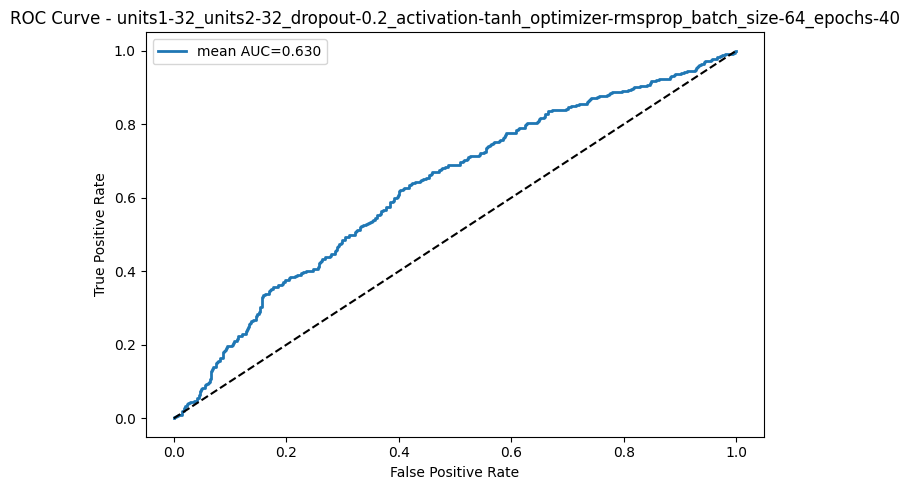

7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 
Modelo hiperparams: units1-32_units2-32_dropout-0.2_activation-elu_optimizer-adam_batch_size-16_epochs-40
AUC promedio en CV: 0.635


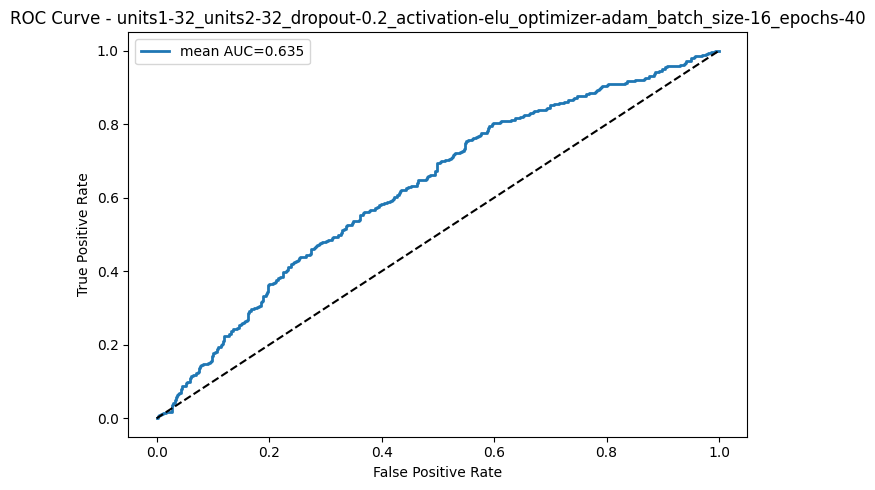

7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step 
Modelo hiperparams: units1-32_units2-32_dropout-0.2_activation-elu_optimizer-adam_batch_size-32_epochs-40
AUC promedio en CV: 0.630


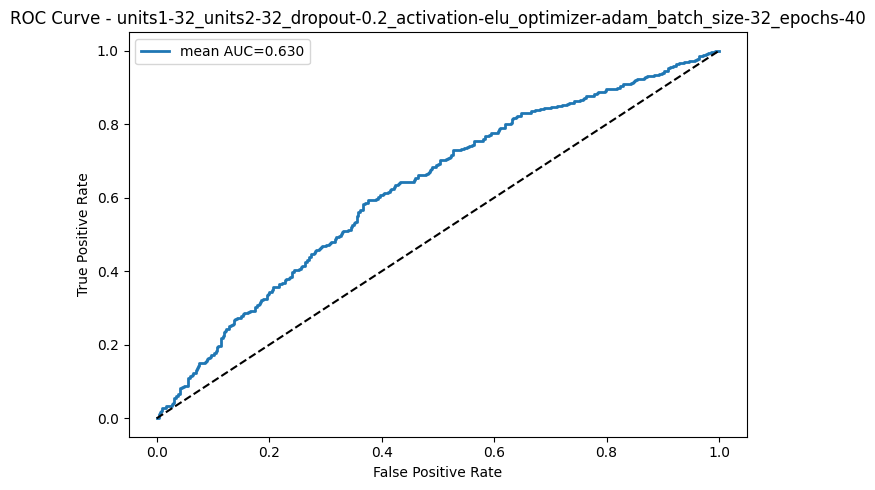

7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step 
Modelo hiperparams: units1-32_units2-32_dropout-0.2_activation-elu_optimizer-adam_batch_size-64_epochs-40
AUC promedio en CV: 0.620


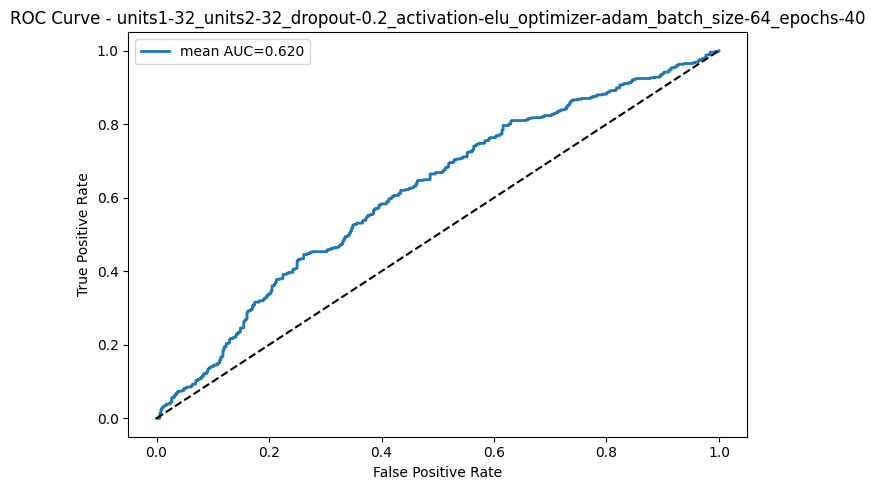

7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step 
Modelo hiperparams: units1-32_units2-32_dropout-0.2_activation-elu_optimizer-rmsprop_batch_size-16_epochs-40
AUC promedio en CV: 0.625


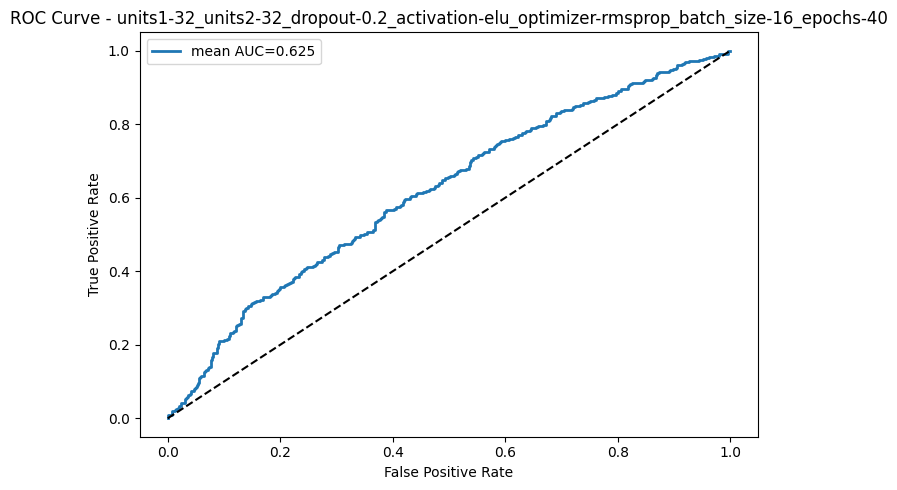

7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step 
Modelo hiperparams: units1-32_units2-32_dropout-0.2_activation-elu_optimizer-rmsprop_batch_size-32_epochs-40
AUC promedio en CV: 0.626


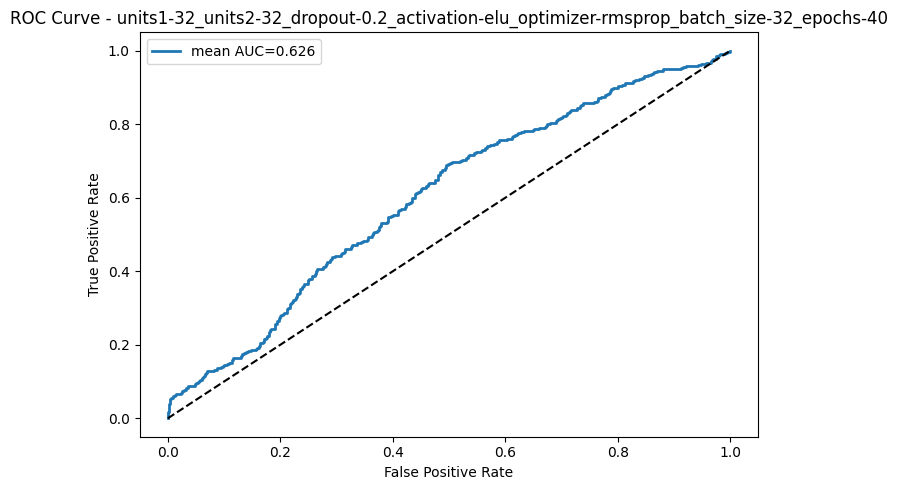

7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step 
Modelo hiperparams: units1-32_units2-32_dropout-0.2_activation-elu_optimizer-rmsprop_batch_size-64_epochs-40
AUC promedio en CV: 0.615


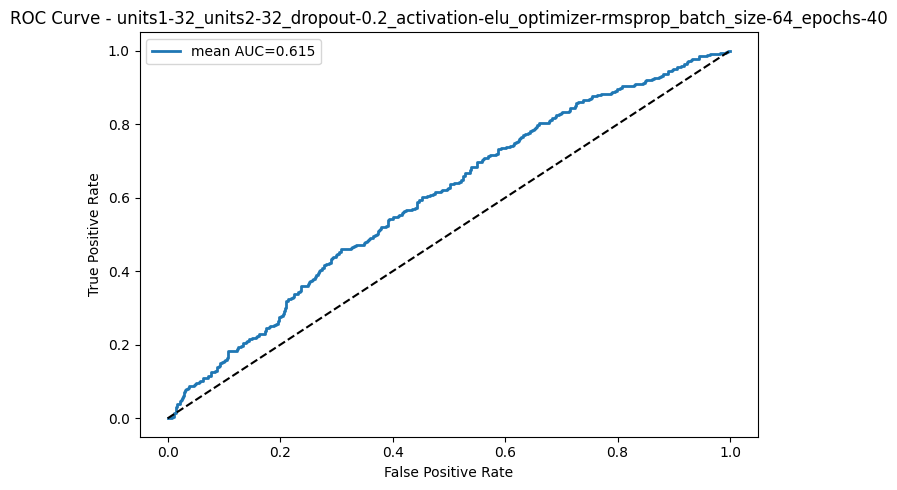

7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step 
Modelo hiperparams: units1-32_units2-32_dropout-0.5_activation-relu_optimizer-adam_batch_size-16_epochs-40
AUC promedio en CV: 0.519


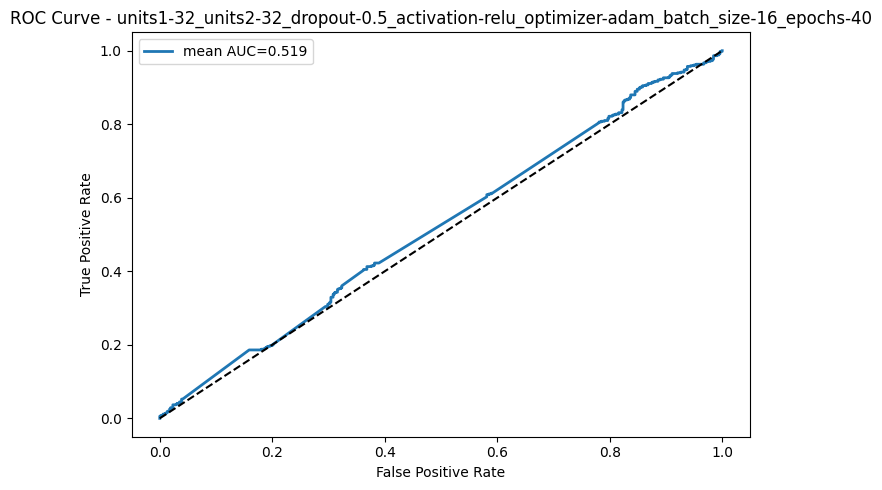

7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 
Modelo hiperparams: units1-32_units2-32_dropout-0.5_activation-relu_optimizer-adam_batch_size-32_epochs-40
AUC promedio en CV: 0.554


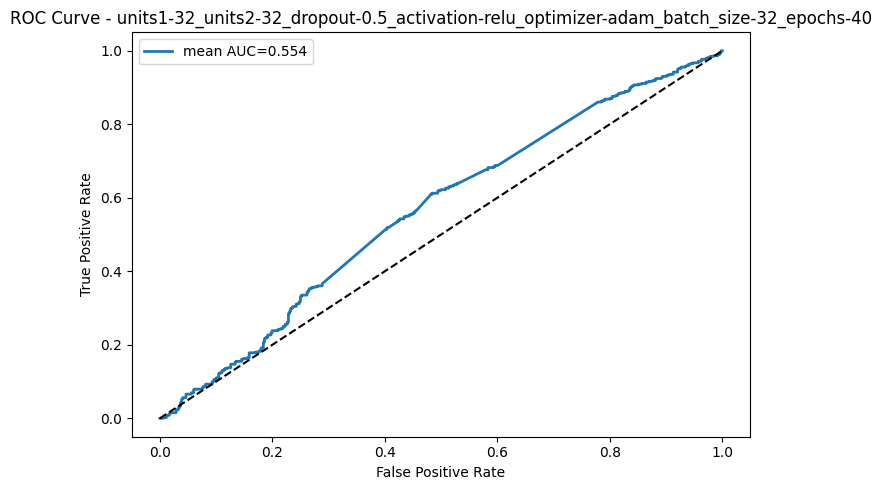

7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step 
Modelo hiperparams: units1-32_units2-32_dropout-0.5_activation-relu_optimizer-adam_batch_size-64_epochs-40
AUC promedio en CV: 0.561


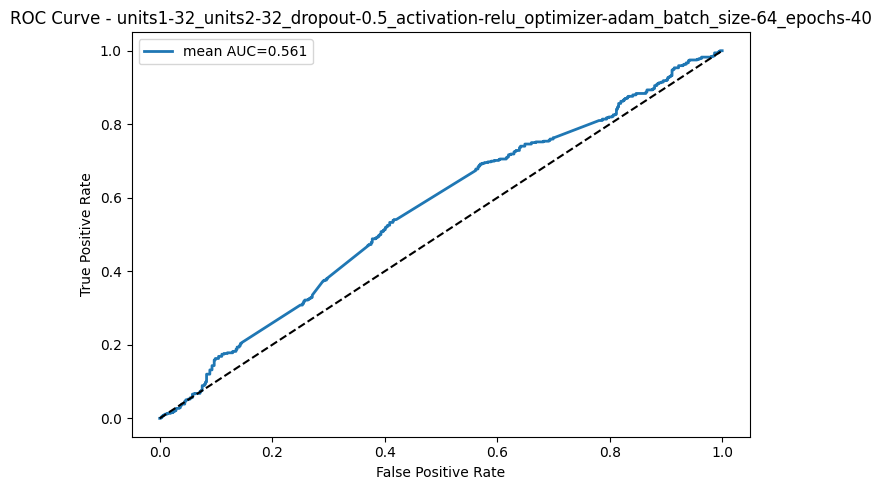

7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step 
Modelo hiperparams: units1-32_units2-32_dropout-0.5_activation-relu_optimizer-rmsprop_batch_size-16_epochs-40
AUC promedio en CV: 0.564


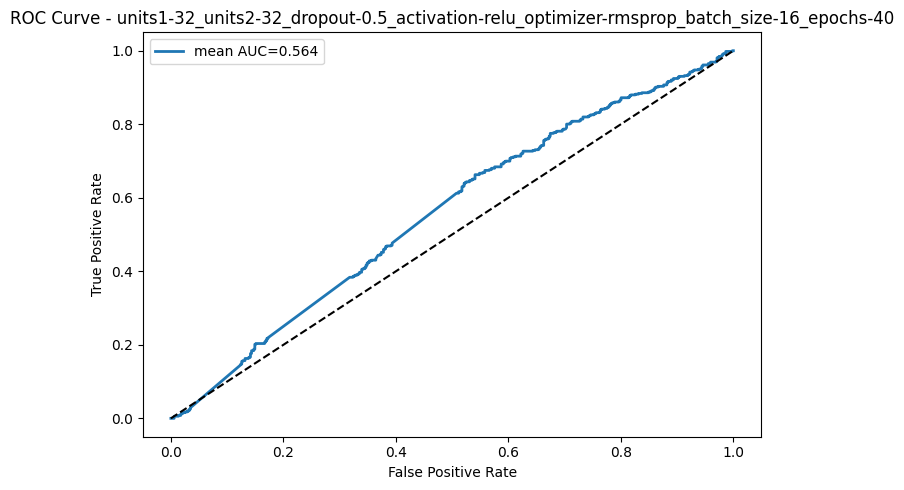

7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step
Modelo hiperparams: units1-32_units2-32_dropout-0.5_activation-relu_optimizer-rmsprop_batch_size-32_epochs-40
AUC promedio en CV: 0.580


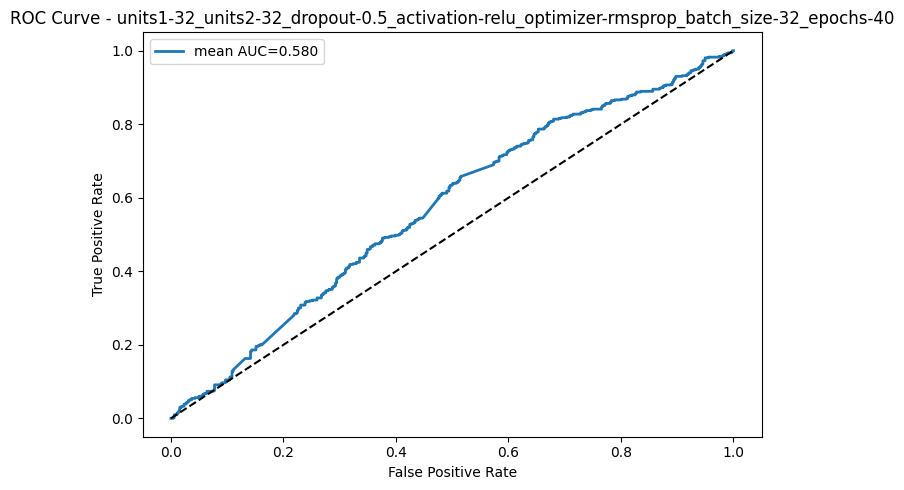

7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step 
Modelo hiperparams: units1-32_units2-32_dropout-0.5_activation-relu_optimizer-rmsprop_batch_size-64_epochs-40
AUC promedio en CV: 0.578


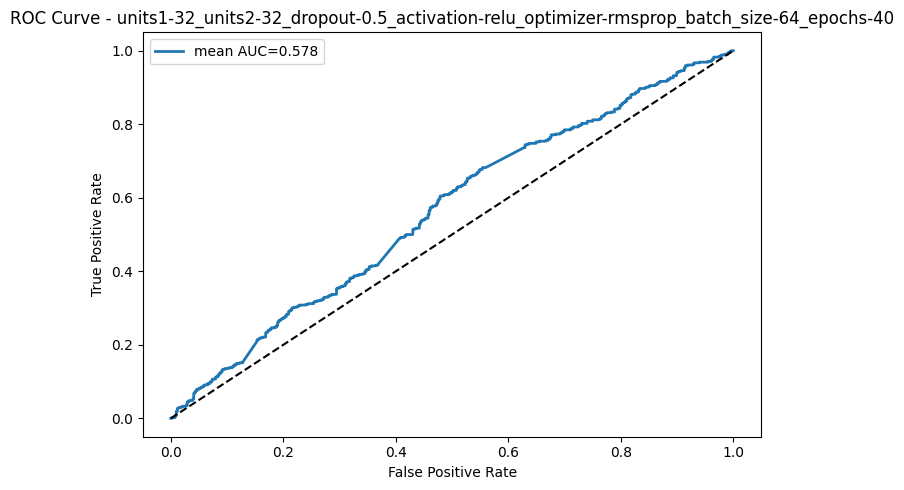

7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 
Modelo hiperparams: units1-32_units2-32_dropout-0.5_activation-tanh_optimizer-adam_batch_size-16_epochs-40
AUC promedio en CV: 0.606


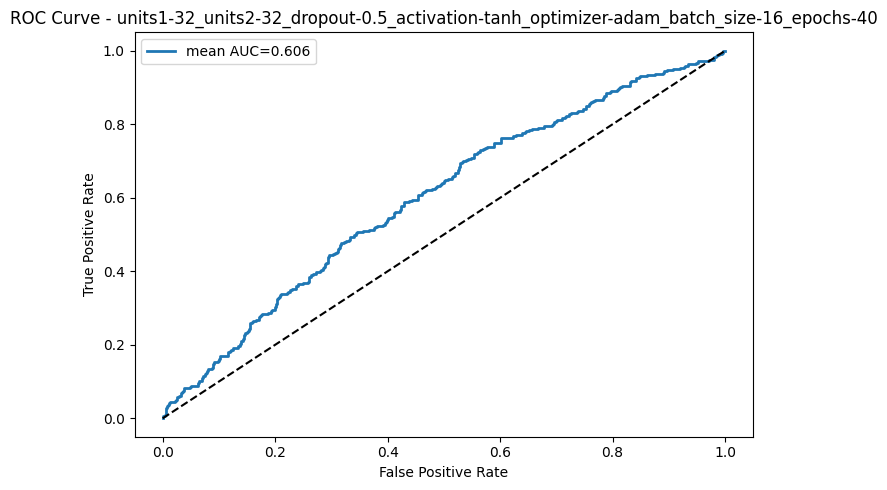

7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step 
Modelo hiperparams: units1-32_units2-32_dropout-0.5_activation-tanh_optimizer-adam_batch_size-32_epochs-40
AUC promedio en CV: 0.617


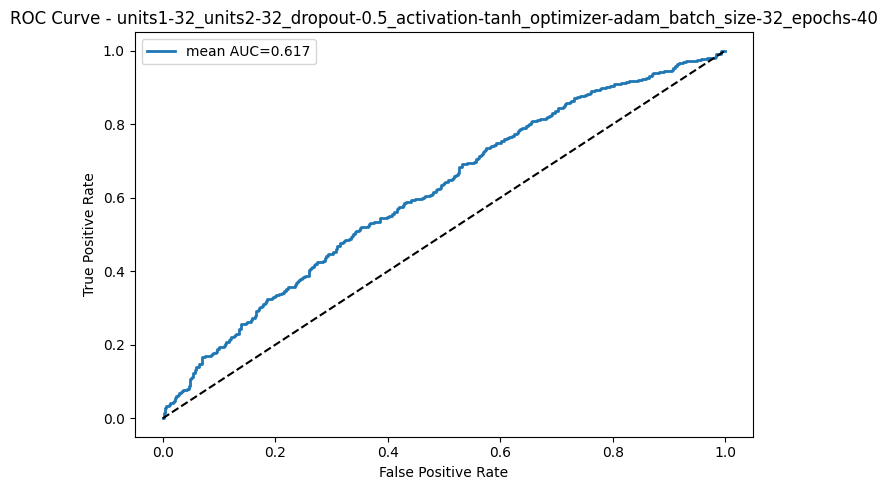

7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step 
Modelo hiperparams: units1-32_units2-32_dropout-0.5_activation-tanh_optimizer-adam_batch_size-64_epochs-40
AUC promedio en CV: 0.609


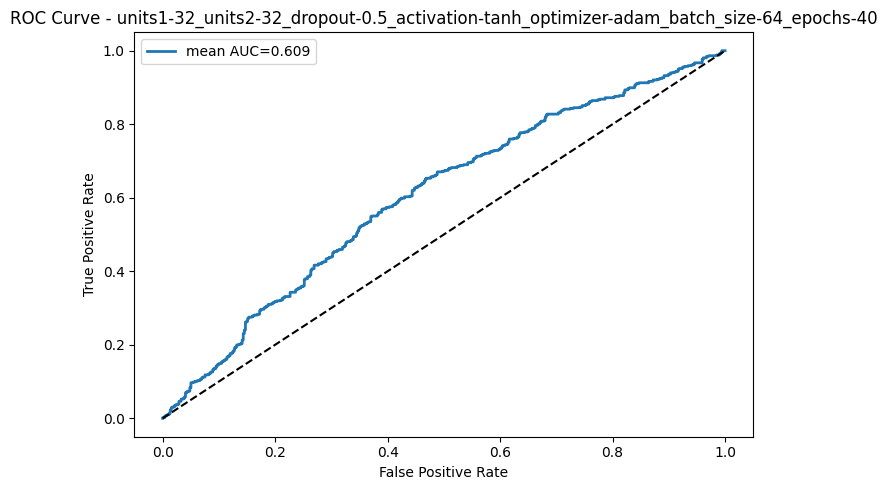

7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step 
Modelo hiperparams: units1-32_units2-32_dropout-0.5_activation-tanh_optimizer-rmsprop_batch_size-16_epochs-40
AUC promedio en CV: 0.613


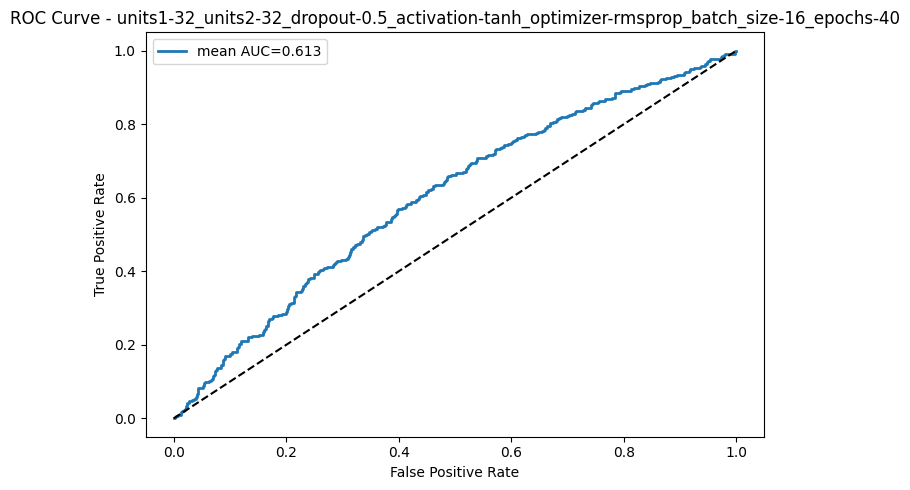

7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 
Modelo hiperparams: units1-32_units2-32_dropout-0.5_activation-tanh_optimizer-rmsprop_batch_size-32_epochs-40
AUC promedio en CV: 0.605


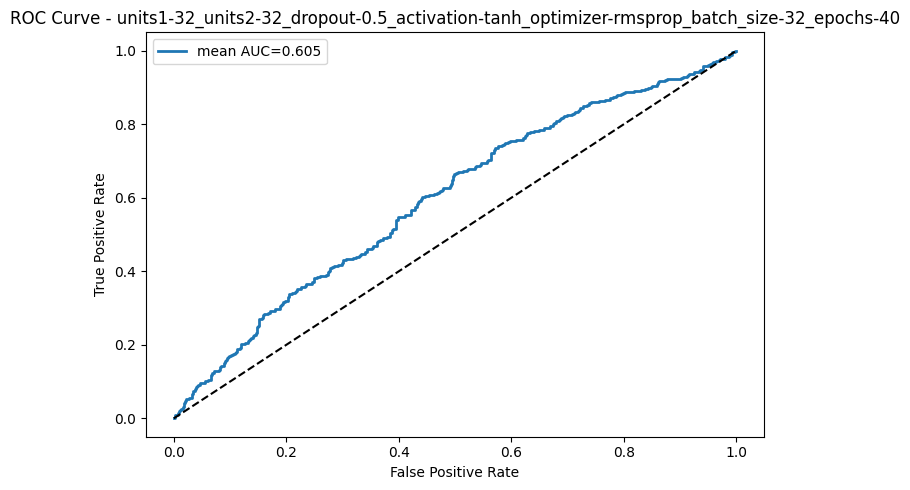

7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step 
Modelo hiperparams: units1-32_units2-32_dropout-0.5_activation-tanh_optimizer-rmsprop_batch_size-64_epochs-40
AUC promedio en CV: 0.604


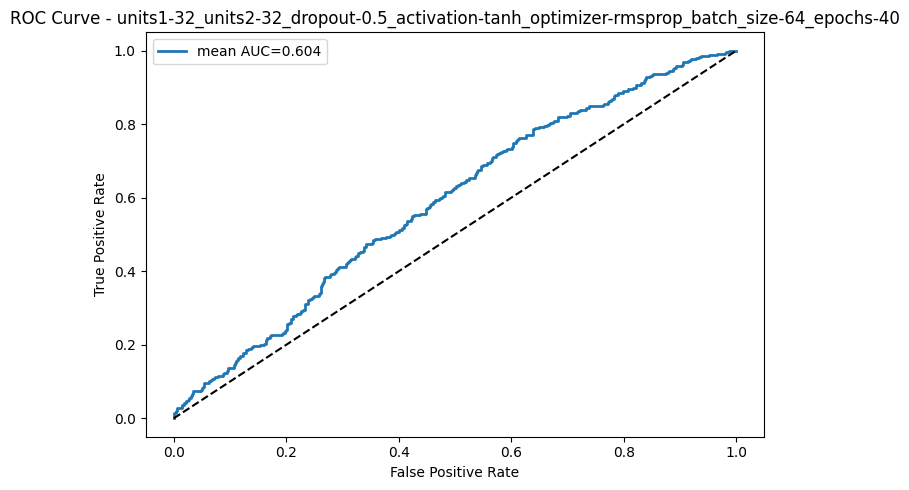

7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 
Modelo hiperparams: units1-32_units2-32_dropout-0.5_activation-elu_optimizer-adam_batch_size-16_epochs-40
AUC promedio en CV: 0.617


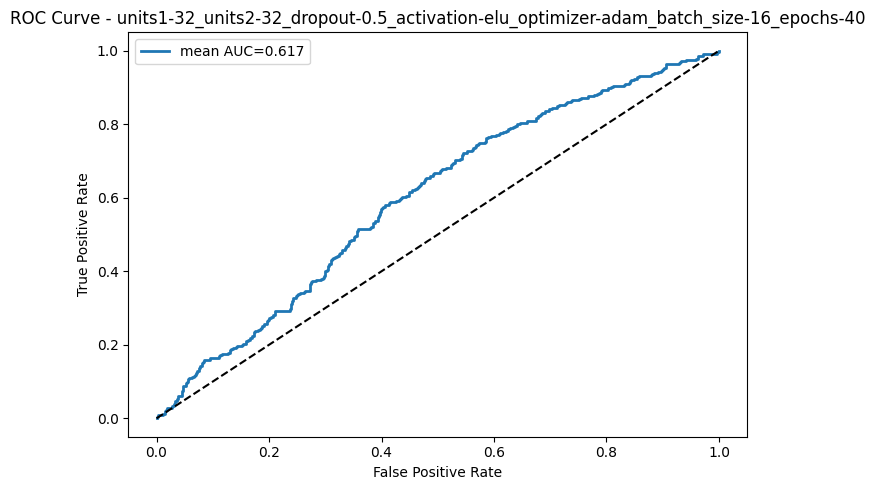

7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step 
Modelo hiperparams: units1-32_units2-32_dropout-0.5_activation-elu_optimizer-adam_batch_size-32_epochs-40
AUC promedio en CV: 0.598


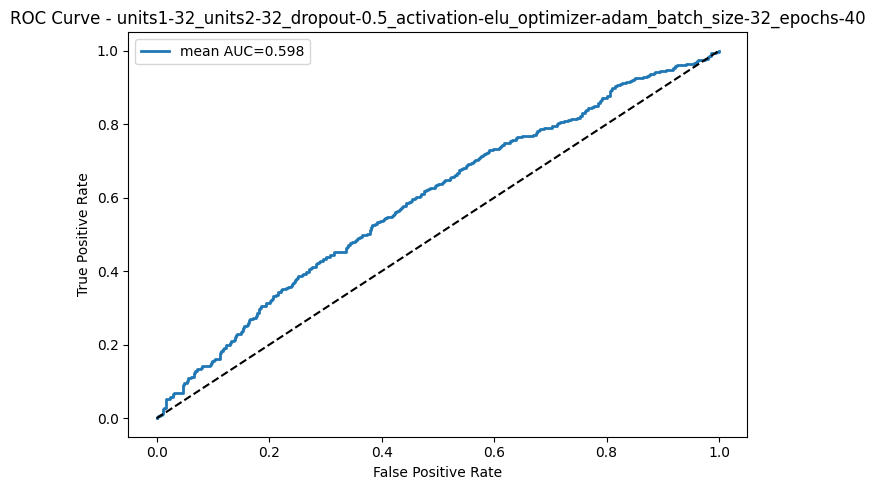

7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step 
Modelo hiperparams: units1-32_units2-32_dropout-0.5_activation-elu_optimizer-adam_batch_size-64_epochs-40
AUC promedio en CV: 0.606


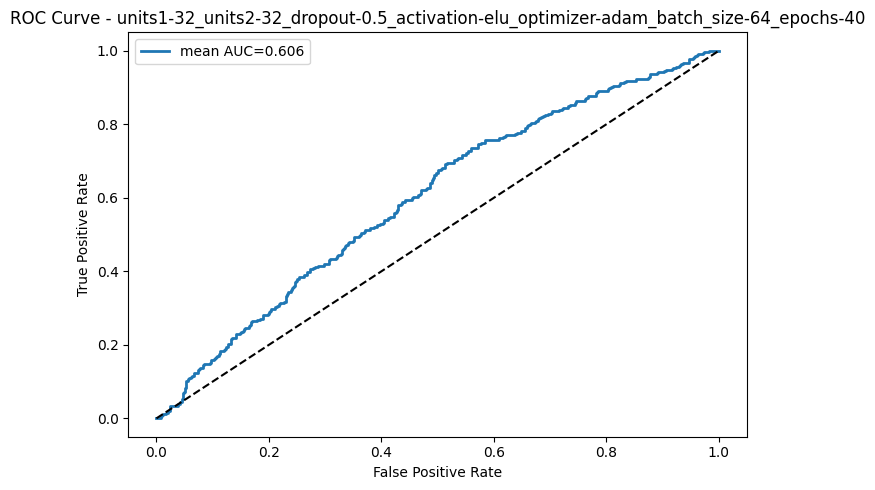

7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step 
Modelo hiperparams: units1-32_units2-32_dropout-0.5_activation-elu_optimizer-rmsprop_batch_size-16_epochs-40
AUC promedio en CV: 0.615


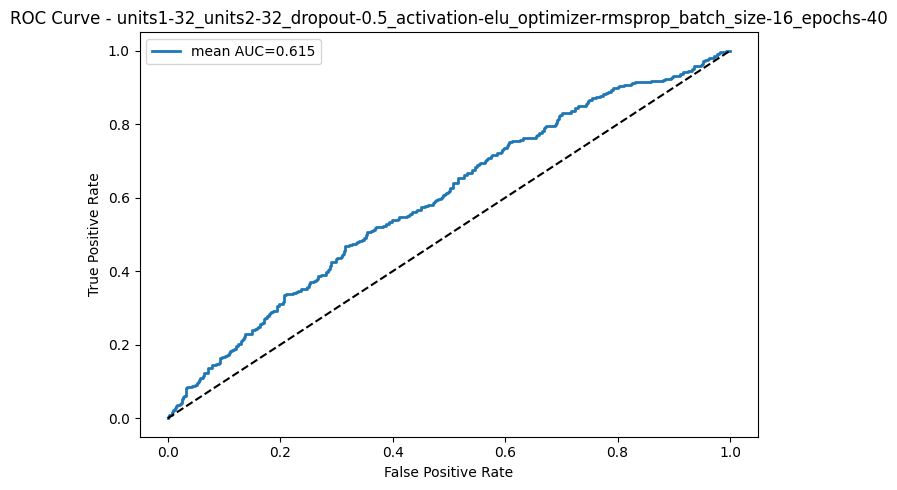

7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step 
Modelo hiperparams: units1-32_units2-32_dropout-0.5_activation-elu_optimizer-rmsprop_batch_size-32_epochs-40
AUC promedio en CV: 0.610


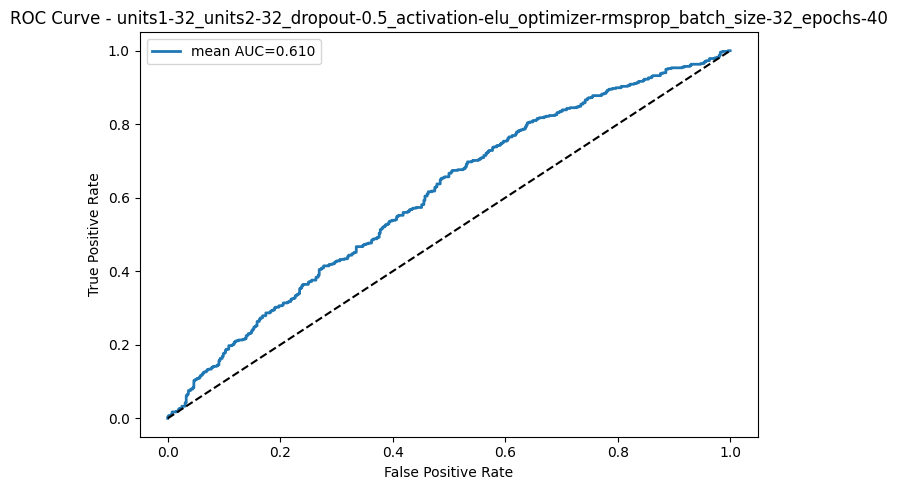

7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 
Modelo hiperparams: units1-32_units2-32_dropout-0.5_activation-elu_optimizer-rmsprop_batch_size-64_epochs-40
AUC promedio en CV: 0.614


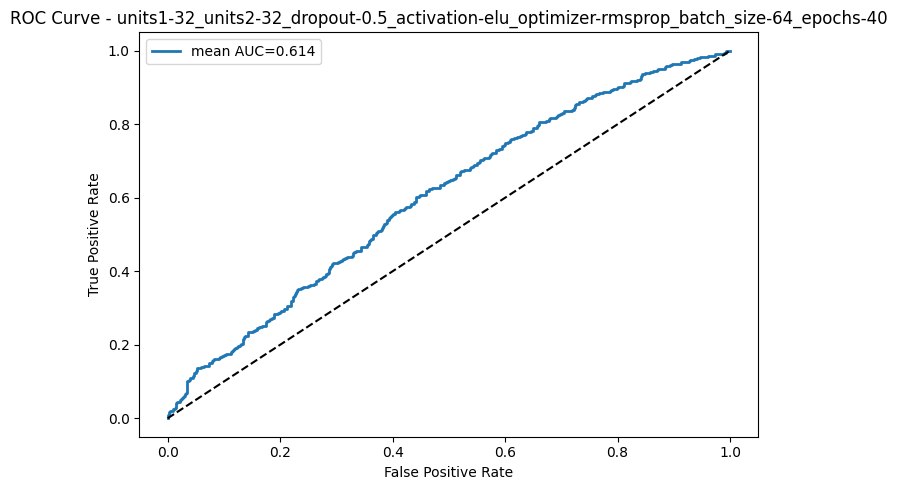

7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step 
Modelo hiperparams: units1-32_units2-64_dropout-0.2_activation-relu_optimizer-adam_batch_size-16_epochs-40
AUC promedio en CV: 0.609


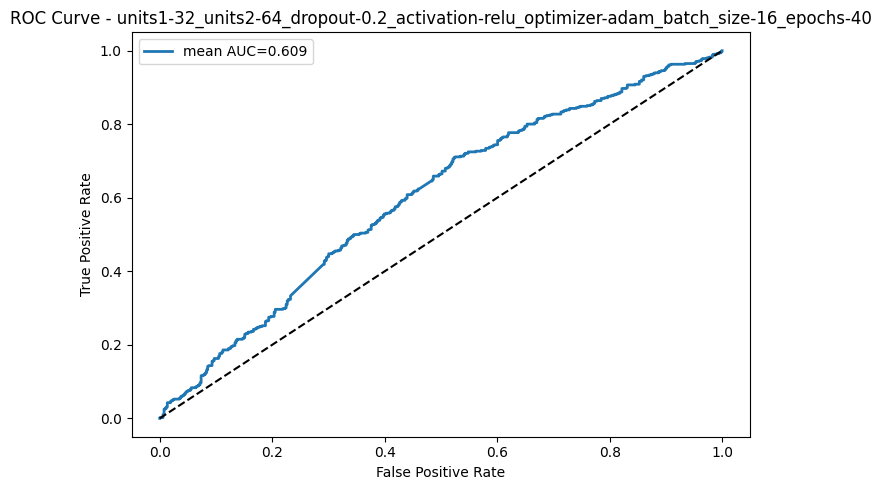

7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step 
Modelo hiperparams: units1-32_units2-64_dropout-0.2_activation-relu_optimizer-adam_batch_size-32_epochs-40
AUC promedio en CV: 0.604


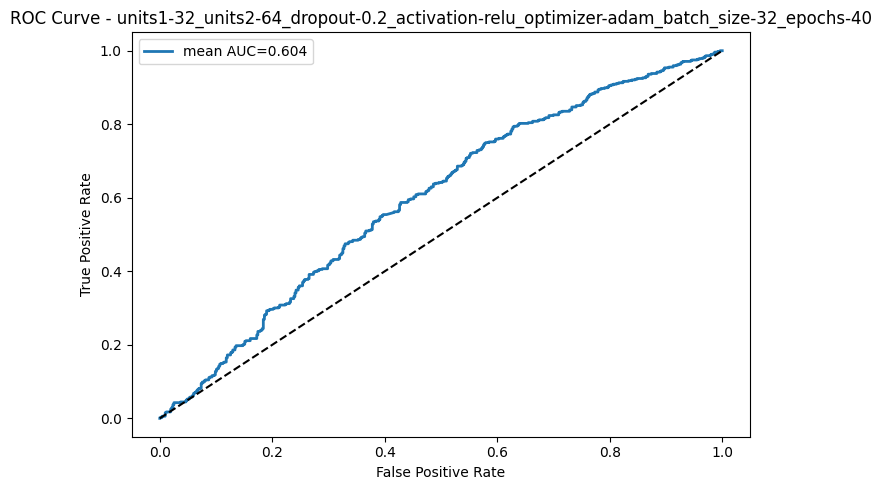

7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 
Modelo hiperparams: units1-32_units2-64_dropout-0.2_activation-relu_optimizer-adam_batch_size-64_epochs-40
AUC promedio en CV: 0.605


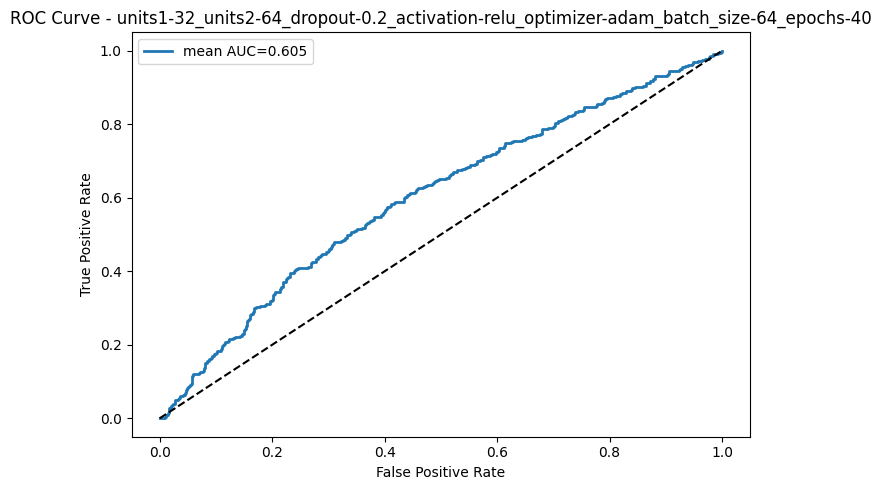

7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step 
Modelo hiperparams: units1-32_units2-64_dropout-0.2_activation-relu_optimizer-rmsprop_batch_size-16_epochs-40
AUC promedio en CV: 0.602


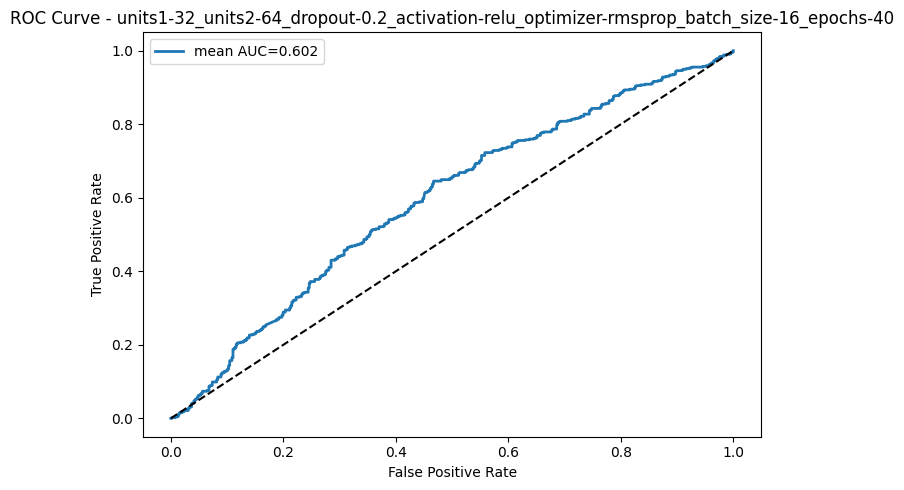

7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 
Modelo hiperparams: units1-32_units2-64_dropout-0.2_activation-relu_optimizer-rmsprop_batch_size-32_epochs-40
AUC promedio en CV: 0.609


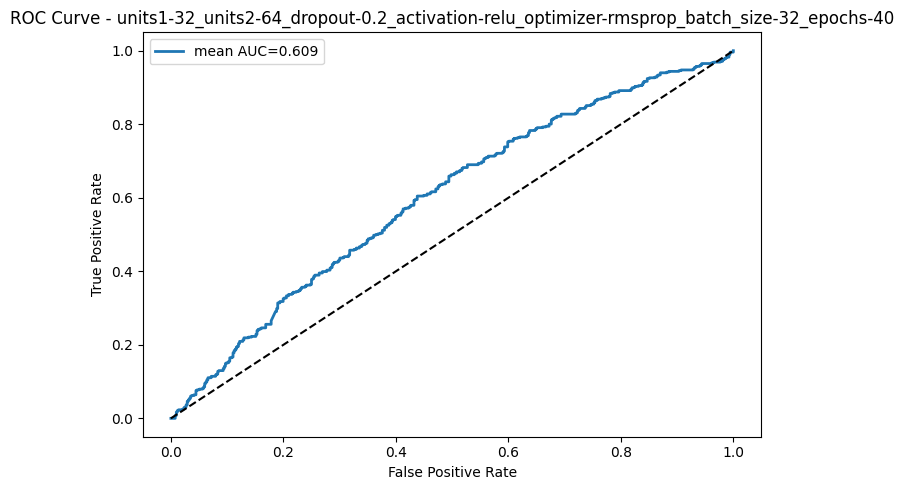

7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 2s 397ms/step
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step 
Modelo hiperparams: units1-32_units2-64_dropout-0.2_activation-relu_optimizer-rmsprop_batch_size-64_epochs-40
AUC promedio en CV: 0.594


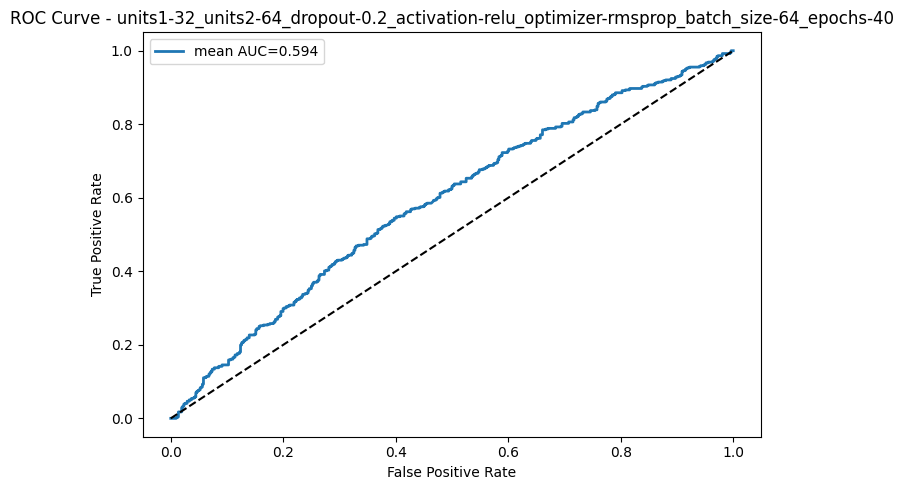

7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 
Modelo hiperparams: units1-32_units2-64_dropout-0.2_activation-tanh_optimizer-adam_batch_size-16_epochs-40
AUC promedio en CV: 0.629


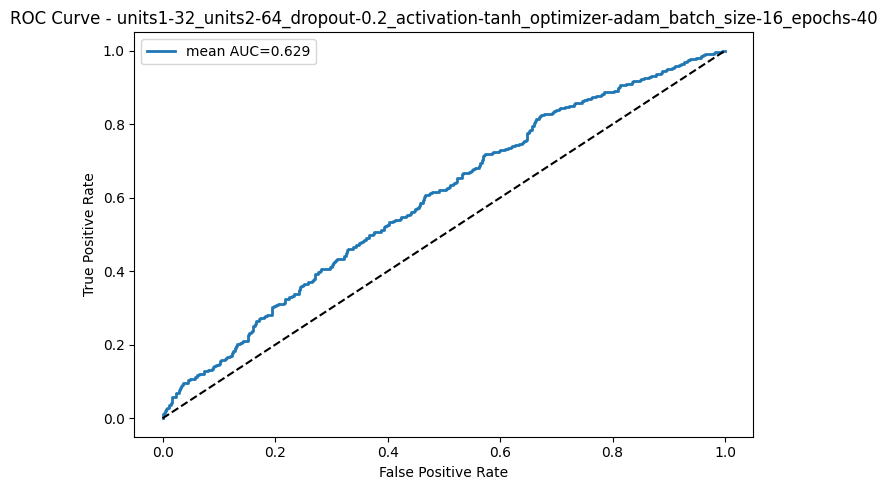

7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 
Modelo hiperparams: units1-32_units2-64_dropout-0.2_activation-tanh_optimizer-adam_batch_size-32_epochs-40
AUC promedio en CV: 0.617


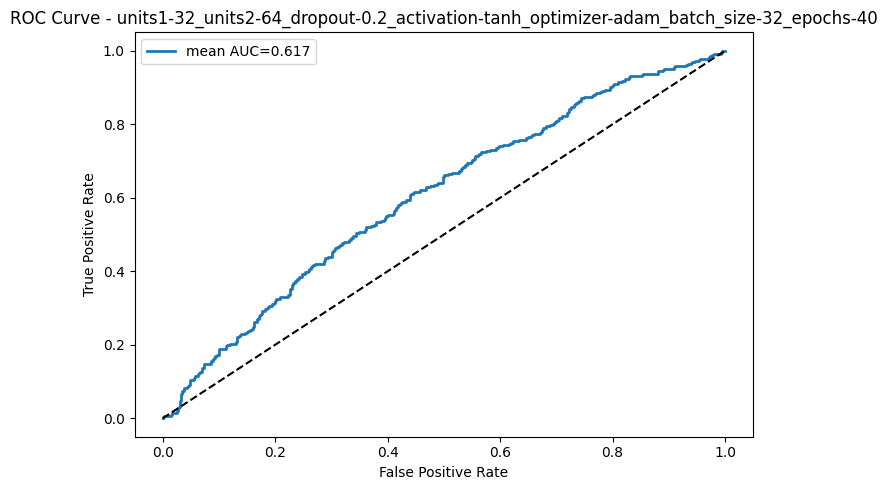

7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 
Modelo hiperparams: units1-32_units2-64_dropout-0.2_activation-tanh_optimizer-adam_batch_size-64_epochs-40
AUC promedio en CV: 0.624


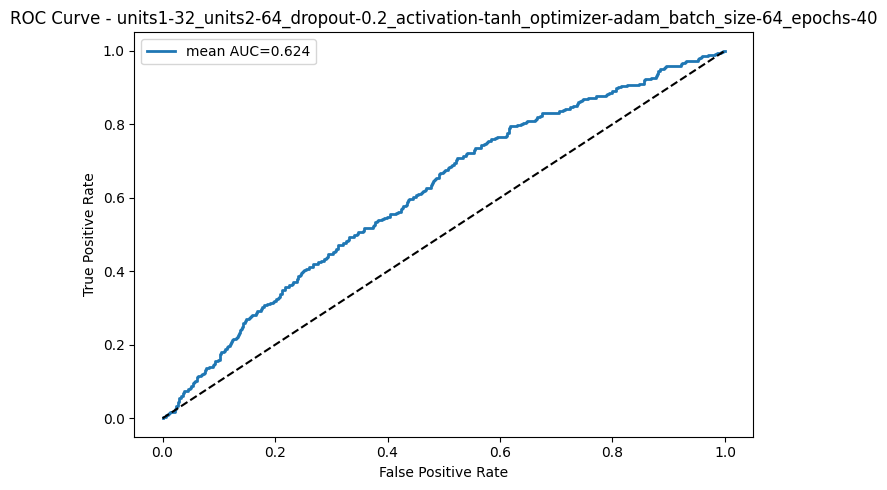

7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
Modelo hiperparams: units1-32_units2-64_dropout-0.2_activation-tanh_optimizer-rmsprop_batch_size-16_epochs-40
AUC promedio en CV: 0.633


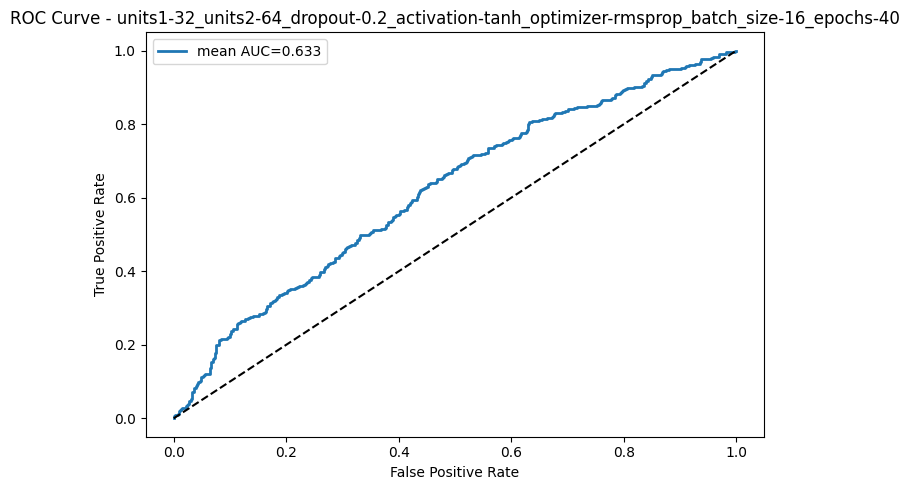

7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step 
Modelo hiperparams: units1-32_units2-64_dropout-0.2_activation-tanh_optimizer-rmsprop_batch_size-32_epochs-40
AUC promedio en CV: 0.623


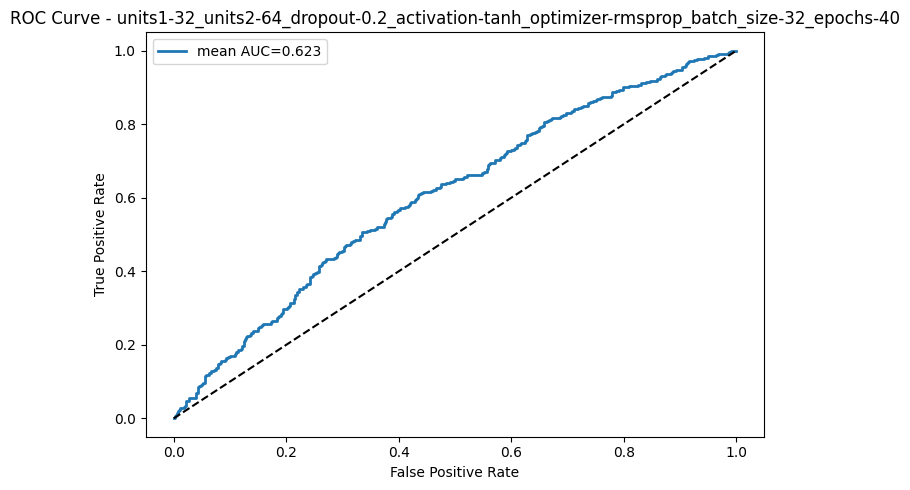

7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step 
Modelo hiperparams: units1-32_units2-64_dropout-0.2_activation-tanh_optimizer-rmsprop_batch_size-64_epochs-40
AUC promedio en CV: 0.607


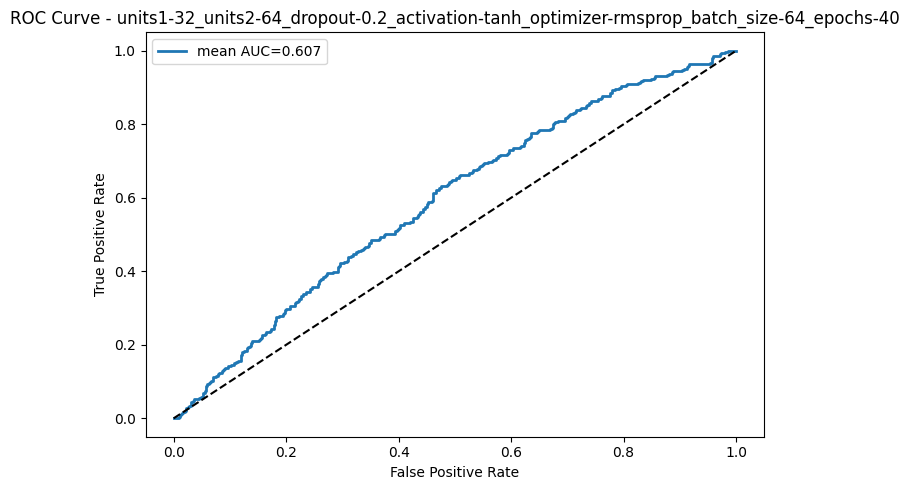

7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 
Modelo hiperparams: units1-32_units2-64_dropout-0.2_activation-elu_optimizer-adam_batch_size-16_epochs-40
AUC promedio en CV: 0.622


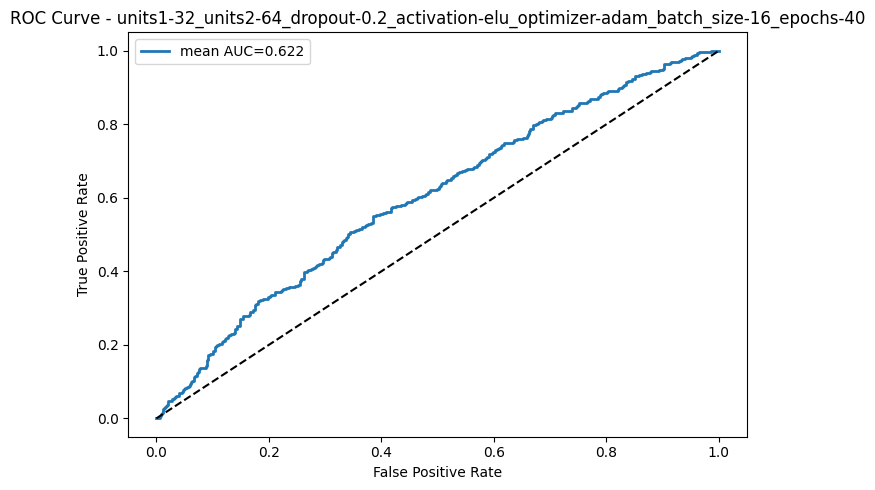

7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 
Modelo hiperparams: units1-32_units2-64_dropout-0.2_activation-elu_optimizer-adam_batch_size-32_epochs-40
AUC promedio en CV: 0.628


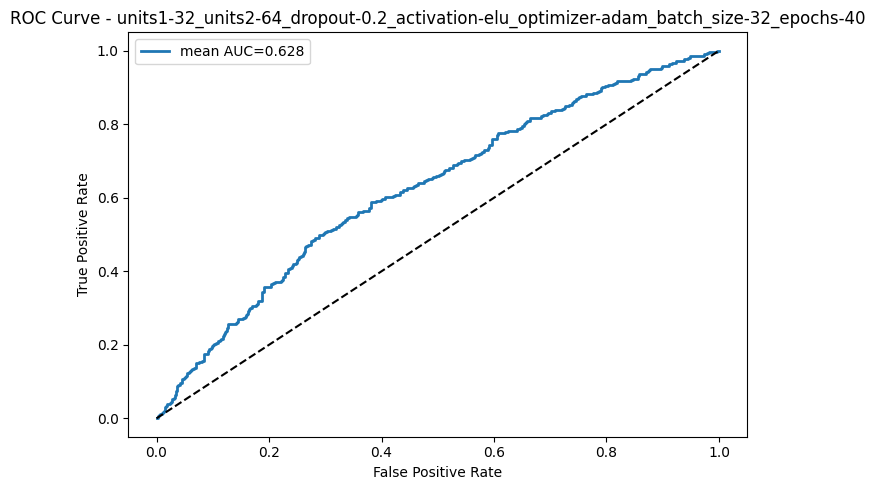

7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step 
Modelo hiperparams: units1-32_units2-64_dropout-0.2_activation-elu_optimizer-adam_batch_size-64_epochs-40
AUC promedio en CV: 0.619


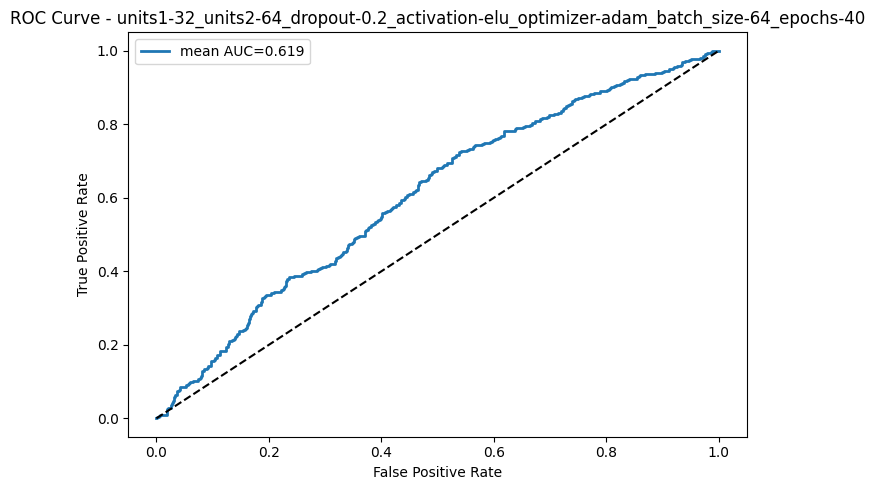

7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step 
Modelo hiperparams: units1-32_units2-64_dropout-0.2_activation-elu_optimizer-rmsprop_batch_size-16_epochs-40
AUC promedio en CV: 0.621


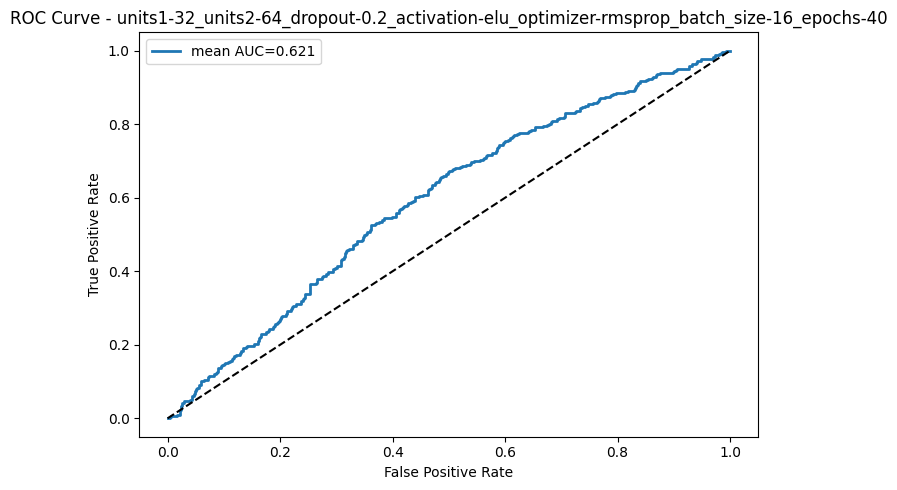

7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step 
Modelo hiperparams: units1-32_units2-64_dropout-0.2_activation-elu_optimizer-rmsprop_batch_size-32_epochs-40
AUC promedio en CV: 0.619


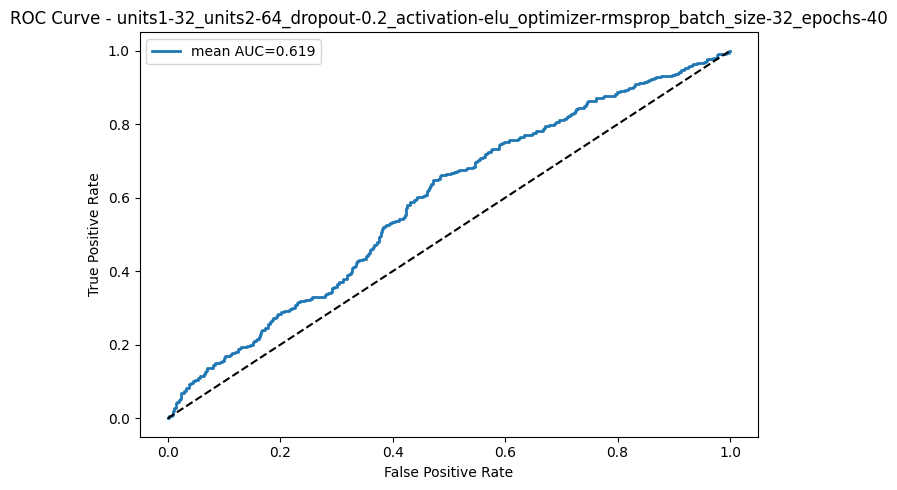

7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step 
Modelo hiperparams: units1-32_units2-64_dropout-0.2_activation-elu_optimizer-rmsprop_batch_size-64_epochs-40
AUC promedio en CV: 0.626


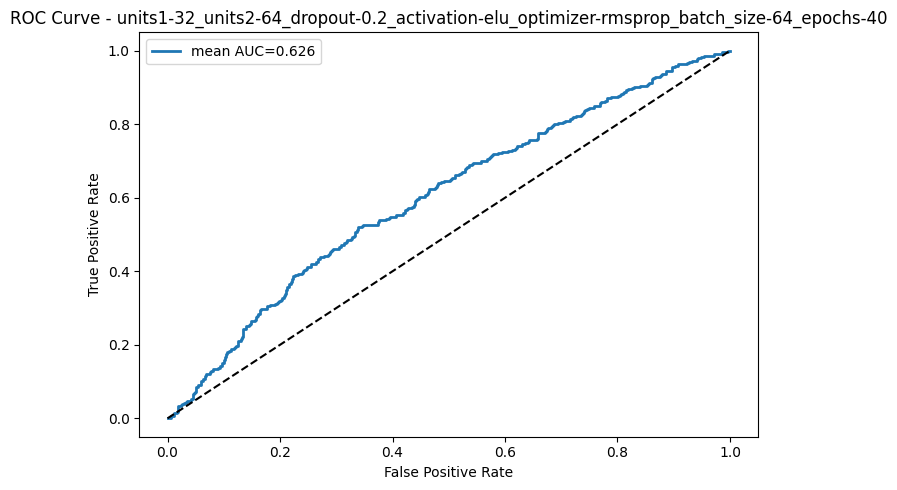

7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step 
Modelo hiperparams: units1-32_units2-64_dropout-0.5_activation-relu_optimizer-adam_batch_size-16_epochs-40
AUC promedio en CV: 0.537


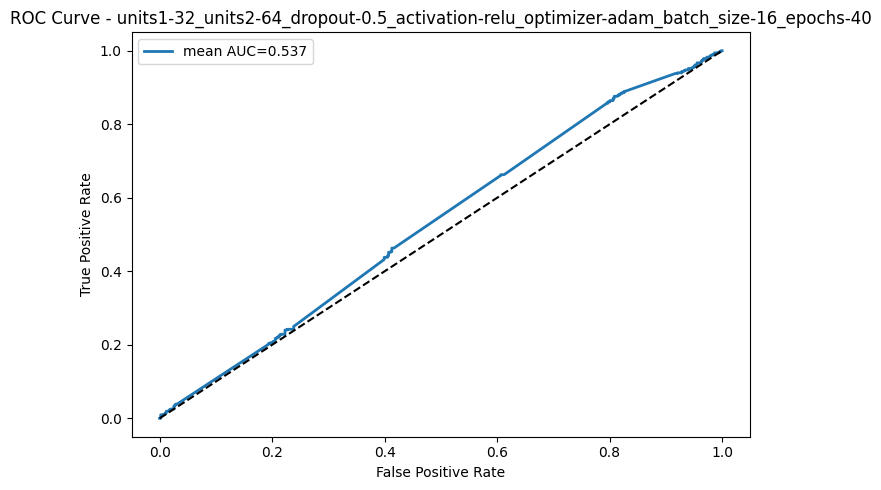

7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step 
Modelo hiperparams: units1-32_units2-64_dropout-0.5_activation-relu_optimizer-adam_batch_size-32_epochs-40
AUC promedio en CV: 0.547


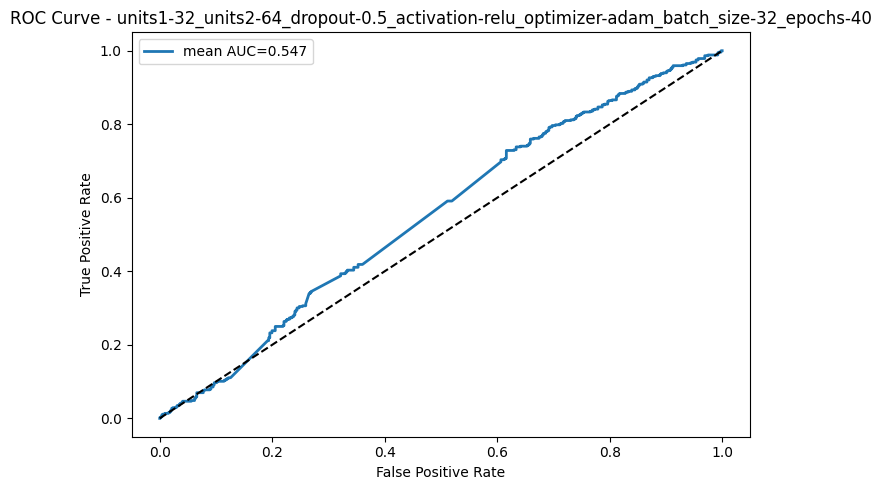

7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step 
Modelo hiperparams: units1-32_units2-64_dropout-0.5_activation-relu_optimizer-adam_batch_size-64_epochs-40
AUC promedio en CV: 0.585


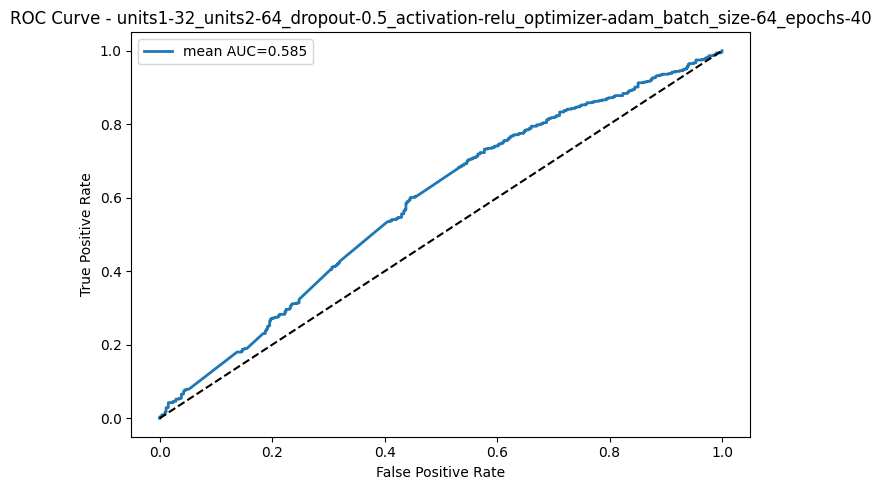

7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 
Modelo hiperparams: units1-32_units2-64_dropout-0.5_activation-relu_optimizer-rmsprop_batch_size-16_epochs-40
AUC promedio en CV: 0.565


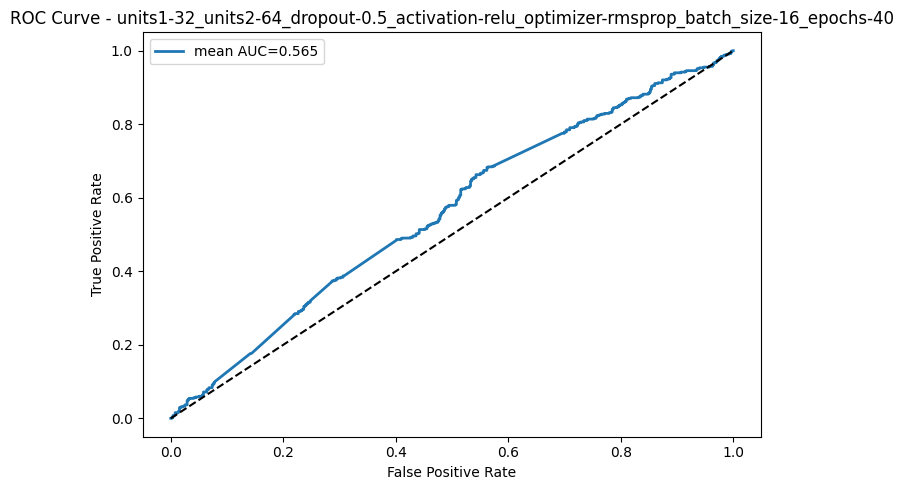

7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
Modelo hiperparams: units1-32_units2-64_dropout-0.5_activation-relu_optimizer-rmsprop_batch_size-32_epochs-40
AUC promedio en CV: 0.569


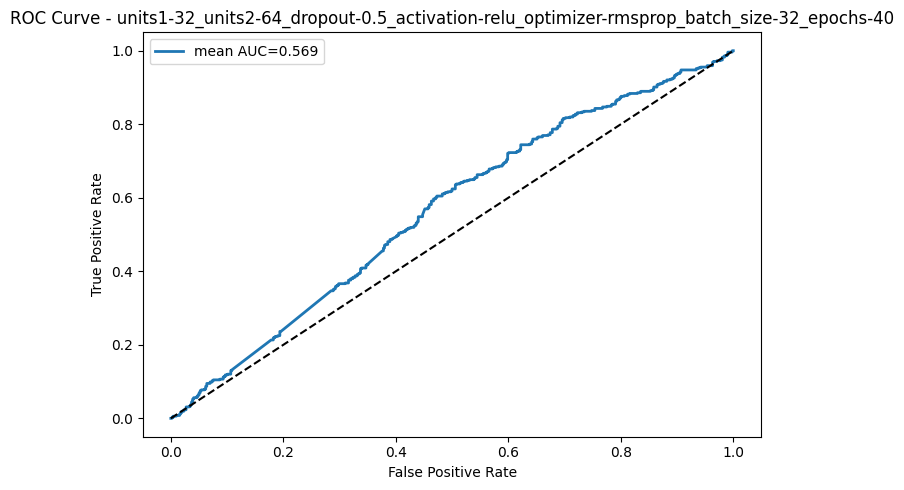

7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 
Modelo hiperparams: units1-32_units2-64_dropout-0.5_activation-relu_optimizer-rmsprop_batch_size-64_epochs-40
AUC promedio en CV: 0.564


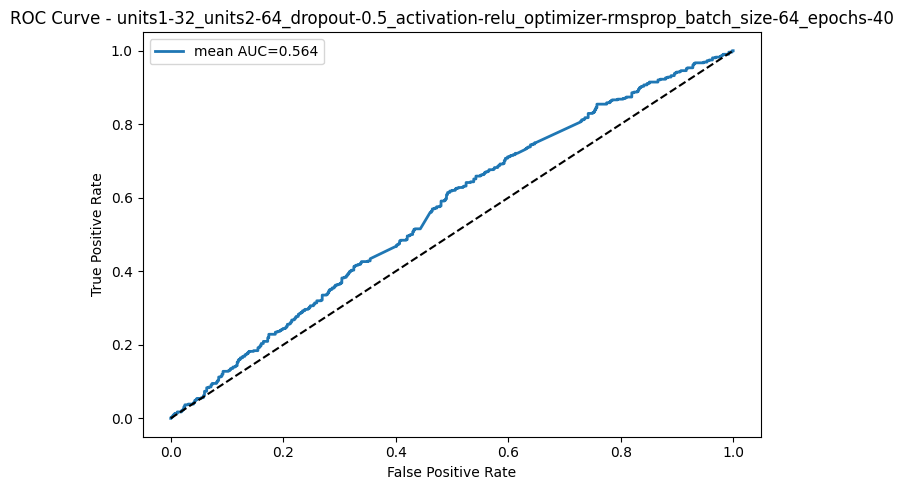

7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 
Modelo hiperparams: units1-32_units2-64_dropout-0.5_activation-tanh_optimizer-adam_batch_size-16_epochs-40
AUC promedio en CV: 0.604


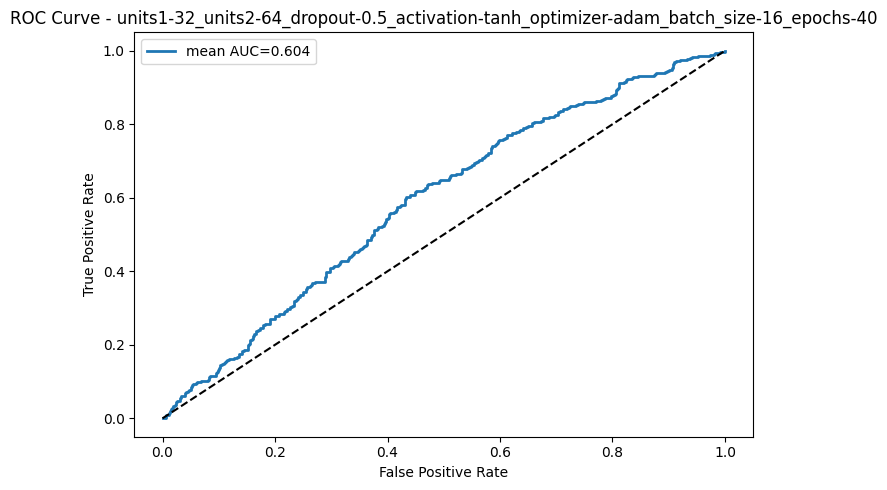

7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 
Modelo hiperparams: units1-32_units2-64_dropout-0.5_activation-tanh_optimizer-adam_batch_size-32_epochs-40
AUC promedio en CV: 0.602


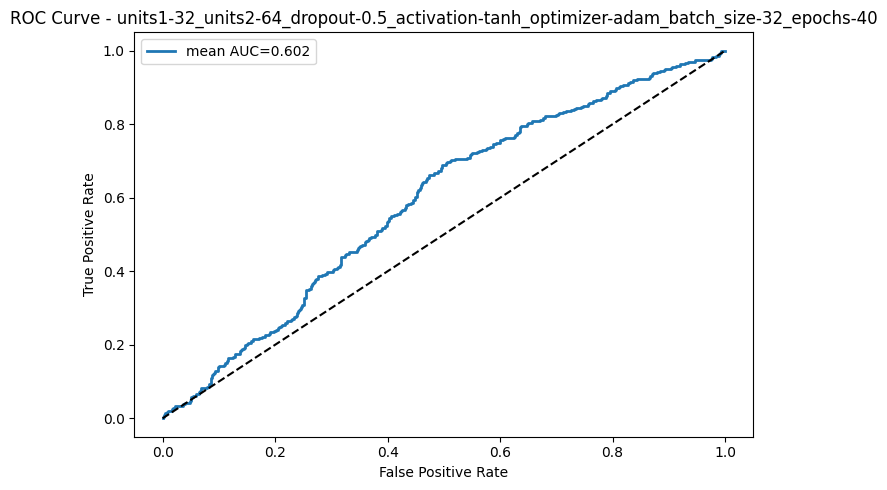

7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step 
Modelo hiperparams: units1-32_units2-64_dropout-0.5_activation-tanh_optimizer-adam_batch_size-64_epochs-40
AUC promedio en CV: 0.598


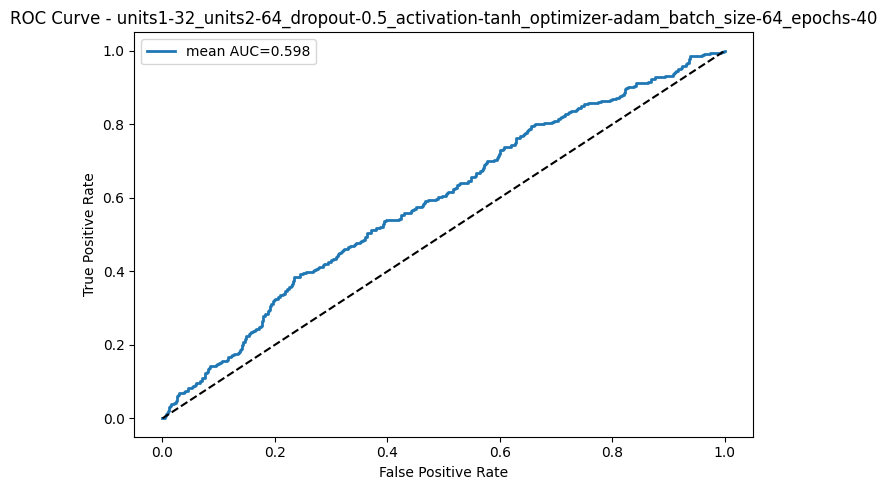

7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step 
Modelo hiperparams: units1-32_units2-64_dropout-0.5_activation-tanh_optimizer-rmsprop_batch_size-16_epochs-40
AUC promedio en CV: 0.614


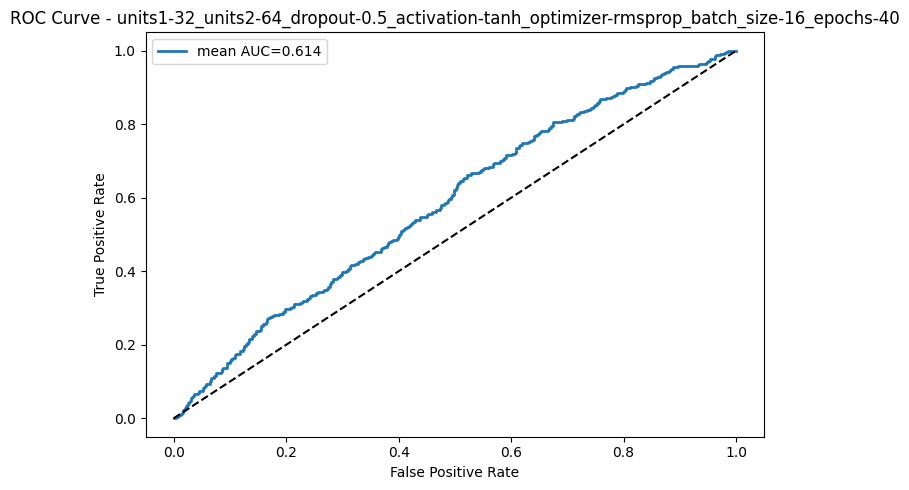

7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step 
Modelo hiperparams: units1-32_units2-64_dropout-0.5_activation-tanh_optimizer-rmsprop_batch_size-32_epochs-40
AUC promedio en CV: 0.612


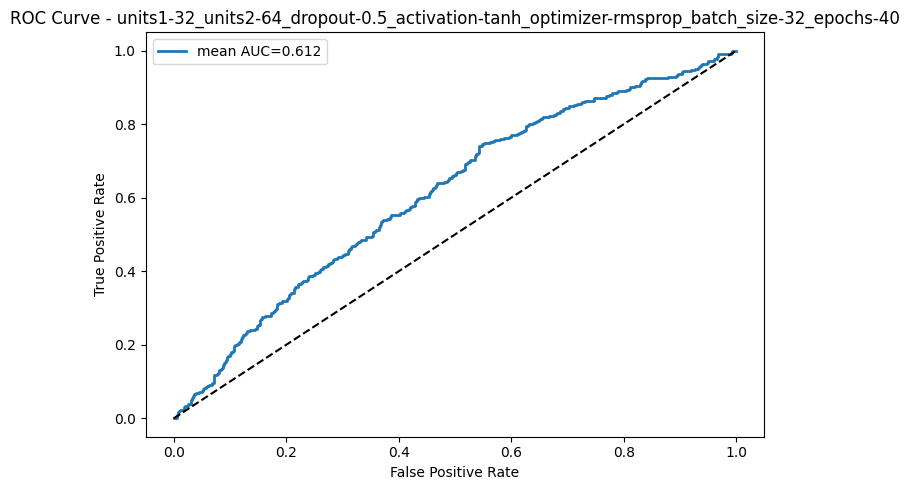

7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step 
Modelo hiperparams: units1-32_units2-64_dropout-0.5_activation-tanh_optimizer-rmsprop_batch_size-64_epochs-40
AUC promedio en CV: 0.597


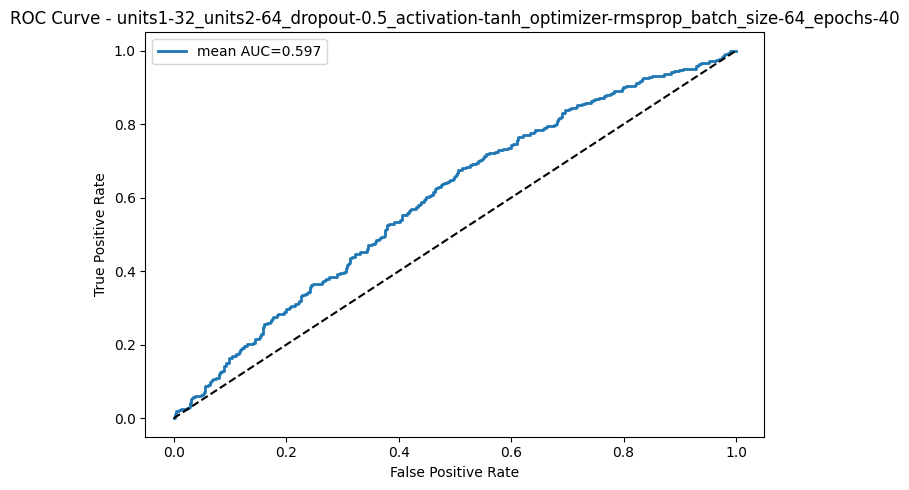

7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 
Modelo hiperparams: units1-32_units2-64_dropout-0.5_activation-elu_optimizer-adam_batch_size-16_epochs-40
AUC promedio en CV: 0.617


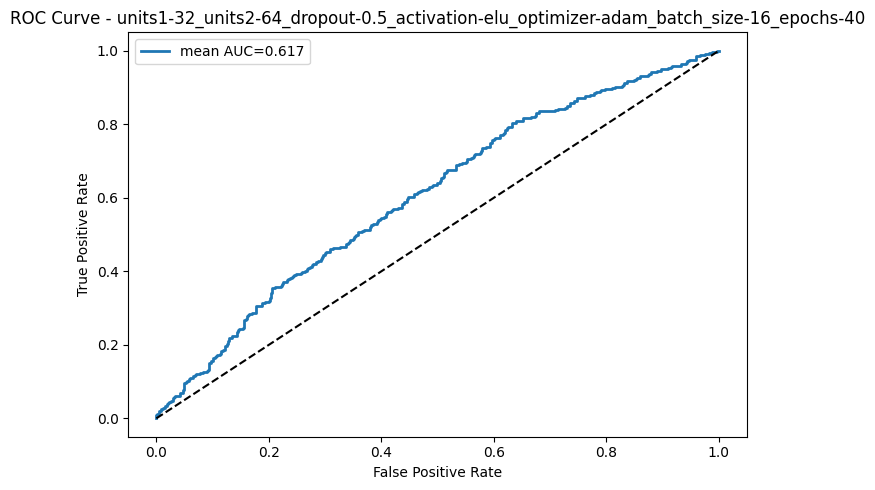

7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 
Modelo hiperparams: units1-32_units2-64_dropout-0.5_activation-elu_optimizer-adam_batch_size-32_epochs-40
AUC promedio en CV: 0.614


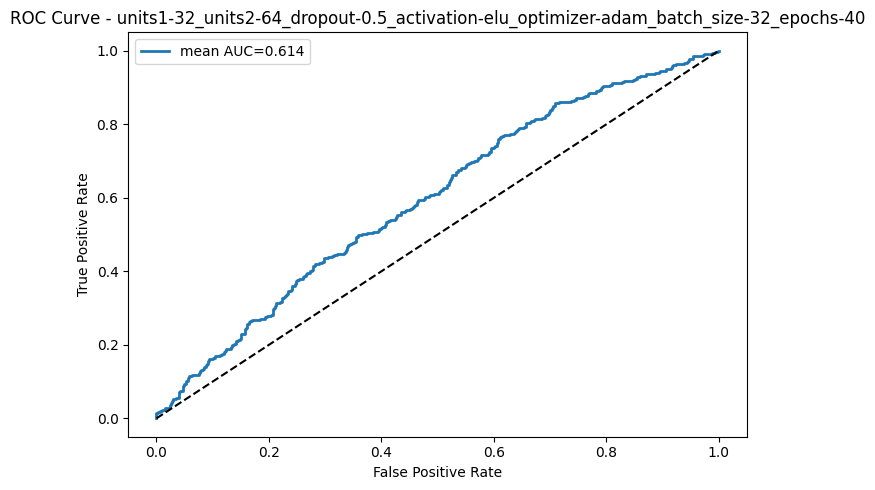

7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step 
Modelo hiperparams: units1-32_units2-64_dropout-0.5_activation-elu_optimizer-adam_batch_size-64_epochs-40
AUC promedio en CV: 0.609


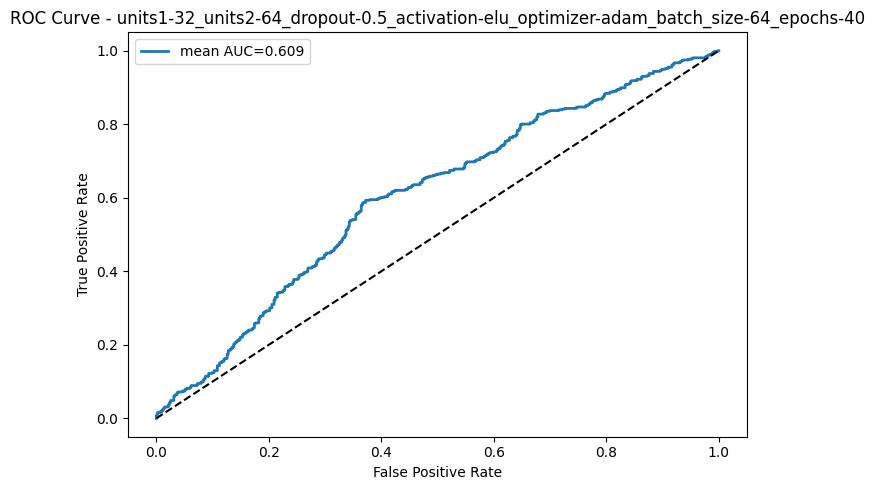

7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step 
Modelo hiperparams: units1-32_units2-64_dropout-0.5_activation-elu_optimizer-rmsprop_batch_size-16_epochs-40
AUC promedio en CV: 0.619


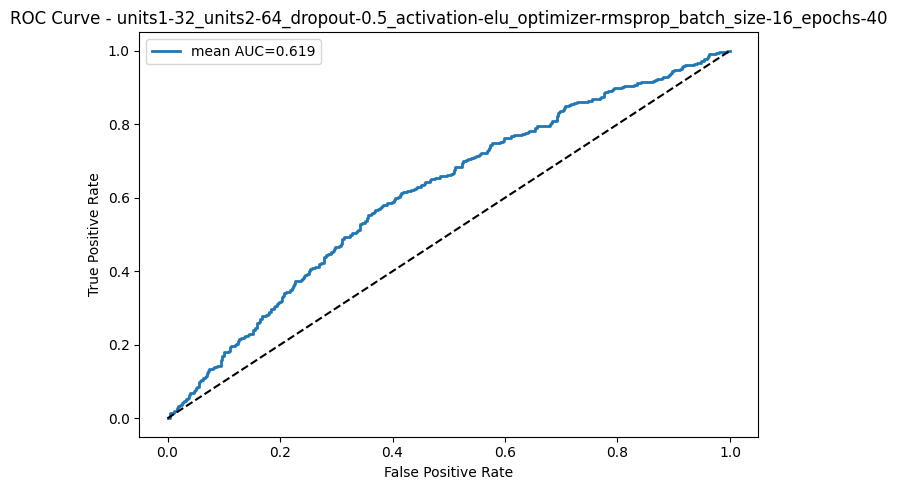

7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step 
Modelo hiperparams: units1-32_units2-64_dropout-0.5_activation-elu_optimizer-rmsprop_batch_size-32_epochs-40
AUC promedio en CV: 0.620


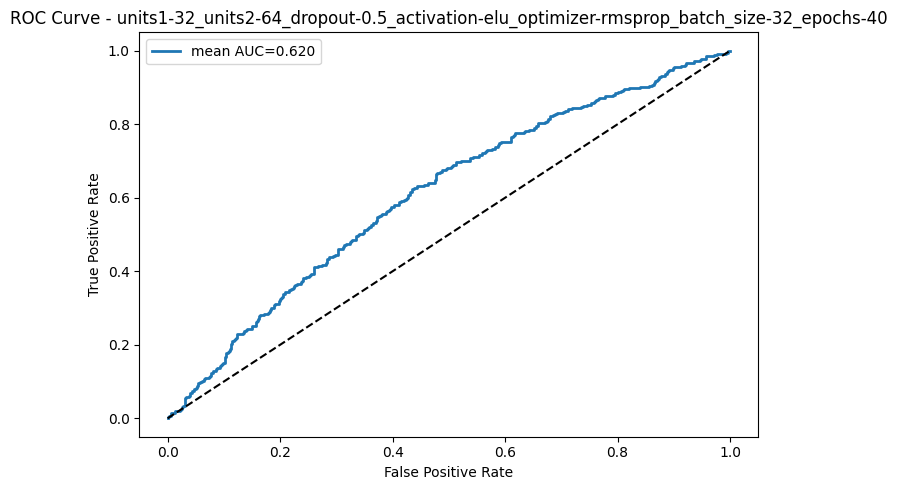

7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 
Modelo hiperparams: units1-32_units2-64_dropout-0.5_activation-elu_optimizer-rmsprop_batch_size-64_epochs-40
AUC promedio en CV: 0.626


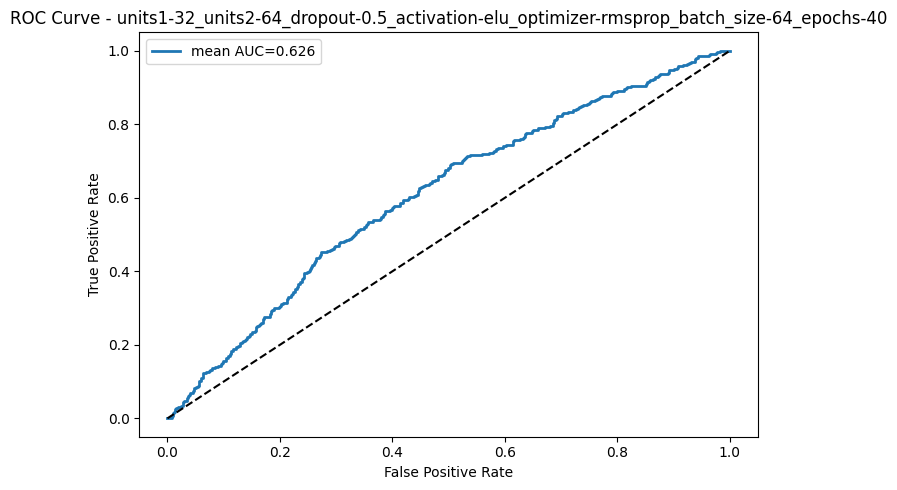

7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 
Modelo hiperparams: units1-64_units2-16_dropout-0.2_activation-relu_optimizer-adam_batch_size-16_epochs-40
AUC promedio en CV: 0.614


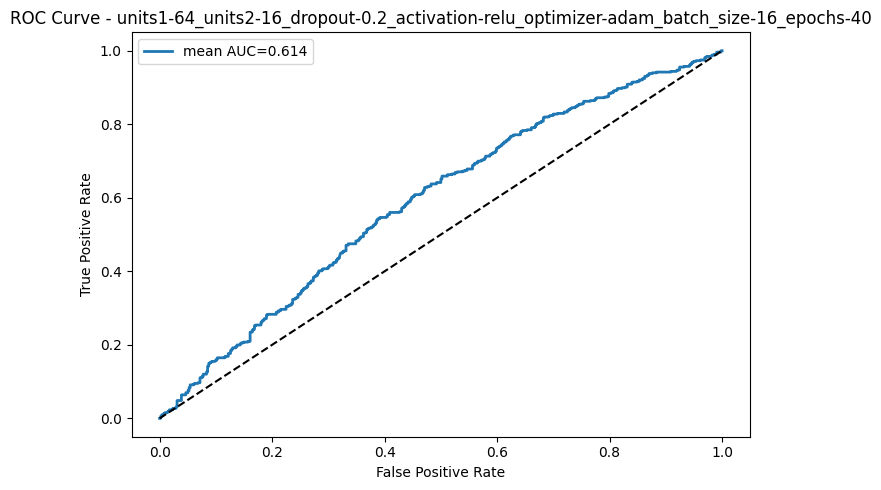

7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 
Modelo hiperparams: units1-64_units2-16_dropout-0.2_activation-relu_optimizer-adam_batch_size-32_epochs-40
AUC promedio en CV: 0.599


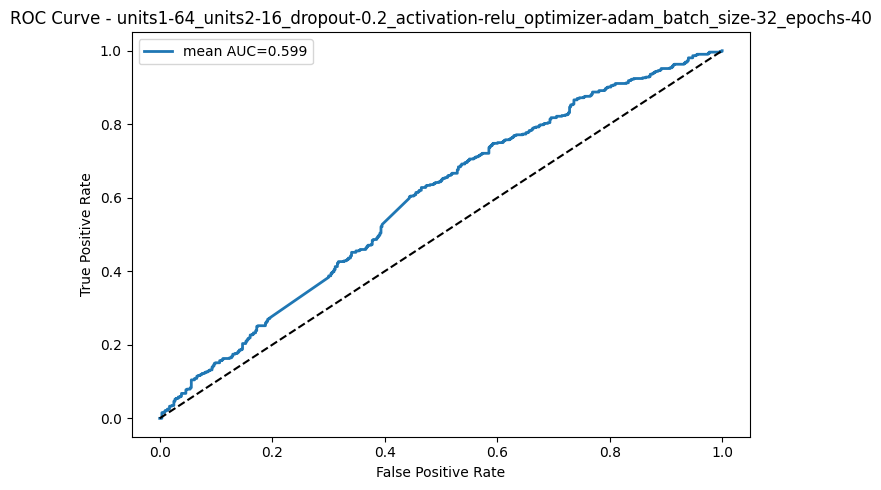

7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 
Modelo hiperparams: units1-64_units2-16_dropout-0.2_activation-relu_optimizer-adam_batch_size-64_epochs-40
AUC promedio en CV: 0.575


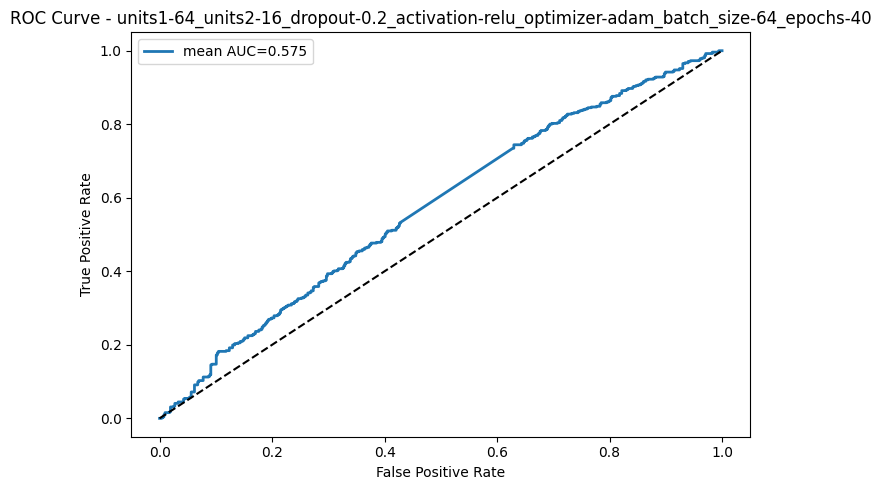

7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 
Modelo hiperparams: units1-64_units2-16_dropout-0.2_activation-relu_optimizer-rmsprop_batch_size-16_epochs-40
AUC promedio en CV: 0.581


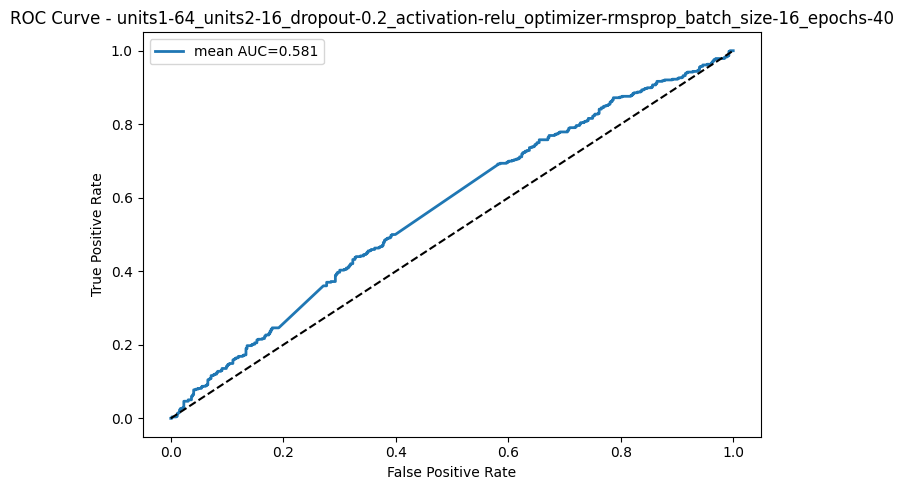

7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step 
Modelo hiperparams: units1-64_units2-16_dropout-0.2_activation-relu_optimizer-rmsprop_batch_size-32_epochs-40
AUC promedio en CV: 0.614


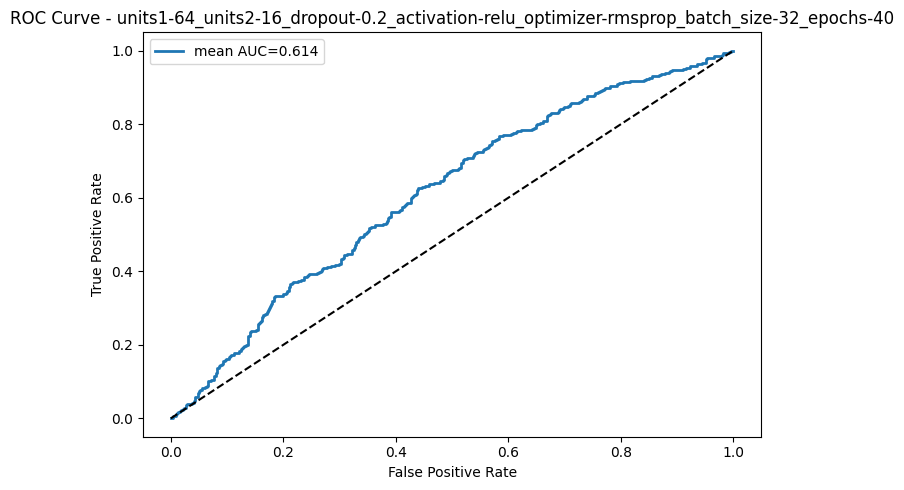

7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step
Modelo hiperparams: units1-64_units2-16_dropout-0.2_activation-relu_optimizer-rmsprop_batch_size-64_epochs-40
AUC promedio en CV: 0.601


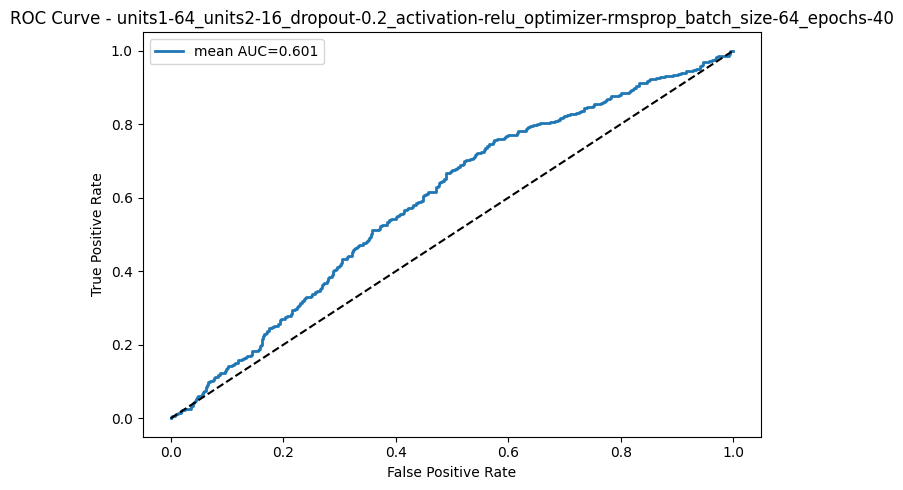

7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step 
Modelo hiperparams: units1-64_units2-16_dropout-0.2_activation-tanh_optimizer-adam_batch_size-16_epochs-40
AUC promedio en CV: 0.632


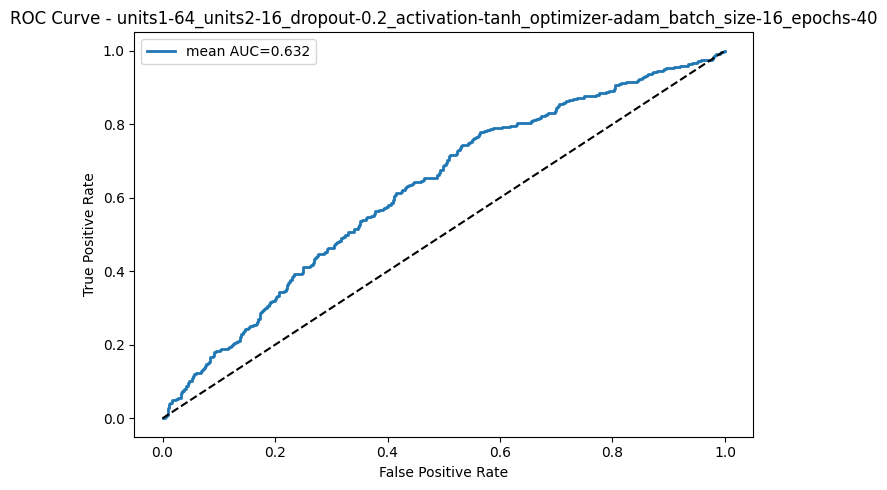

7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step
Modelo hiperparams: units1-64_units2-16_dropout-0.2_activation-tanh_optimizer-adam_batch_size-32_epochs-40
AUC promedio en CV: 0.633


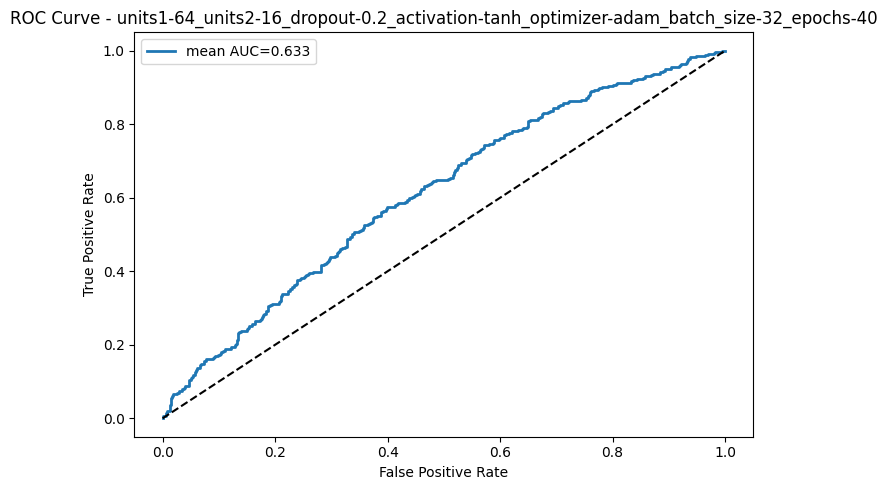

7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step 
Modelo hiperparams: units1-64_units2-16_dropout-0.2_activation-tanh_optimizer-adam_batch_size-64_epochs-40
AUC promedio en CV: 0.642


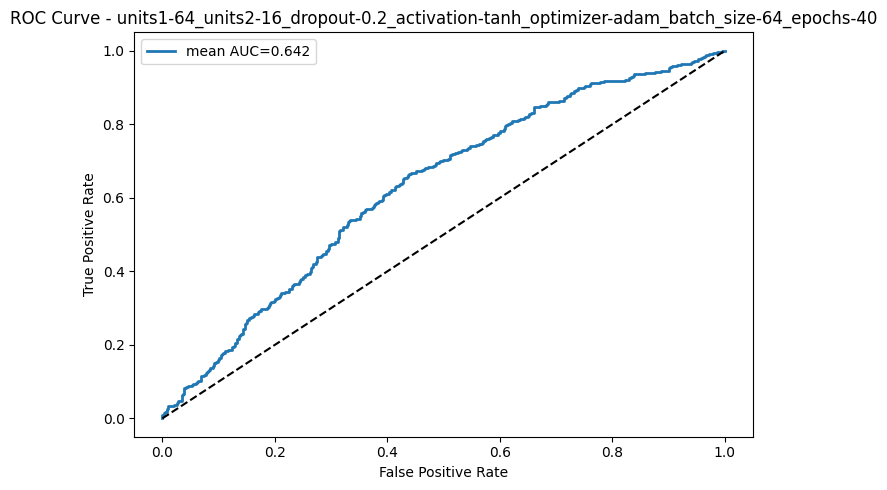

7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 
Modelo hiperparams: units1-64_units2-16_dropout-0.2_activation-tanh_optimizer-rmsprop_batch_size-16_epochs-40
AUC promedio en CV: 0.630


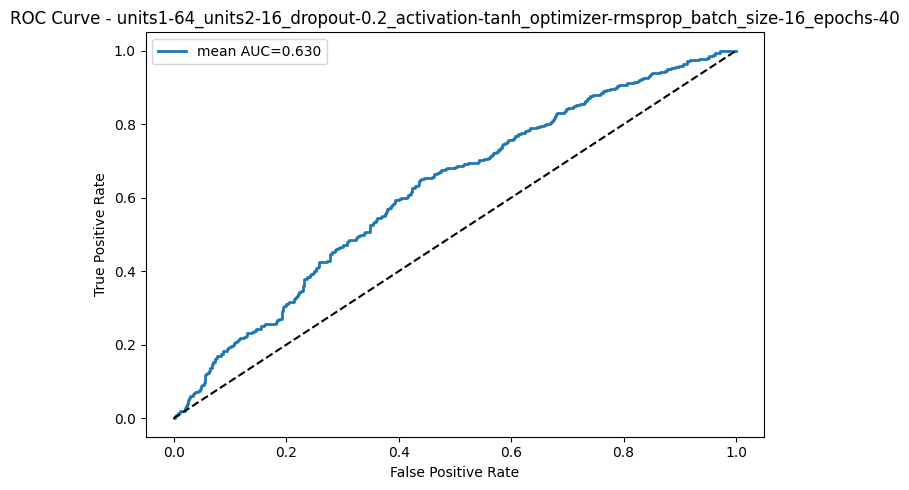

7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step
Modelo hiperparams: units1-64_units2-16_dropout-0.2_activation-tanh_optimizer-rmsprop_batch_size-32_epochs-40
AUC promedio en CV: 0.628


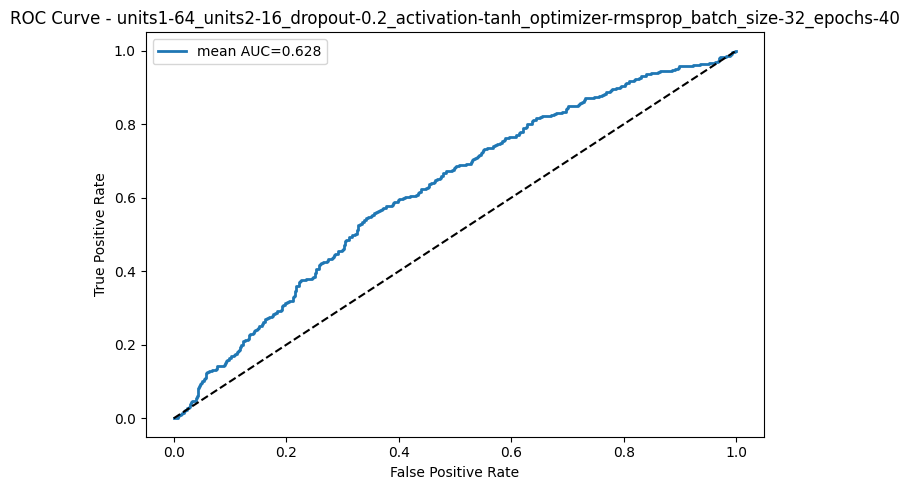

7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
Modelo hiperparams: units1-64_units2-16_dropout-0.2_activation-tanh_optimizer-rmsprop_batch_size-64_epochs-40
AUC promedio en CV: 0.624


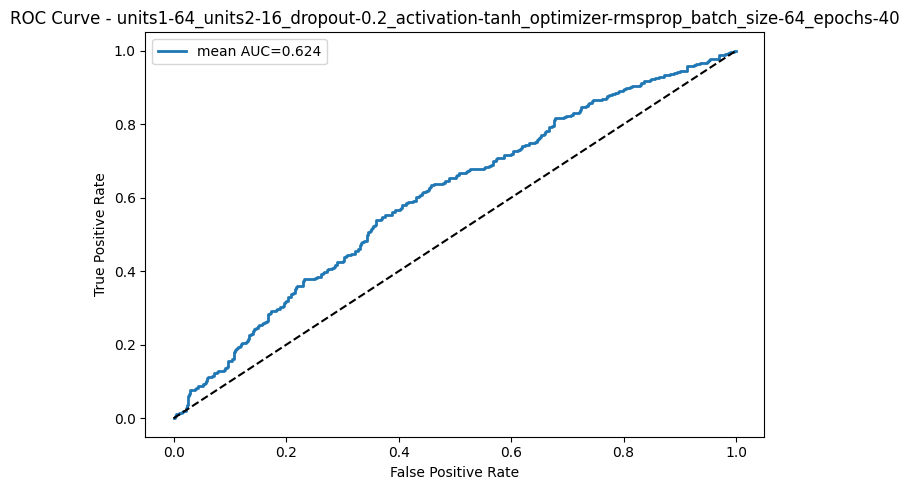

7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step 
Modelo hiperparams: units1-64_units2-16_dropout-0.2_activation-elu_optimizer-adam_batch_size-16_epochs-40
AUC promedio en CV: 0.634


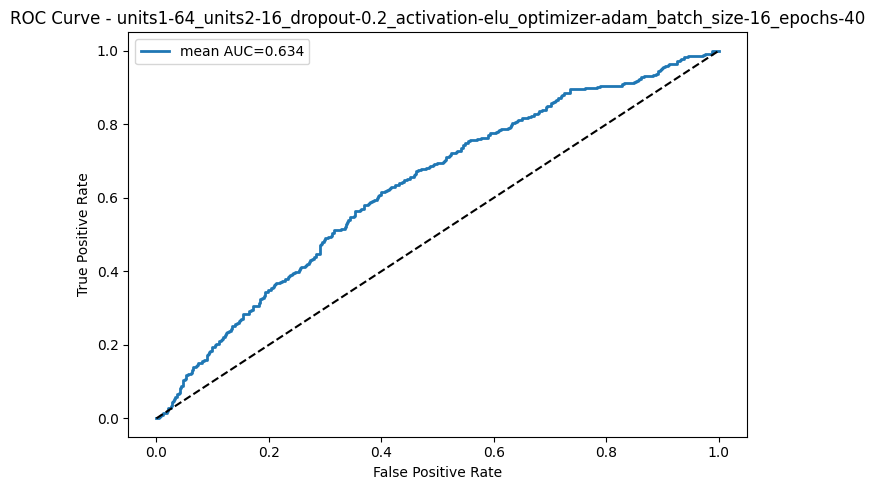

7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step 
Modelo hiperparams: units1-64_units2-16_dropout-0.2_activation-elu_optimizer-adam_batch_size-32_epochs-40
AUC promedio en CV: 0.621


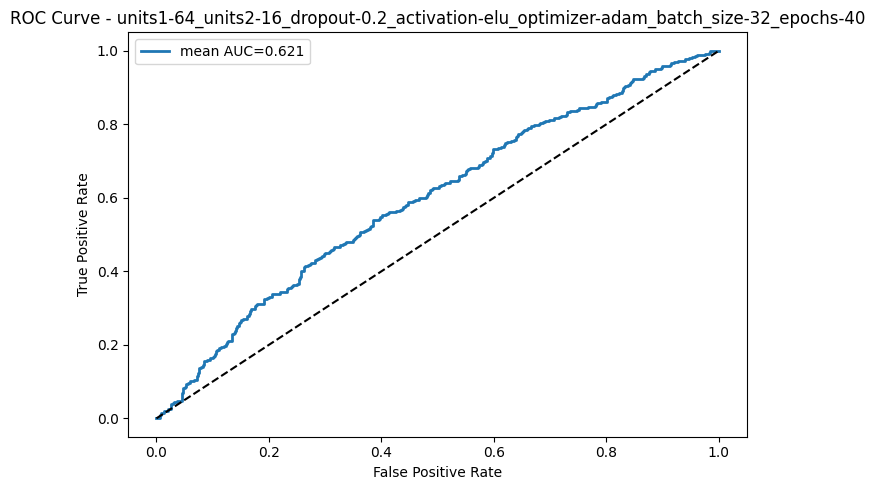

7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step 
Modelo hiperparams: units1-64_units2-16_dropout-0.2_activation-elu_optimizer-adam_batch_size-64_epochs-40
AUC promedio en CV: 0.610


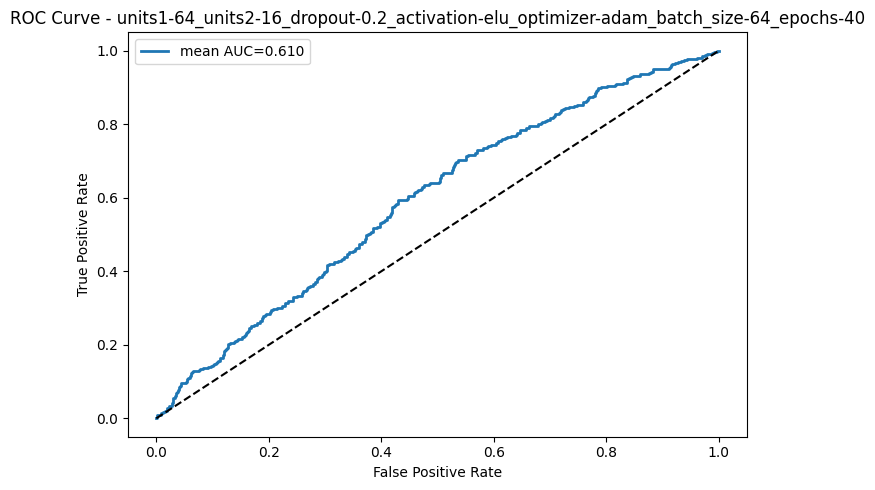

7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 
Modelo hiperparams: units1-64_units2-16_dropout-0.2_activation-elu_optimizer-rmsprop_batch_size-16_epochs-40
AUC promedio en CV: 0.617


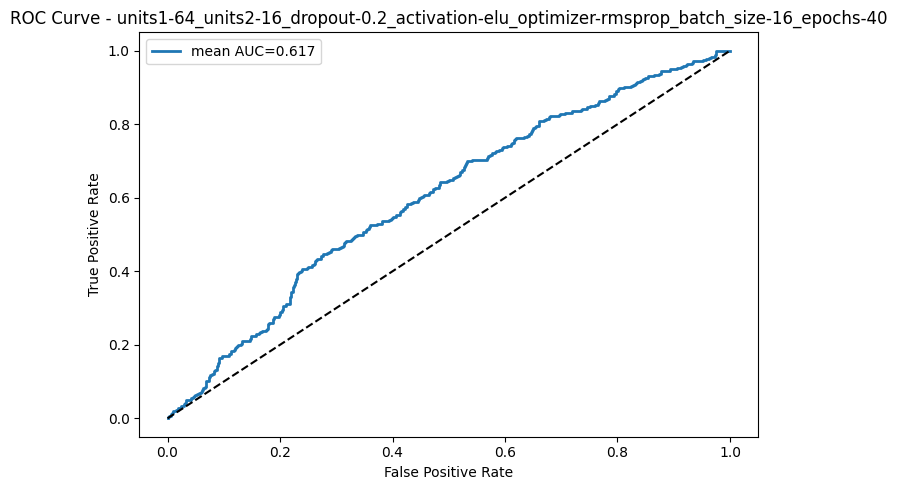

7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
Modelo hiperparams: units1-64_units2-16_dropout-0.2_activation-elu_optimizer-rmsprop_batch_size-32_epochs-40
AUC promedio en CV: 0.626


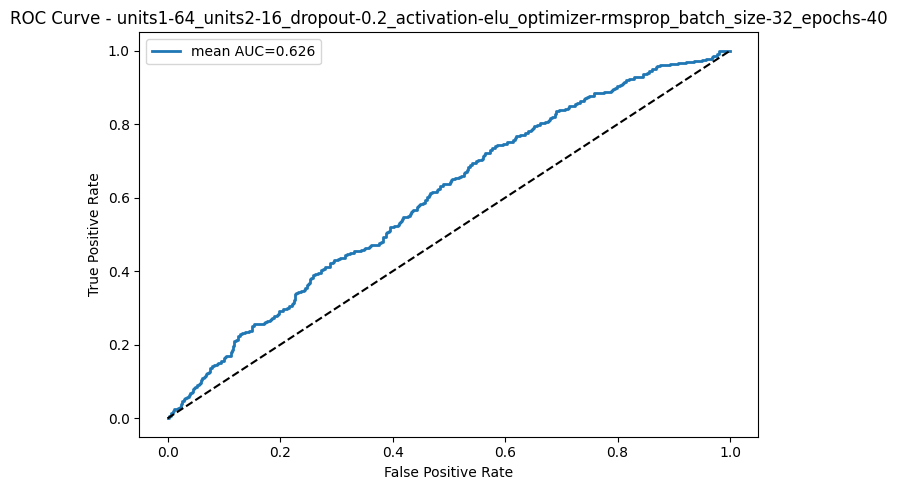

7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step 
Modelo hiperparams: units1-64_units2-16_dropout-0.2_activation-elu_optimizer-rmsprop_batch_size-64_epochs-40
AUC promedio en CV: 0.624


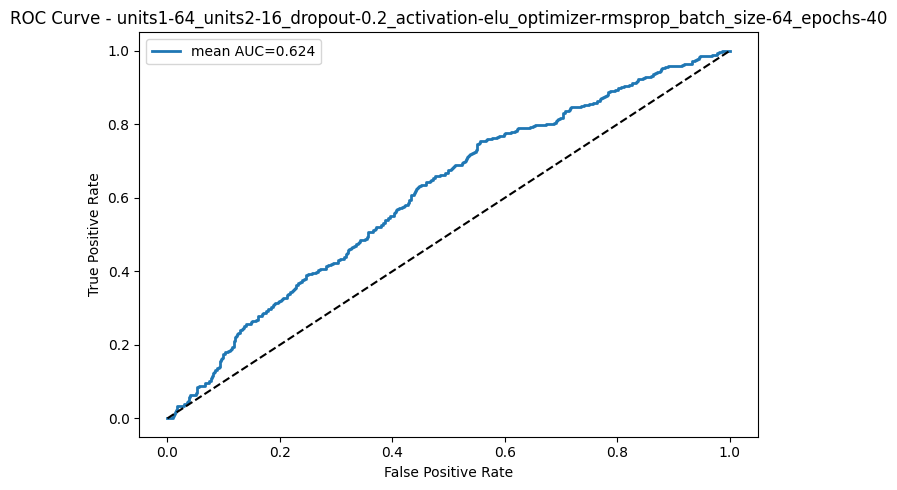

7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step 
Modelo hiperparams: units1-64_units2-16_dropout-0.5_activation-relu_optimizer-adam_batch_size-16_epochs-40
AUC promedio en CV: 0.571


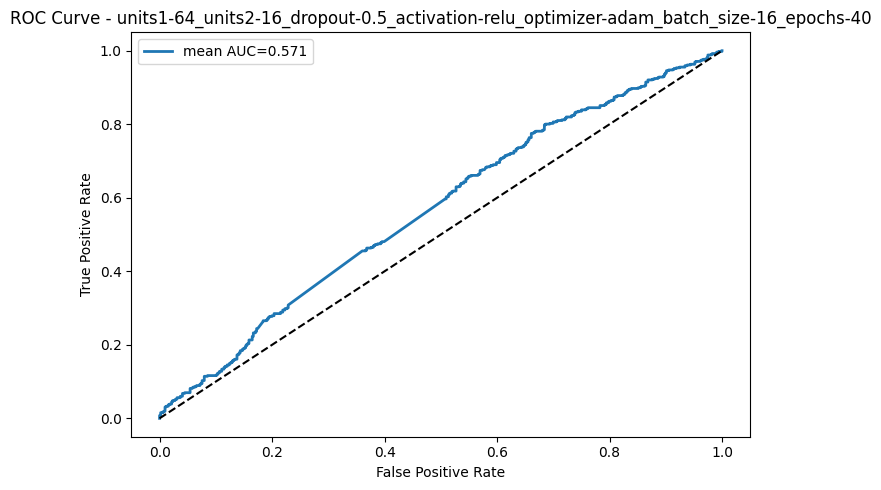

7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step 
Modelo hiperparams: units1-64_units2-16_dropout-0.5_activation-relu_optimizer-adam_batch_size-32_epochs-40
AUC promedio en CV: 0.541


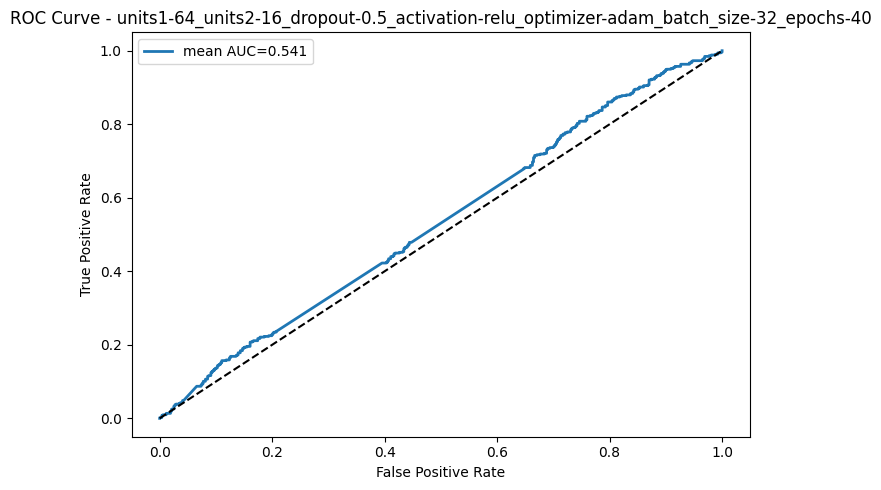

7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step 
Modelo hiperparams: units1-64_units2-16_dropout-0.5_activation-relu_optimizer-adam_batch_size-64_epochs-40
AUC promedio en CV: 0.578


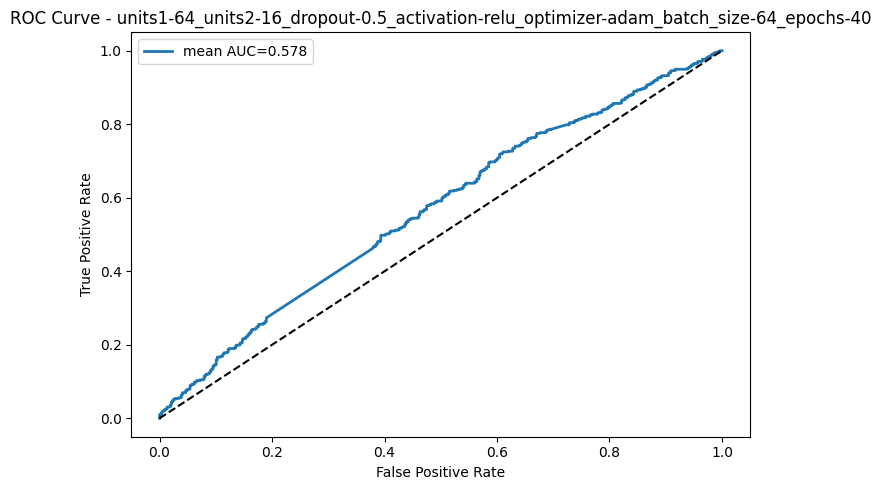

7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step 
Modelo hiperparams: units1-64_units2-16_dropout-0.5_activation-relu_optimizer-rmsprop_batch_size-16_epochs-40
AUC promedio en CV: 0.587


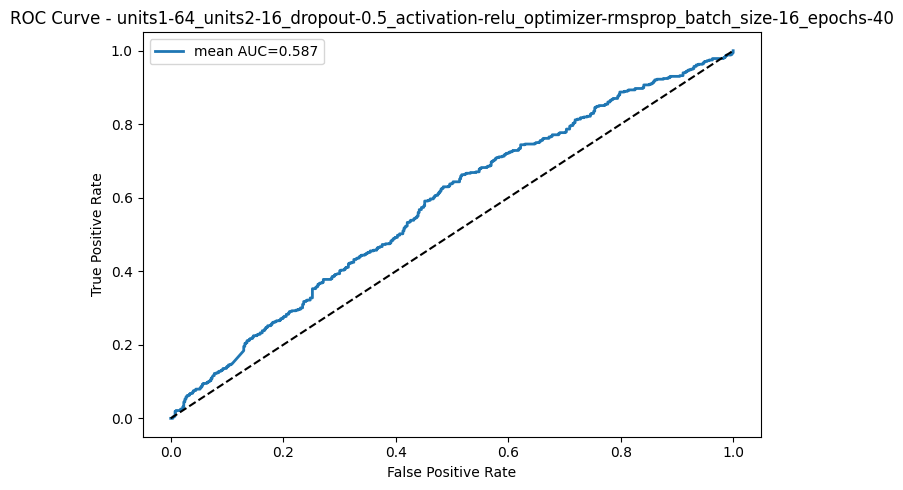

7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step 
Modelo hiperparams: units1-64_units2-16_dropout-0.5_activation-relu_optimizer-rmsprop_batch_size-32_epochs-40
AUC promedio en CV: 0.557


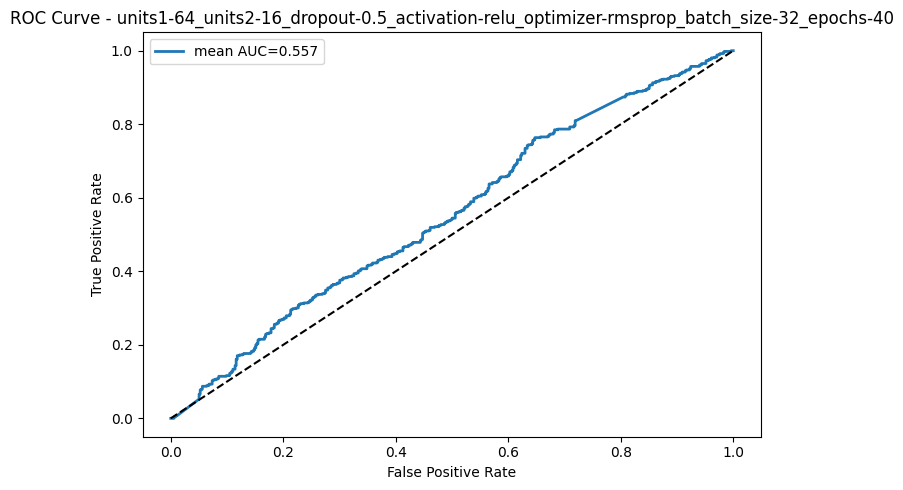

7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step 
Modelo hiperparams: units1-64_units2-16_dropout-0.5_activation-relu_optimizer-rmsprop_batch_size-64_epochs-40
AUC promedio en CV: 0.581


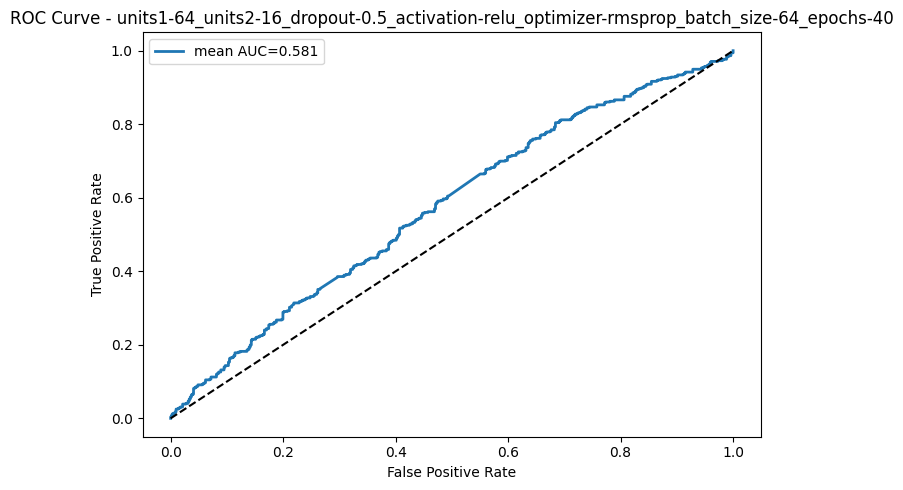

7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step 
Modelo hiperparams: units1-64_units2-16_dropout-0.5_activation-tanh_optimizer-adam_batch_size-16_epochs-40
AUC promedio en CV: 0.597


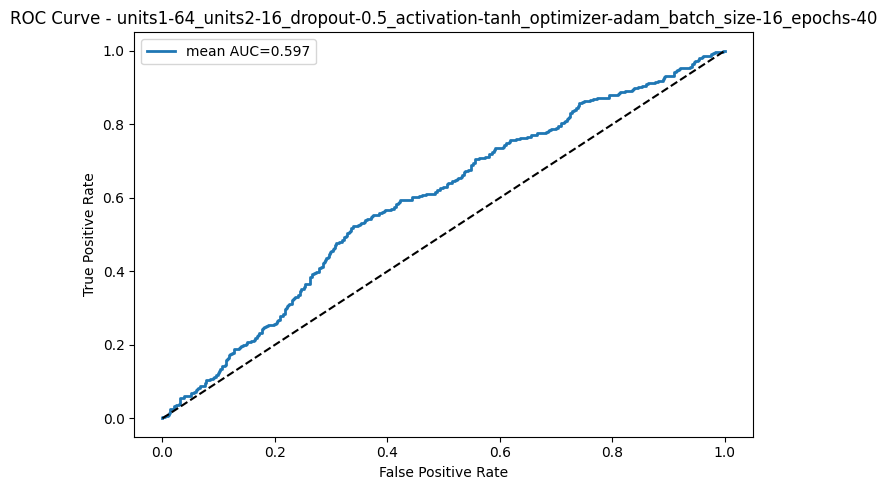

7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step 
Modelo hiperparams: units1-64_units2-16_dropout-0.5_activation-tanh_optimizer-adam_batch_size-32_epochs-40
AUC promedio en CV: 0.604


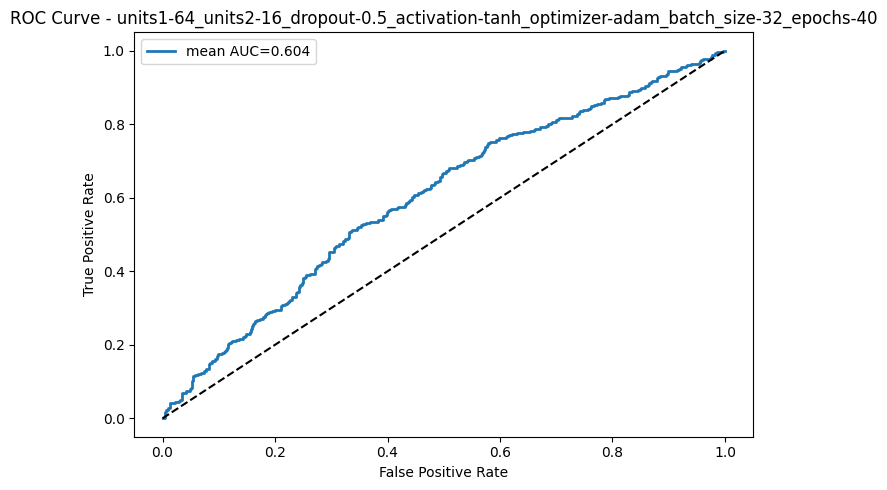

7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step 
Modelo hiperparams: units1-64_units2-16_dropout-0.5_activation-tanh_optimizer-adam_batch_size-64_epochs-40
AUC promedio en CV: 0.610


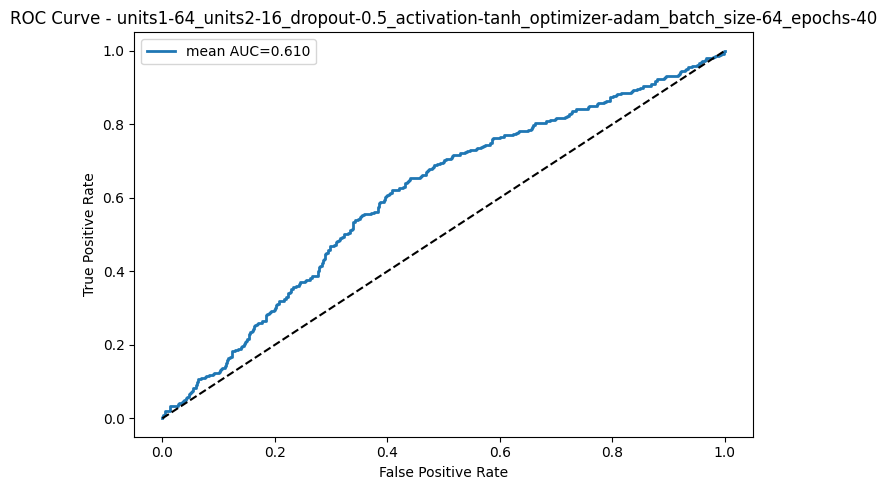

7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step 
Modelo hiperparams: units1-64_units2-16_dropout-0.5_activation-tanh_optimizer-rmsprop_batch_size-16_epochs-40
AUC promedio en CV: 0.615


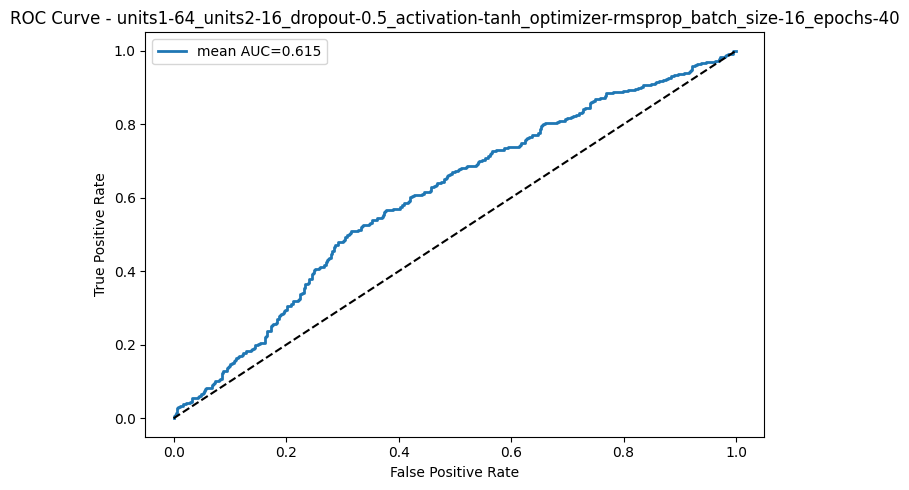

7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 
Modelo hiperparams: units1-64_units2-16_dropout-0.5_activation-tanh_optimizer-rmsprop_batch_size-32_epochs-40
AUC promedio en CV: 0.599


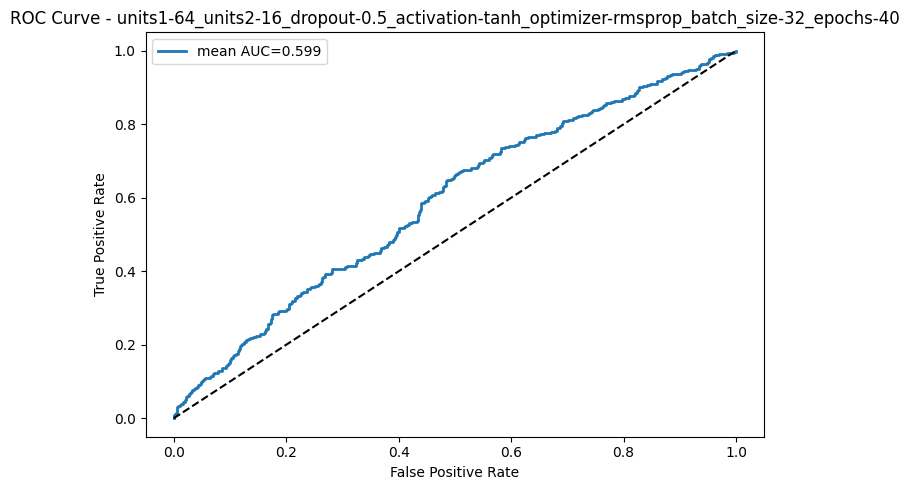

7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step 
Modelo hiperparams: units1-64_units2-16_dropout-0.5_activation-tanh_optimizer-rmsprop_batch_size-64_epochs-40
AUC promedio en CV: 0.597


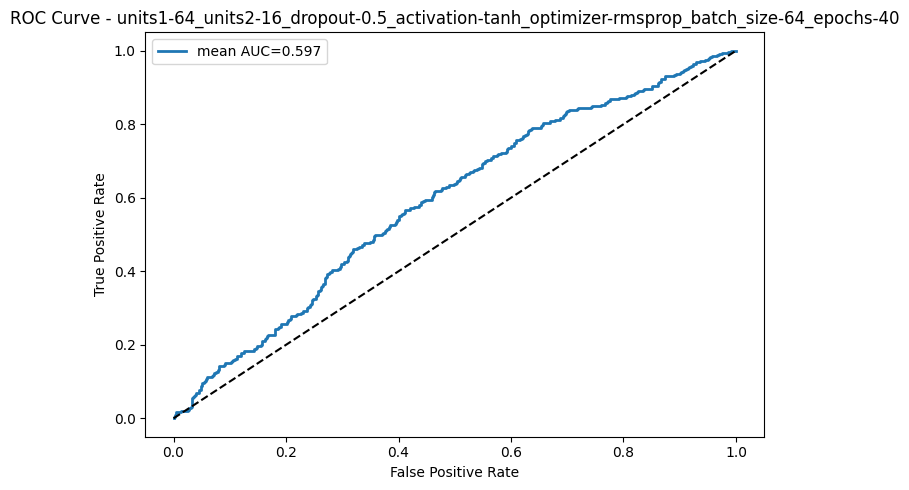

7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step 
Modelo hiperparams: units1-64_units2-16_dropout-0.5_activation-elu_optimizer-adam_batch_size-16_epochs-40
AUC promedio en CV: 0.613


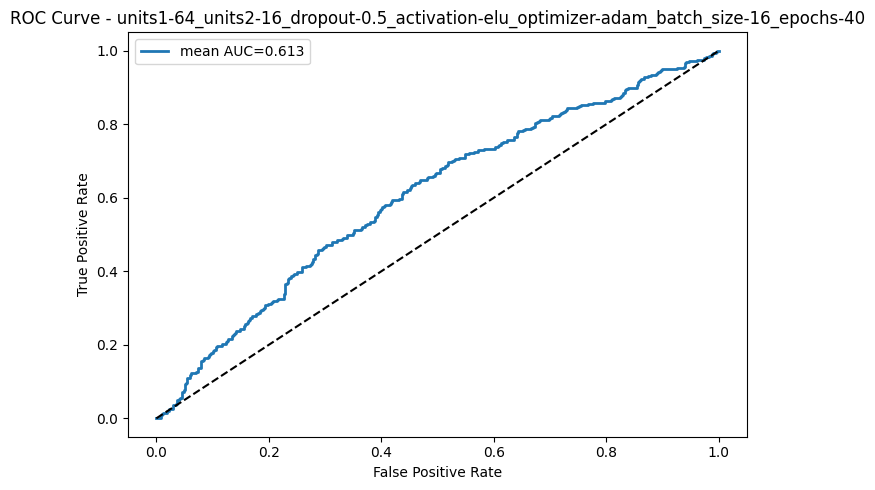

7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step 
Modelo hiperparams: units1-64_units2-16_dropout-0.5_activation-elu_optimizer-adam_batch_size-32_epochs-40
AUC promedio en CV: 0.605


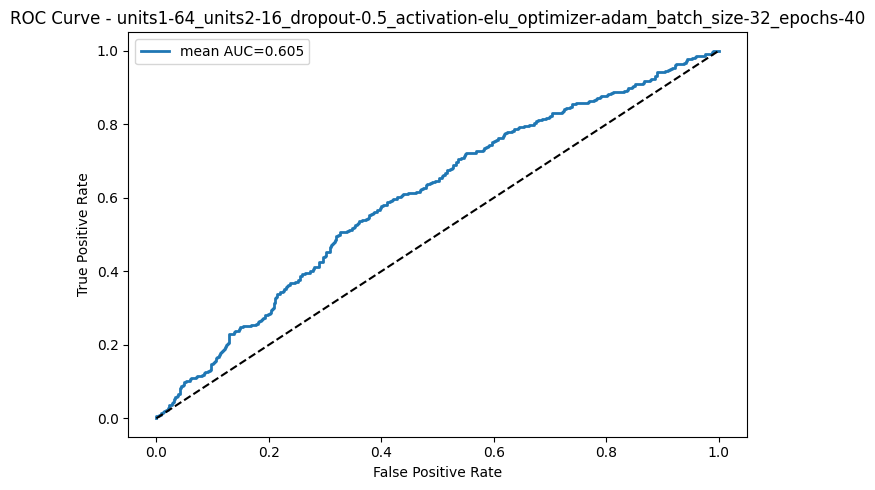

7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step 
Modelo hiperparams: units1-64_units2-16_dropout-0.5_activation-elu_optimizer-adam_batch_size-64_epochs-40
AUC promedio en CV: 0.595


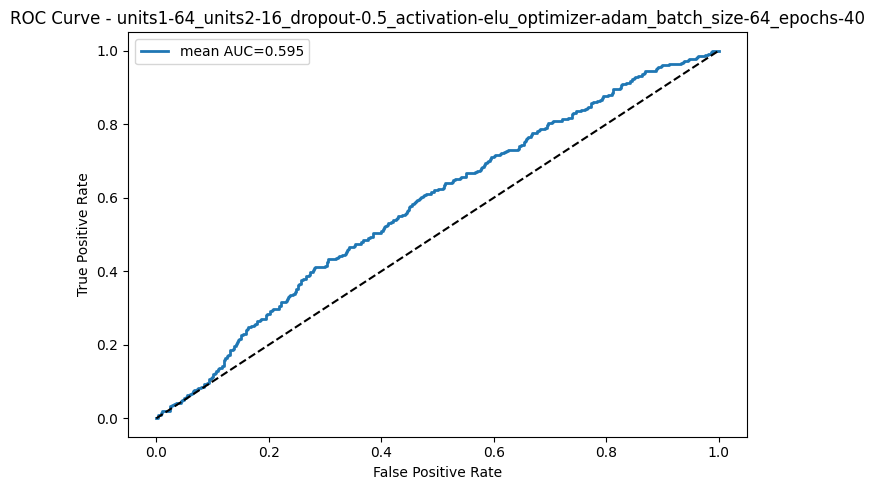

7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step 
Modelo hiperparams: units1-64_units2-16_dropout-0.5_activation-elu_optimizer-rmsprop_batch_size-16_epochs-40
AUC promedio en CV: 0.606


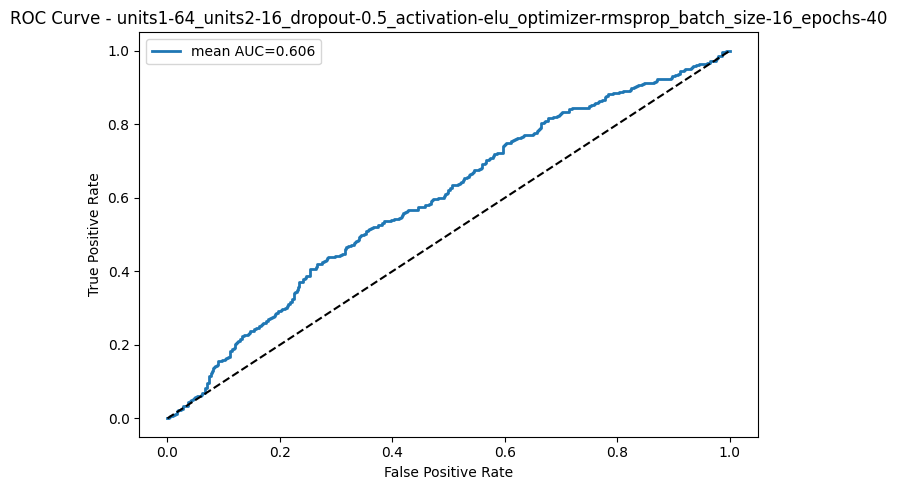

7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step 
Modelo hiperparams: units1-64_units2-16_dropout-0.5_activation-elu_optimizer-rmsprop_batch_size-32_epochs-40
AUC promedio en CV: 0.603


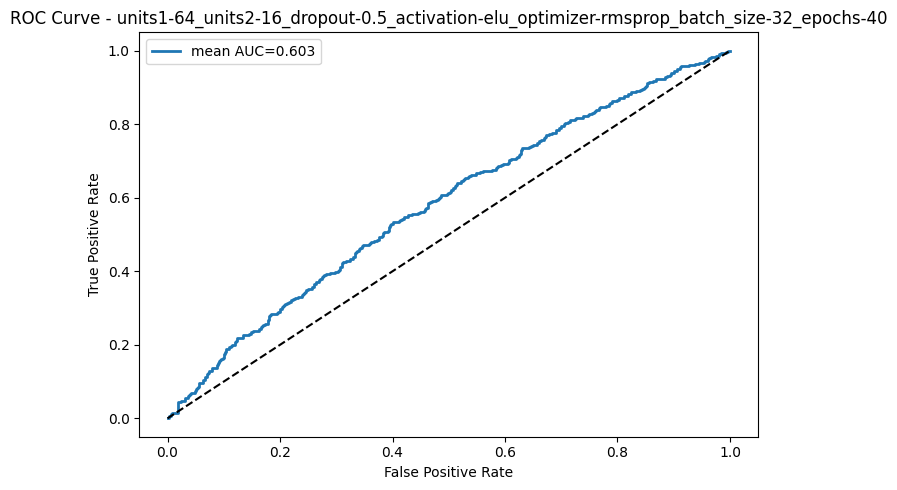

7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step 
Modelo hiperparams: units1-64_units2-16_dropout-0.5_activation-elu_optimizer-rmsprop_batch_size-64_epochs-40
AUC promedio en CV: 0.601


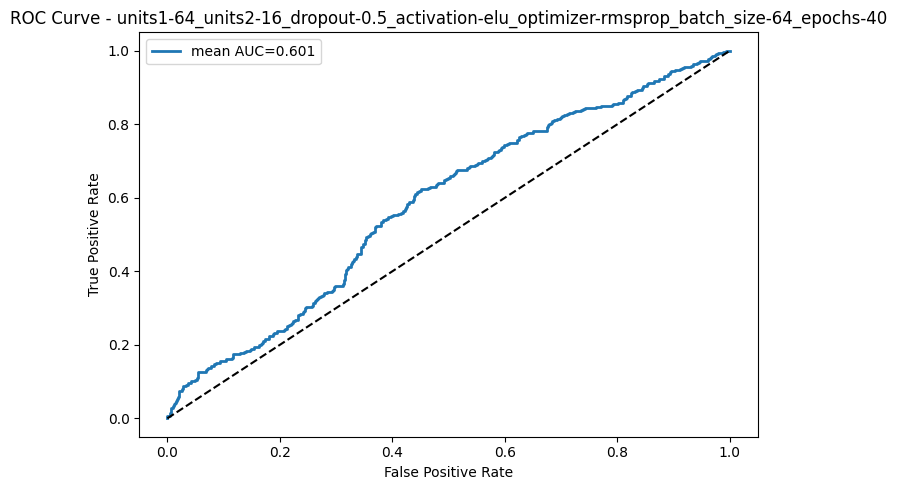

7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 
Modelo hiperparams: units1-64_units2-32_dropout-0.2_activation-relu_optimizer-adam_batch_size-16_epochs-40
AUC promedio en CV: 0.592


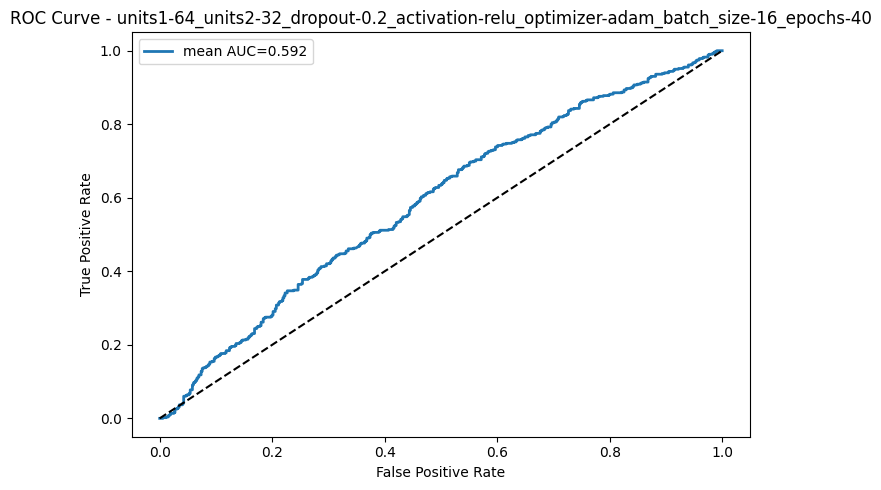

7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step 
Modelo hiperparams: units1-64_units2-32_dropout-0.2_activation-relu_optimizer-adam_batch_size-32_epochs-40
AUC promedio en CV: 0.607


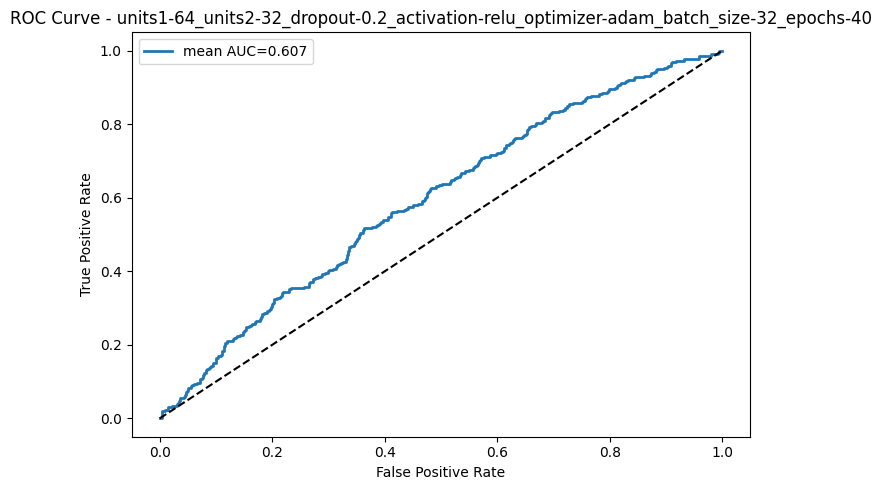

7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step 
Modelo hiperparams: units1-64_units2-32_dropout-0.2_activation-relu_optimizer-adam_batch_size-64_epochs-40
AUC promedio en CV: 0.600


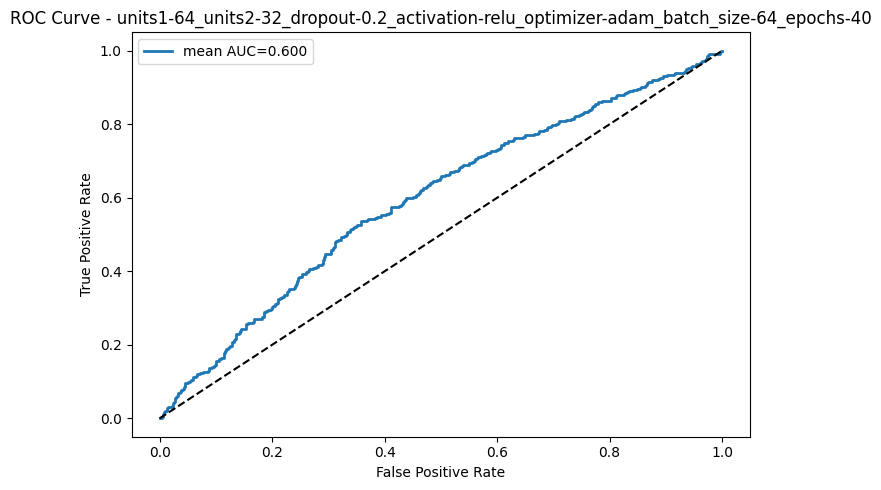

7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 
Modelo hiperparams: units1-64_units2-32_dropout-0.2_activation-relu_optimizer-rmsprop_batch_size-16_epochs-40
AUC promedio en CV: 0.614


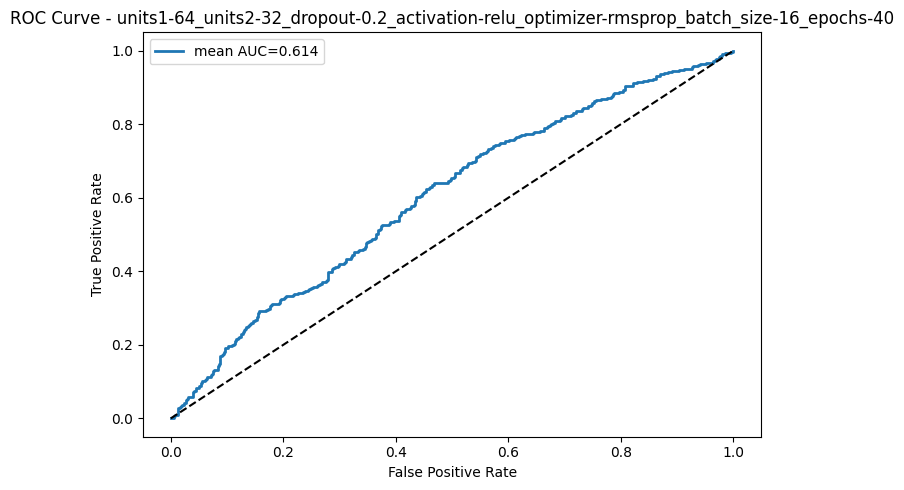

7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step 
Modelo hiperparams: units1-64_units2-32_dropout-0.2_activation-relu_optimizer-rmsprop_batch_size-32_epochs-40
AUC promedio en CV: 0.619


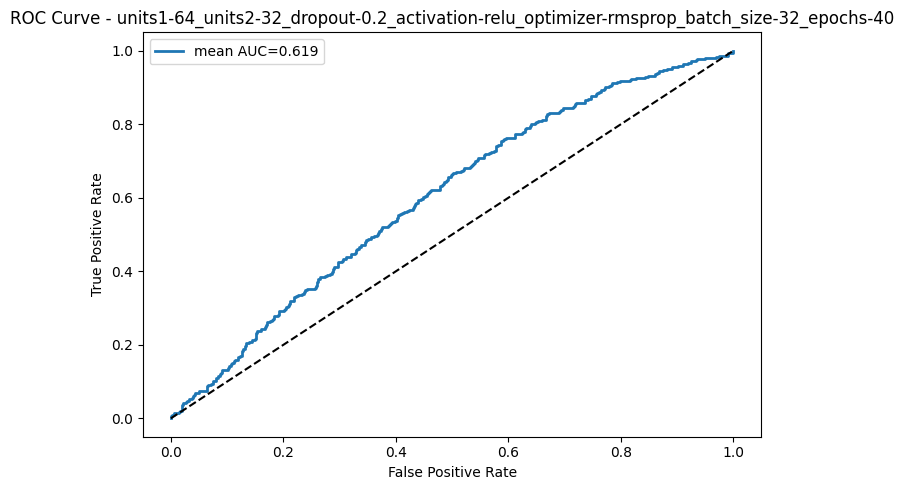

7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step 
Modelo hiperparams: units1-64_units2-32_dropout-0.2_activation-relu_optimizer-rmsprop_batch_size-64_epochs-40
AUC promedio en CV: 0.602


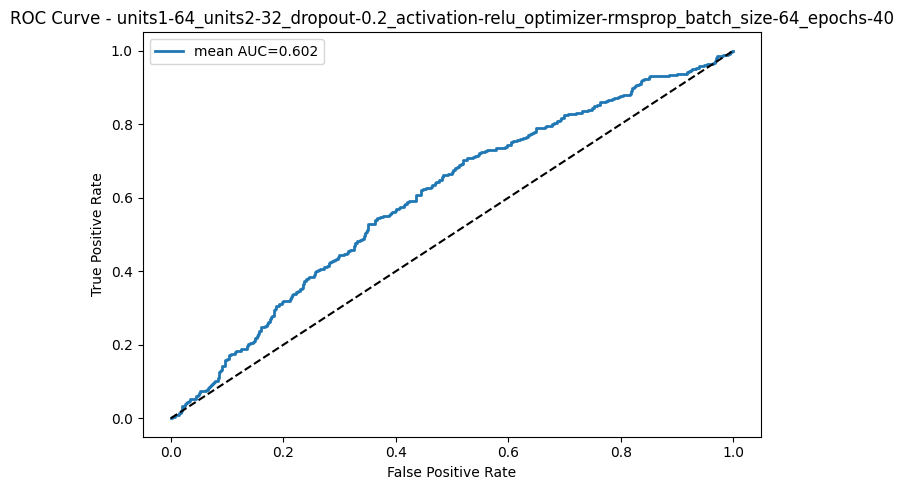

7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step 
Modelo hiperparams: units1-64_units2-32_dropout-0.2_activation-tanh_optimizer-adam_batch_size-16_epochs-40
AUC promedio en CV: 0.623


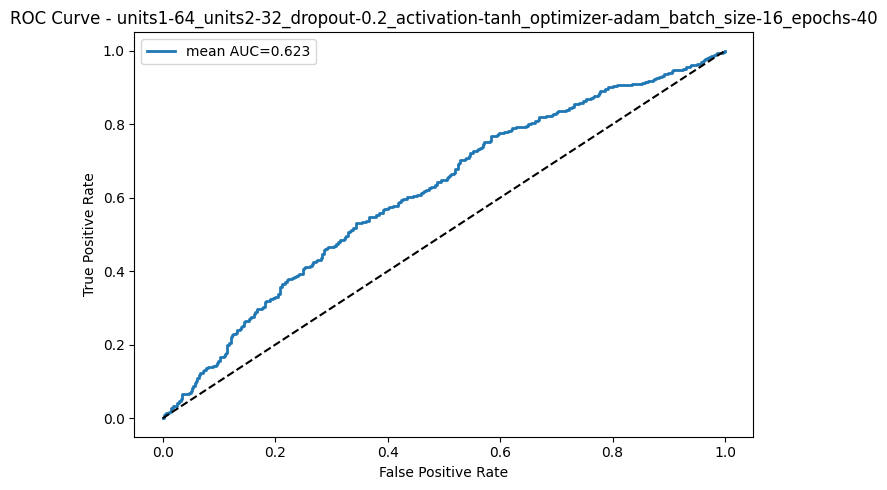

7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step 
Modelo hiperparams: units1-64_units2-32_dropout-0.2_activation-tanh_optimizer-adam_batch_size-32_epochs-40
AUC promedio en CV: 0.641


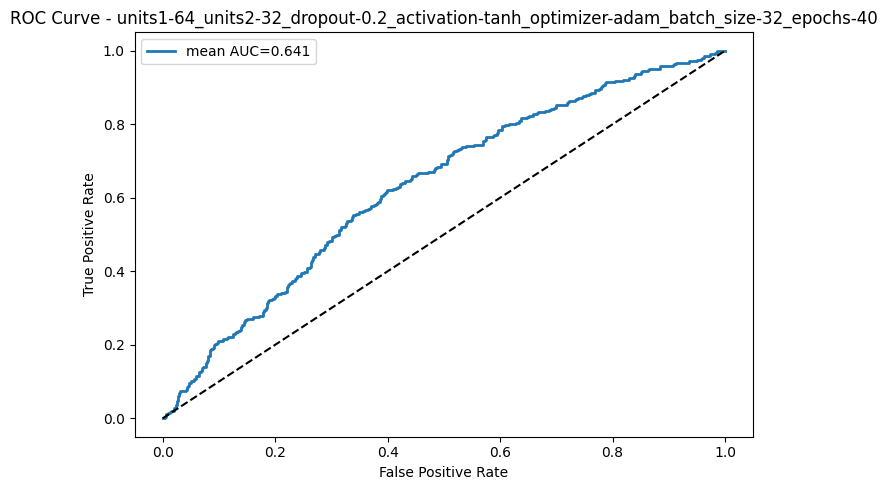

7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step 
Modelo hiperparams: units1-64_units2-32_dropout-0.2_activation-tanh_optimizer-adam_batch_size-64_epochs-40
AUC promedio en CV: 0.635


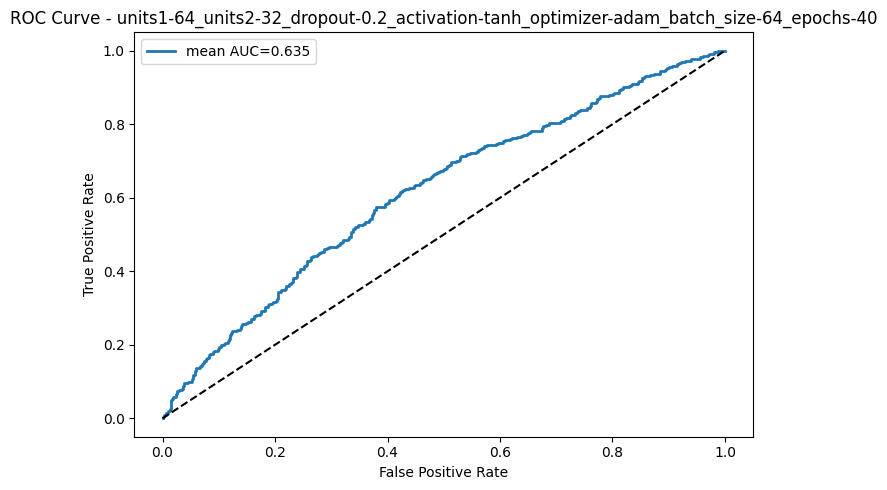

7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step 
Modelo hiperparams: units1-64_units2-32_dropout-0.2_activation-tanh_optimizer-rmsprop_batch_size-16_epochs-40
AUC promedio en CV: 0.629


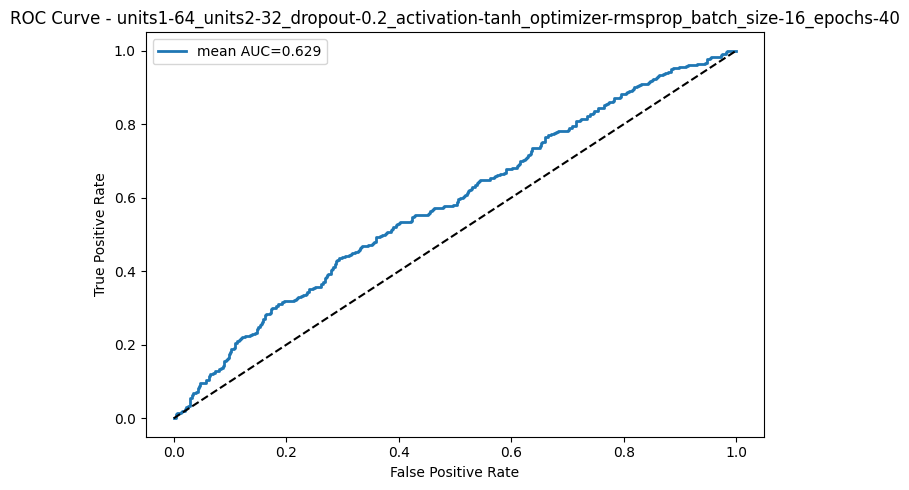

7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step
Modelo hiperparams: units1-64_units2-32_dropout-0.2_activation-tanh_optimizer-rmsprop_batch_size-32_epochs-40
AUC promedio en CV: 0.621


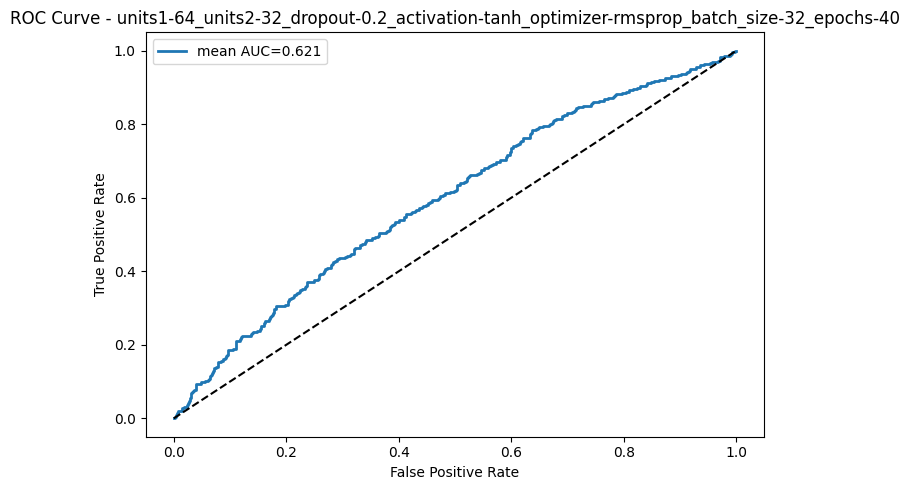

7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step 
Modelo hiperparams: units1-64_units2-32_dropout-0.2_activation-tanh_optimizer-rmsprop_batch_size-64_epochs-40
AUC promedio en CV: 0.621


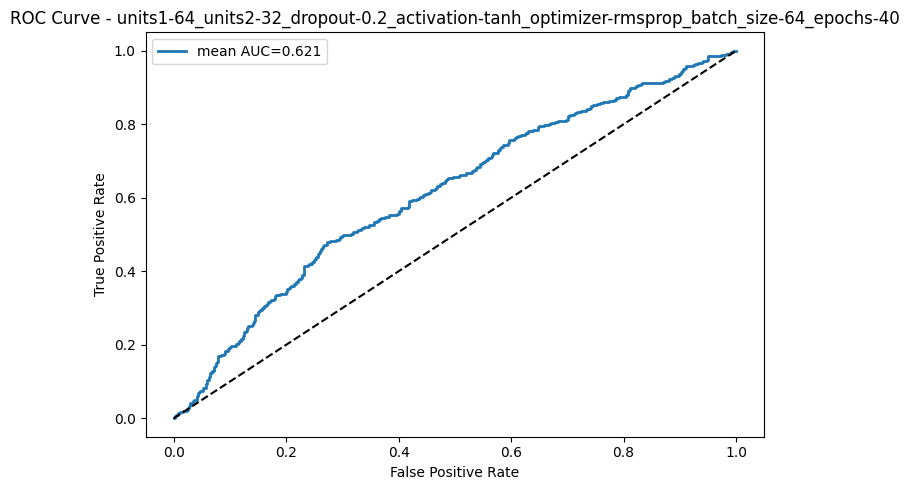

7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step
Modelo hiperparams: units1-64_units2-32_dropout-0.2_activation-elu_optimizer-adam_batch_size-16_epochs-40
AUC promedio en CV: 0.638


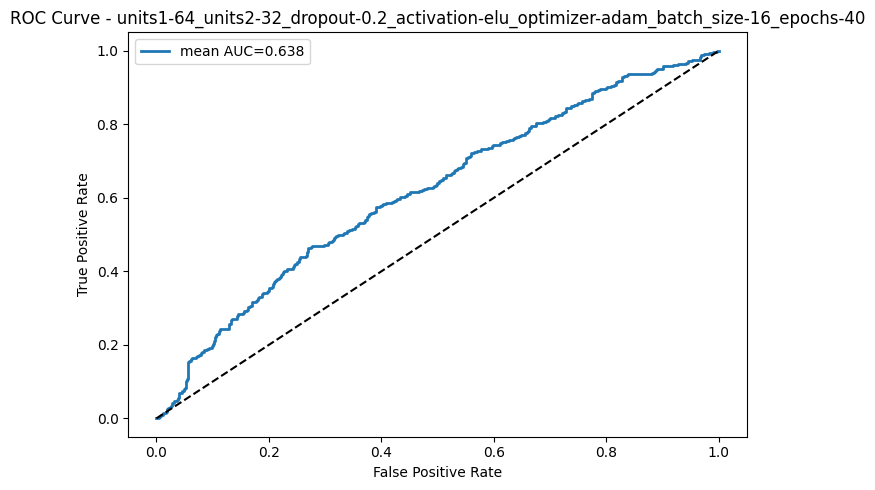

7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step 
Modelo hiperparams: units1-64_units2-32_dropout-0.2_activation-elu_optimizer-adam_batch_size-32_epochs-40
AUC promedio en CV: 0.644


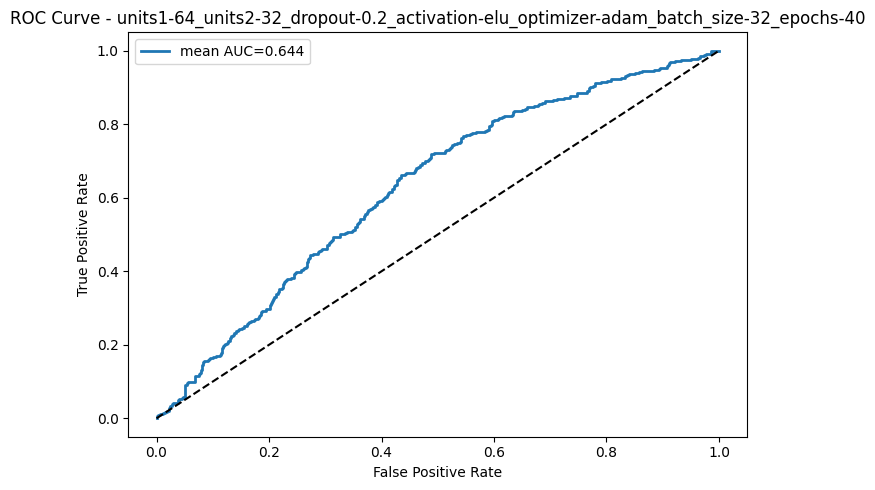

7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step 
Modelo hiperparams: units1-64_units2-32_dropout-0.2_activation-elu_optimizer-adam_batch_size-64_epochs-40
AUC promedio en CV: 0.626


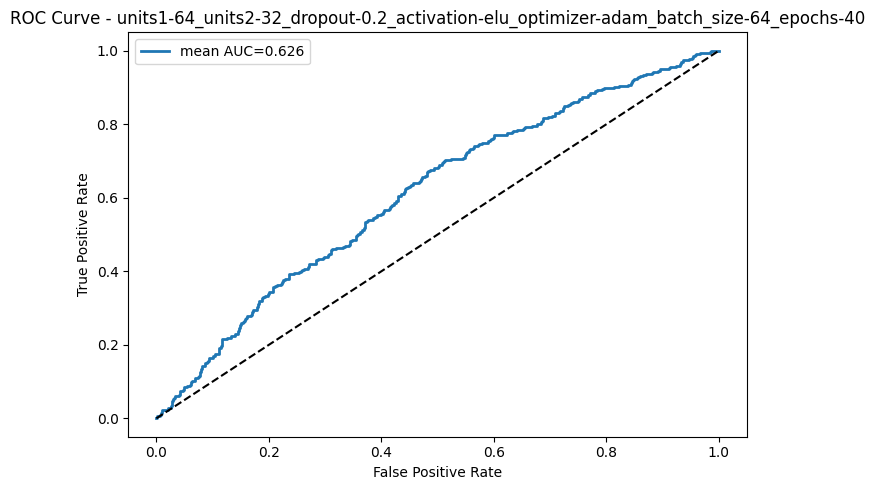

7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step 
Modelo hiperparams: units1-64_units2-32_dropout-0.2_activation-elu_optimizer-rmsprop_batch_size-16_epochs-40
AUC promedio en CV: 0.626


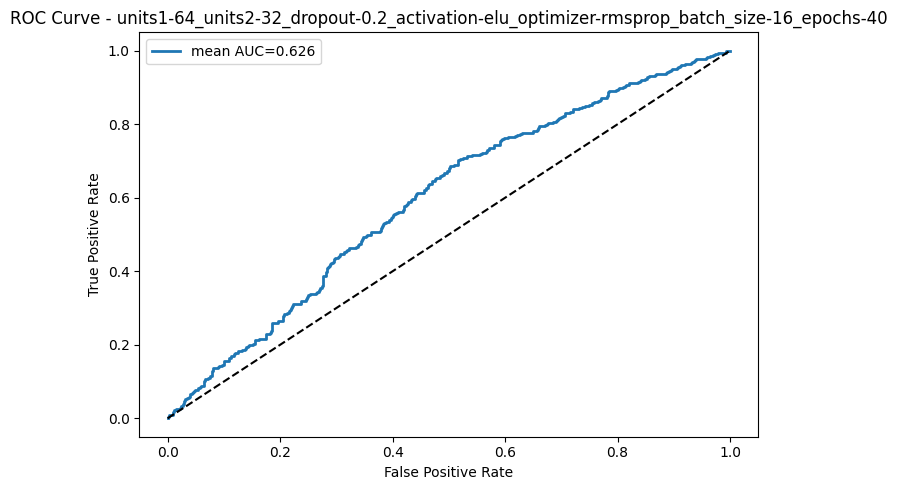

7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step 
Modelo hiperparams: units1-64_units2-32_dropout-0.2_activation-elu_optimizer-rmsprop_batch_size-32_epochs-40
AUC promedio en CV: 0.631


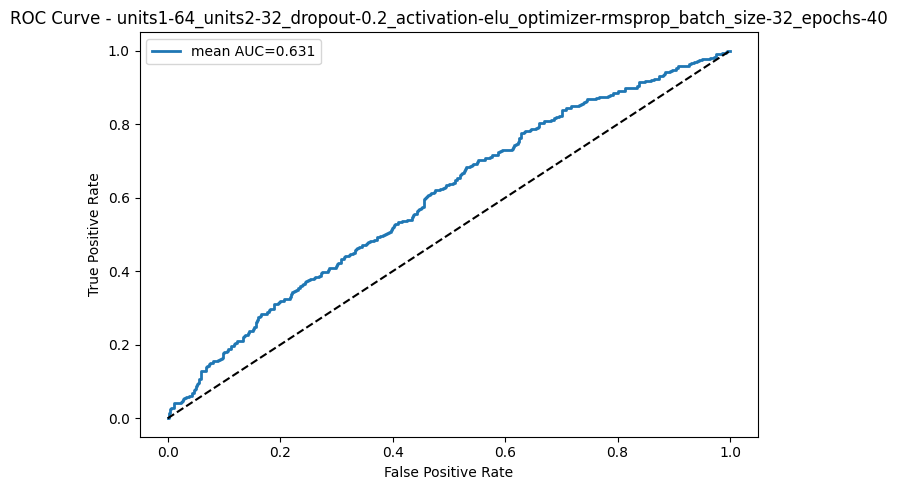

7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step 
Modelo hiperparams: units1-64_units2-32_dropout-0.2_activation-elu_optimizer-rmsprop_batch_size-64_epochs-40
AUC promedio en CV: 0.617


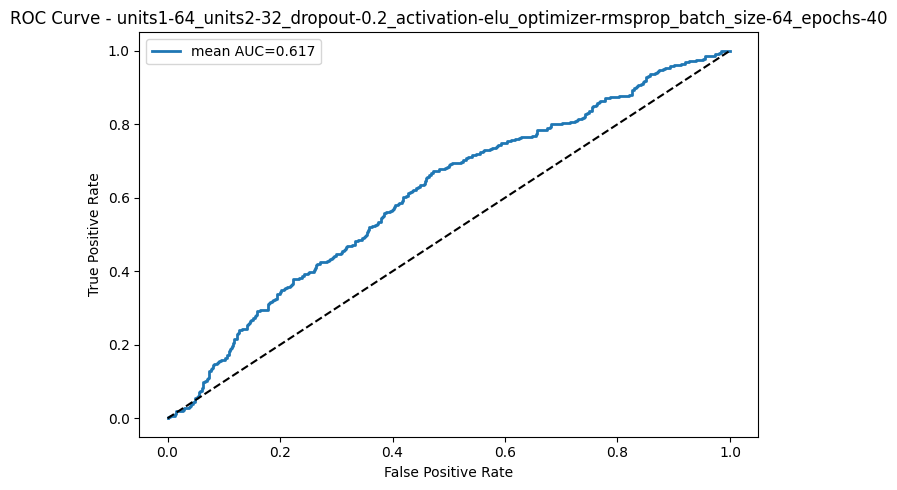

7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step 
Modelo hiperparams: units1-64_units2-32_dropout-0.5_activation-relu_optimizer-adam_batch_size-16_epochs-40
AUC promedio en CV: 0.581


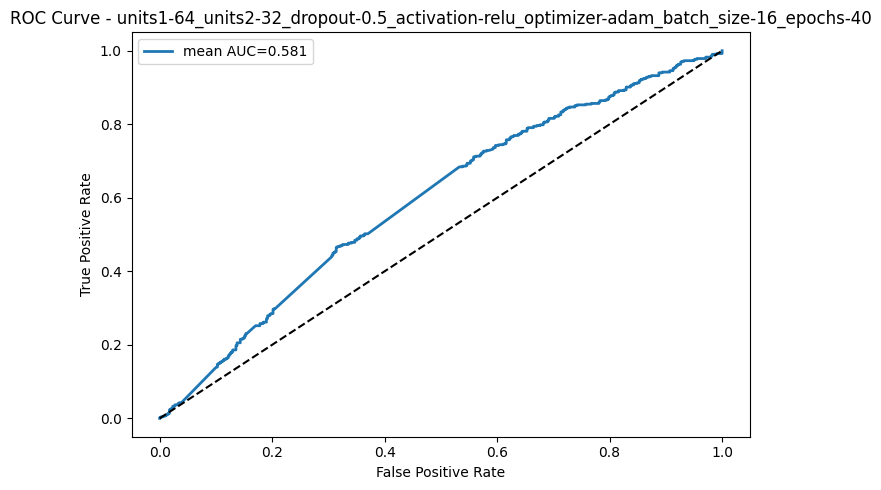

7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step 
Modelo hiperparams: units1-64_units2-32_dropout-0.5_activation-relu_optimizer-adam_batch_size-32_epochs-40
AUC promedio en CV: 0.572


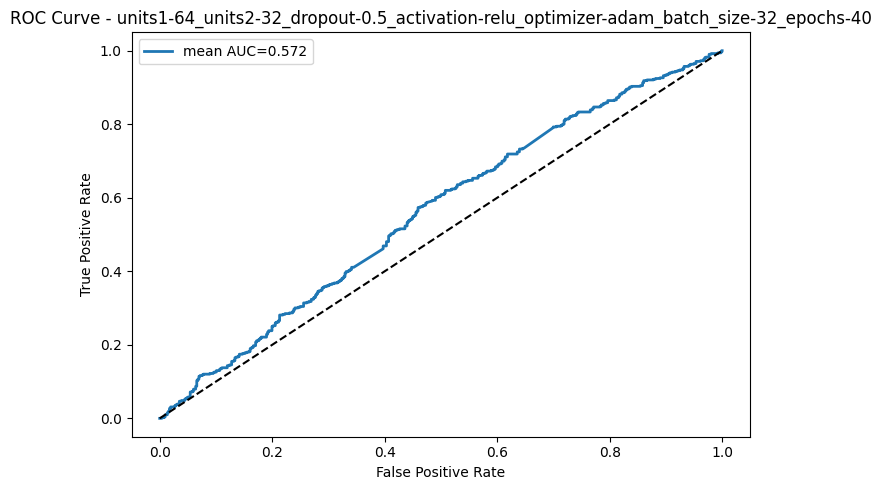

7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step 
Modelo hiperparams: units1-64_units2-32_dropout-0.5_activation-relu_optimizer-adam_batch_size-64_epochs-40
AUC promedio en CV: 0.570


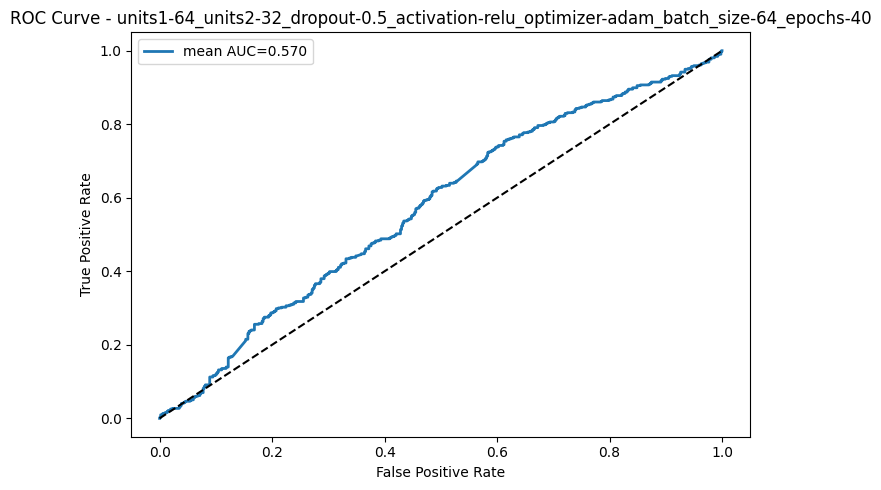

7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 
Modelo hiperparams: units1-64_units2-32_dropout-0.5_activation-relu_optimizer-rmsprop_batch_size-16_epochs-40
AUC promedio en CV: 0.583


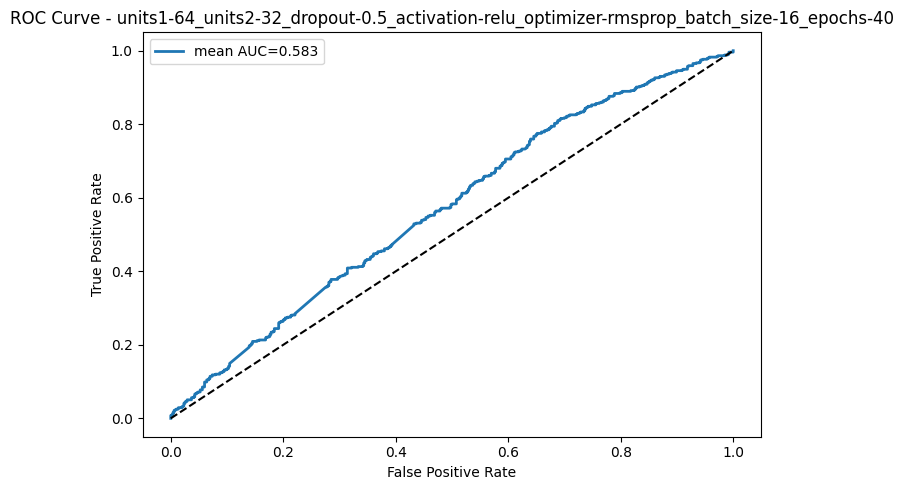

7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step 
Modelo hiperparams: units1-64_units2-32_dropout-0.5_activation-relu_optimizer-rmsprop_batch_size-32_epochs-40
AUC promedio en CV: 0.583


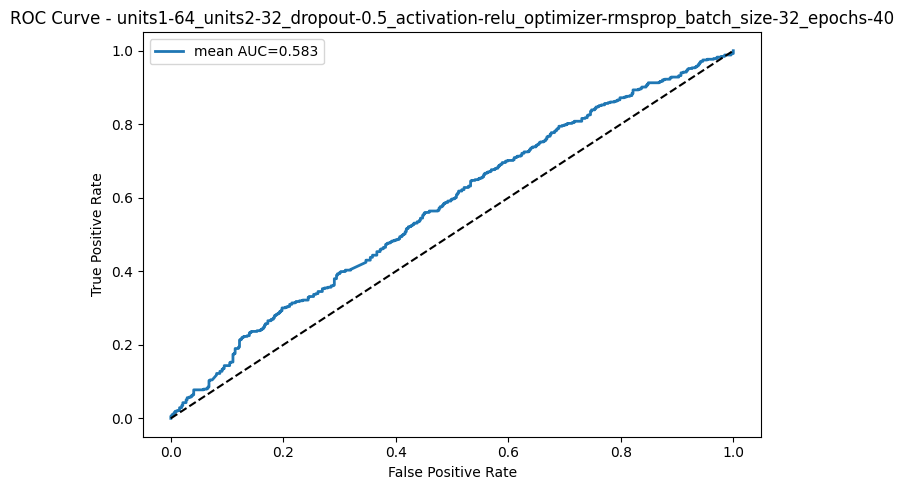

7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step 
Modelo hiperparams: units1-64_units2-32_dropout-0.5_activation-relu_optimizer-rmsprop_batch_size-64_epochs-40
AUC promedio en CV: 0.587


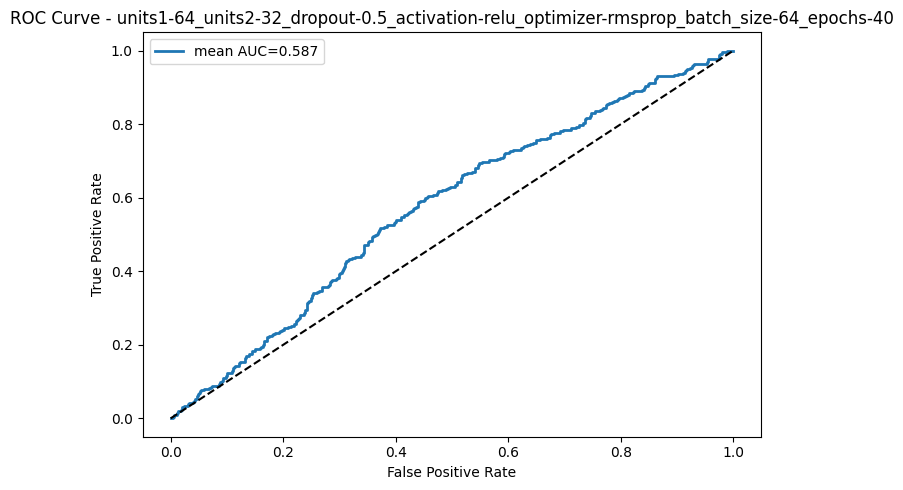

7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 
Modelo hiperparams: units1-64_units2-32_dropout-0.5_activation-tanh_optimizer-adam_batch_size-16_epochs-40
AUC promedio en CV: 0.614


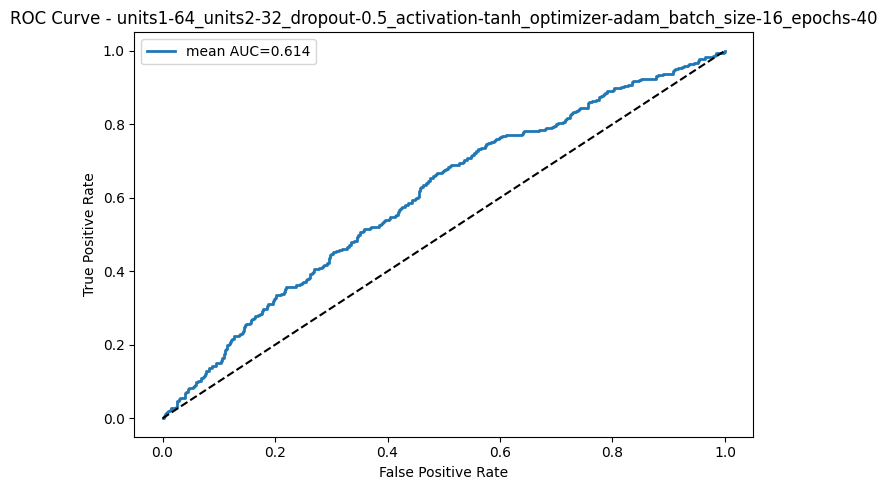

7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step 
Modelo hiperparams: units1-64_units2-32_dropout-0.5_activation-tanh_optimizer-adam_batch_size-32_epochs-40
AUC promedio en CV: 0.601


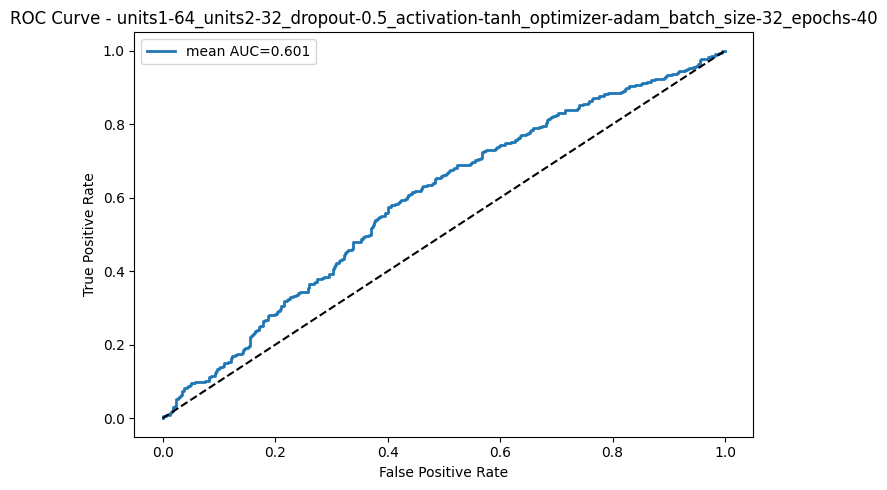

7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step 
Modelo hiperparams: units1-64_units2-32_dropout-0.5_activation-tanh_optimizer-adam_batch_size-64_epochs-40
AUC promedio en CV: 0.599


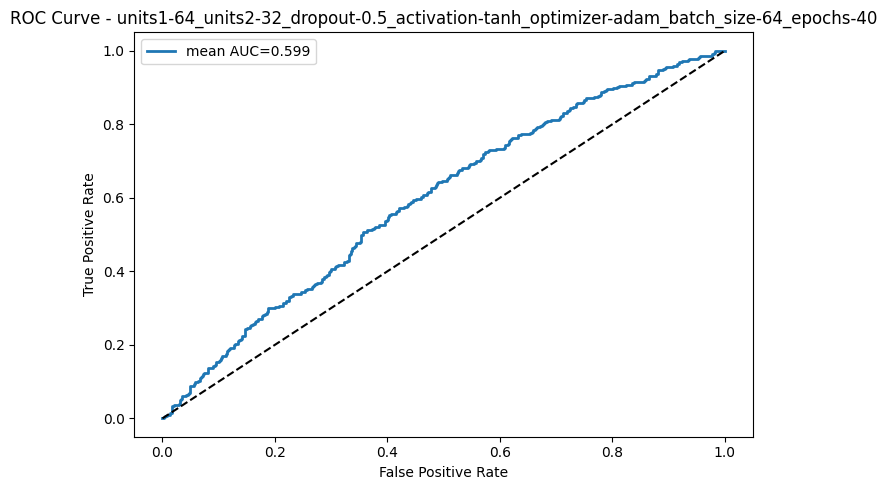

7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 
Modelo hiperparams: units1-64_units2-32_dropout-0.5_activation-tanh_optimizer-rmsprop_batch_size-16_epochs-40
AUC promedio en CV: 0.610


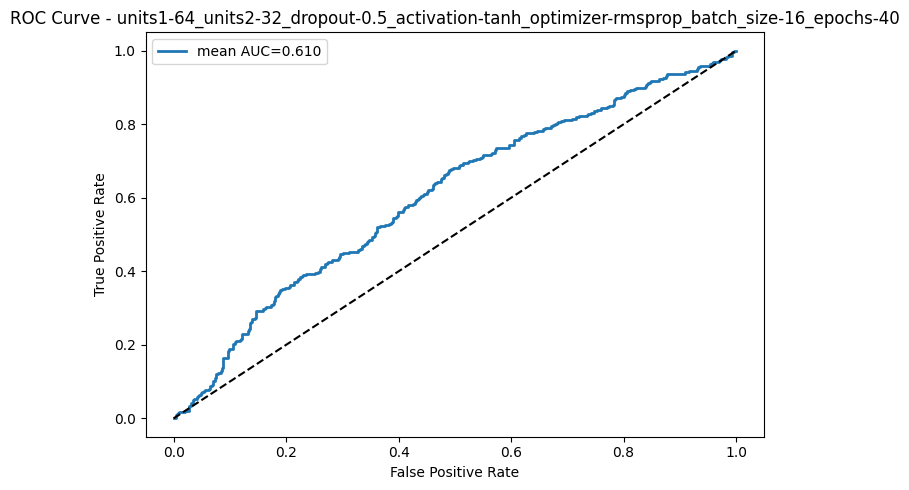

7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step 
Modelo hiperparams: units1-64_units2-32_dropout-0.5_activation-tanh_optimizer-rmsprop_batch_size-32_epochs-40
AUC promedio en CV: 0.613


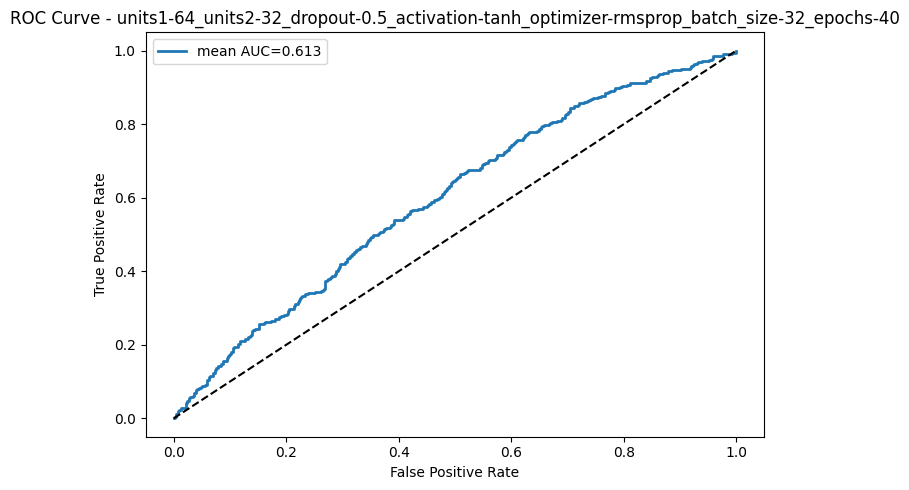

7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step 
Modelo hiperparams: units1-64_units2-32_dropout-0.5_activation-tanh_optimizer-rmsprop_batch_size-64_epochs-40
AUC promedio en CV: 0.607


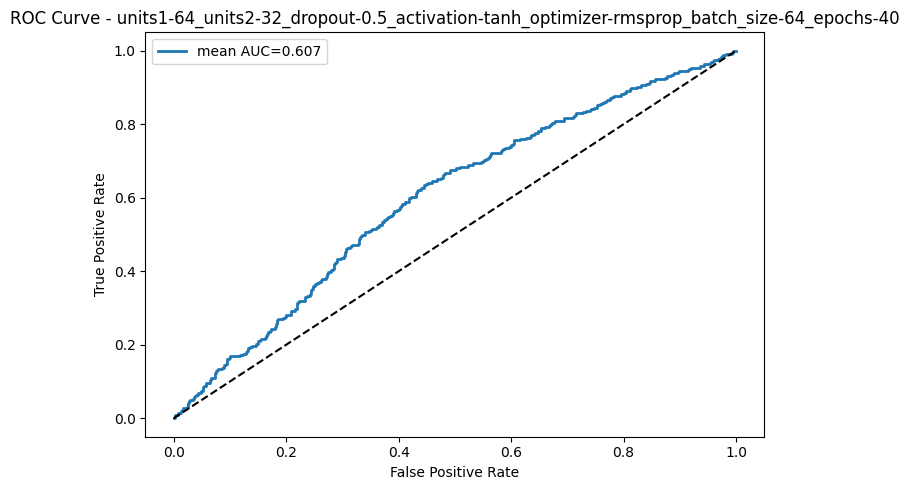

7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step 
Modelo hiperparams: units1-64_units2-32_dropout-0.5_activation-elu_optimizer-adam_batch_size-16_epochs-40
AUC promedio en CV: 0.614


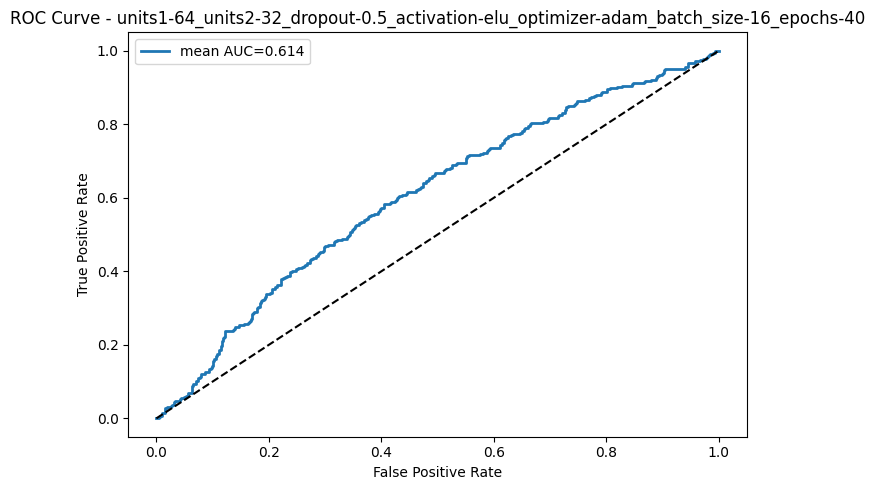

7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step 
Modelo hiperparams: units1-64_units2-32_dropout-0.5_activation-elu_optimizer-adam_batch_size-32_epochs-40
AUC promedio en CV: 0.624


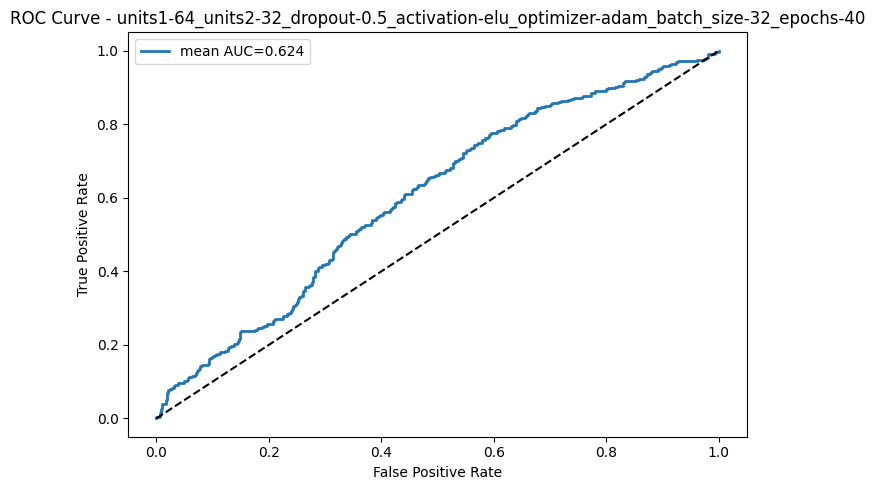

7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step 
Modelo hiperparams: units1-64_units2-32_dropout-0.5_activation-elu_optimizer-adam_batch_size-64_epochs-40
AUC promedio en CV: 0.609


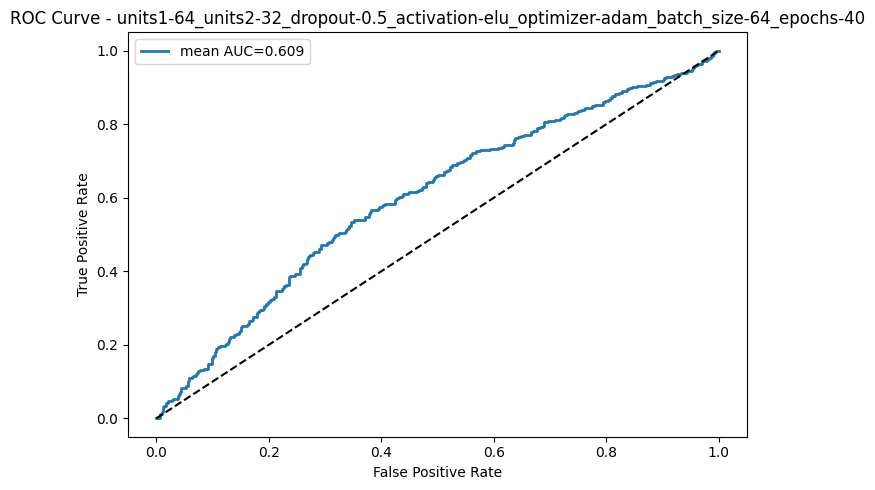

7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 
Modelo hiperparams: units1-64_units2-32_dropout-0.5_activation-elu_optimizer-rmsprop_batch_size-16_epochs-40
AUC promedio en CV: 0.617


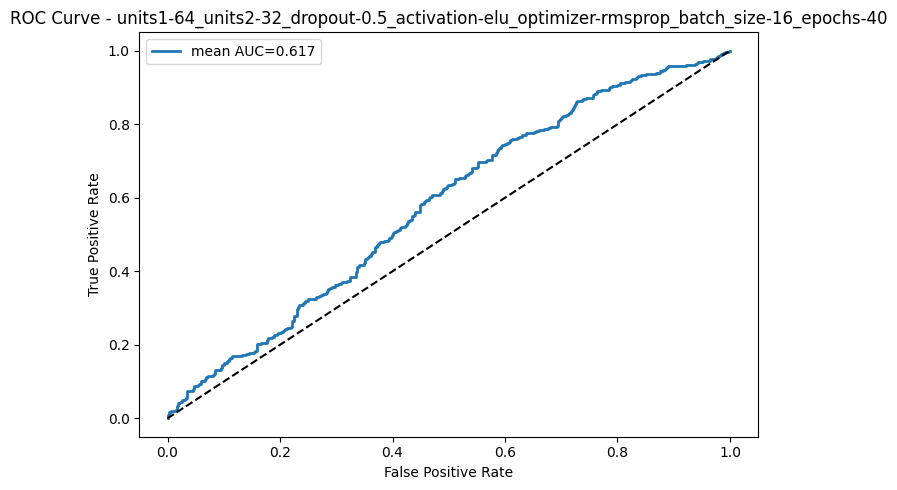

7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step 
Modelo hiperparams: units1-64_units2-32_dropout-0.5_activation-elu_optimizer-rmsprop_batch_size-32_epochs-40
AUC promedio en CV: 0.605


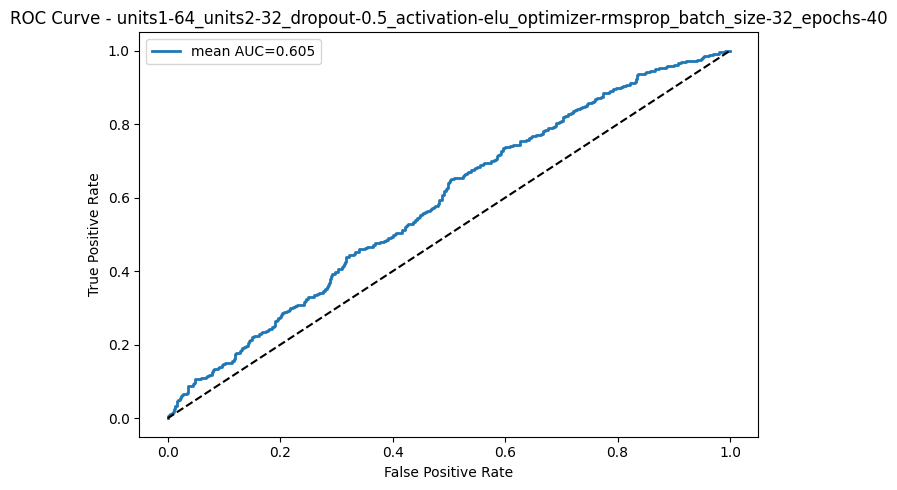

7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step 
Modelo hiperparams: units1-64_units2-32_dropout-0.5_activation-elu_optimizer-rmsprop_batch_size-64_epochs-40
AUC promedio en CV: 0.612


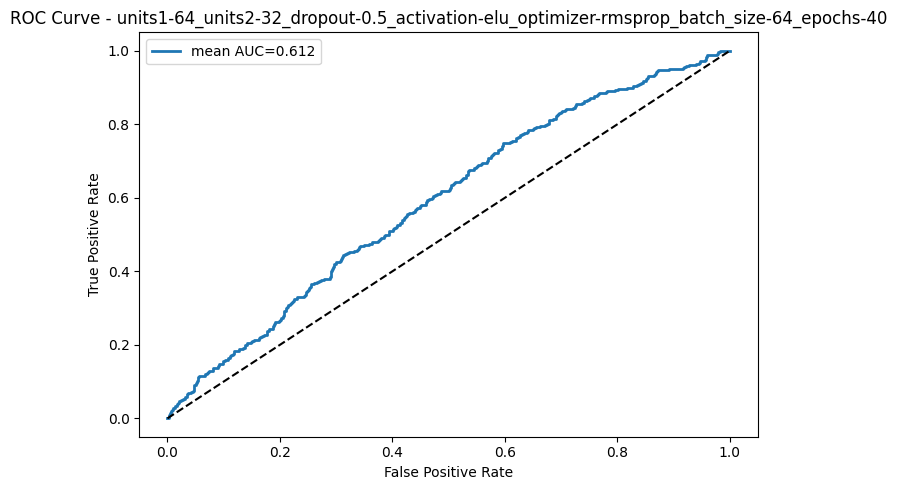

7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step 
Modelo hiperparams: units1-64_units2-64_dropout-0.2_activation-relu_optimizer-adam_batch_size-16_epochs-40
AUC promedio en CV: 0.622


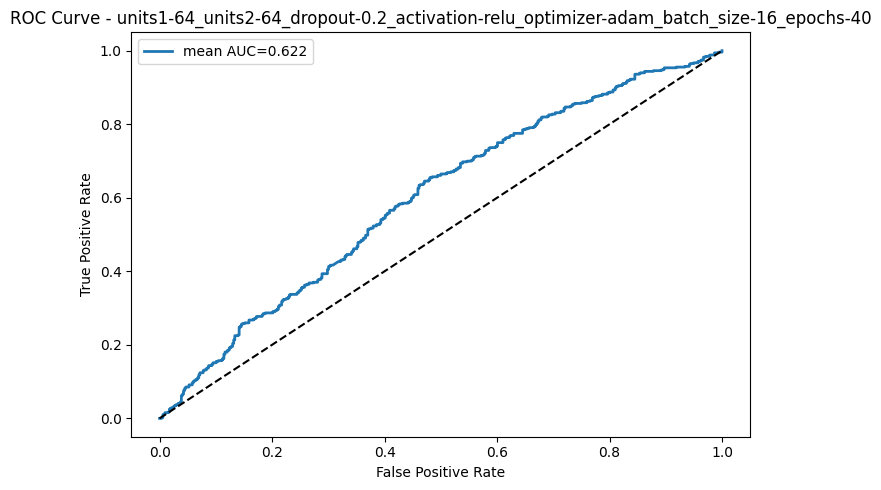

7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 
Modelo hiperparams: units1-64_units2-64_dropout-0.2_activation-relu_optimizer-adam_batch_size-32_epochs-40
AUC promedio en CV: 0.619


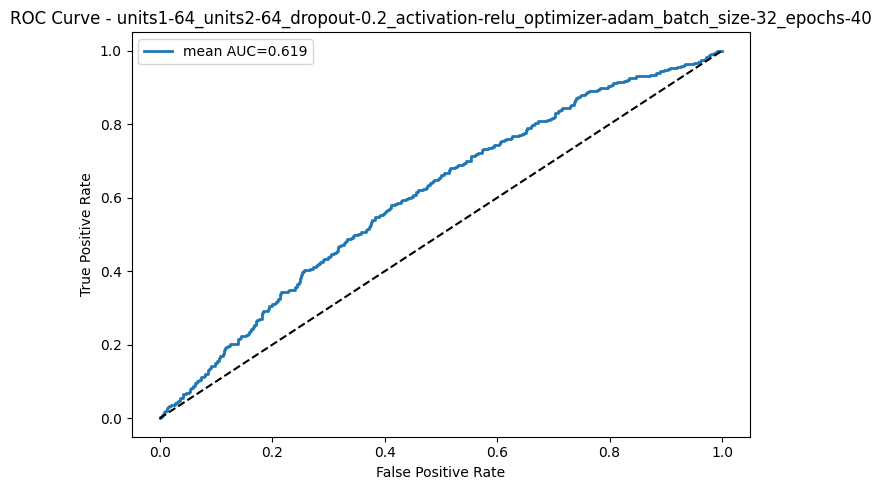

7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step 
Modelo hiperparams: units1-64_units2-64_dropout-0.2_activation-relu_optimizer-adam_batch_size-64_epochs-40
AUC promedio en CV: 0.613


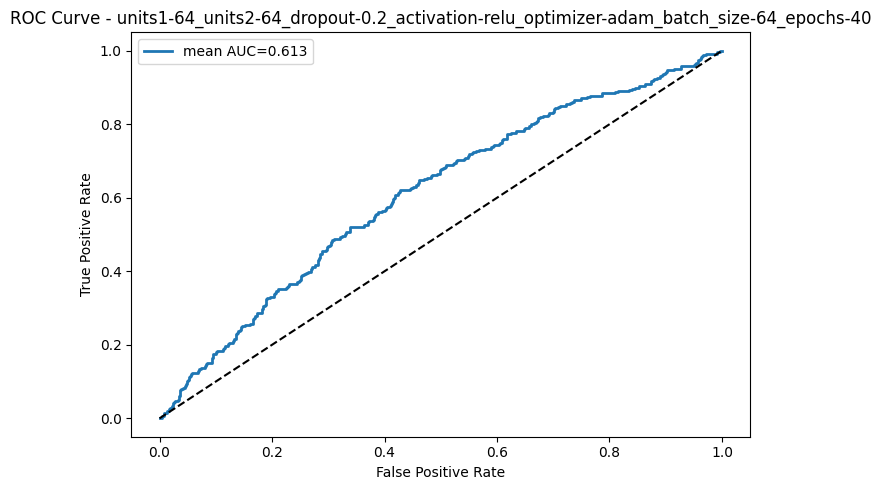

7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step 
Modelo hiperparams: units1-64_units2-64_dropout-0.2_activation-relu_optimizer-rmsprop_batch_size-16_epochs-40
AUC promedio en CV: 0.614


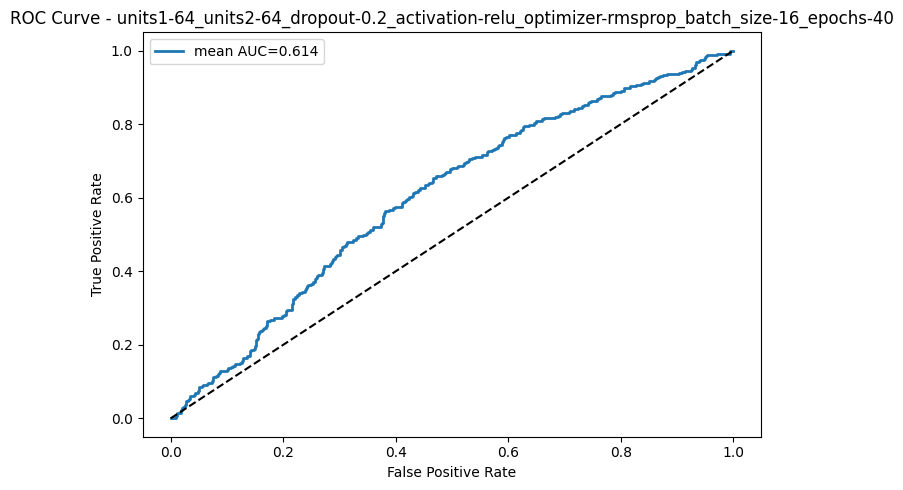

7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step 
Modelo hiperparams: units1-64_units2-64_dropout-0.2_activation-relu_optimizer-rmsprop_batch_size-32_epochs-40
AUC promedio en CV: 0.601


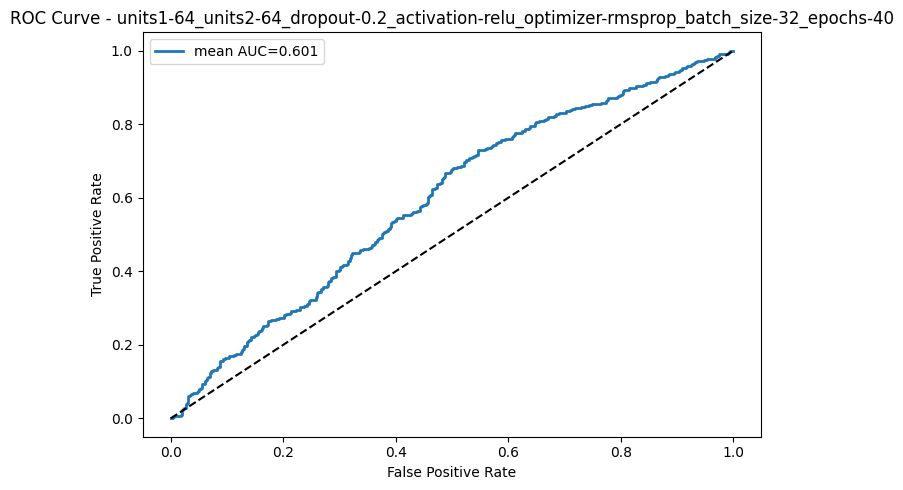

7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step 
Modelo hiperparams: units1-64_units2-64_dropout-0.2_activation-relu_optimizer-rmsprop_batch_size-64_epochs-40
AUC promedio en CV: 0.609


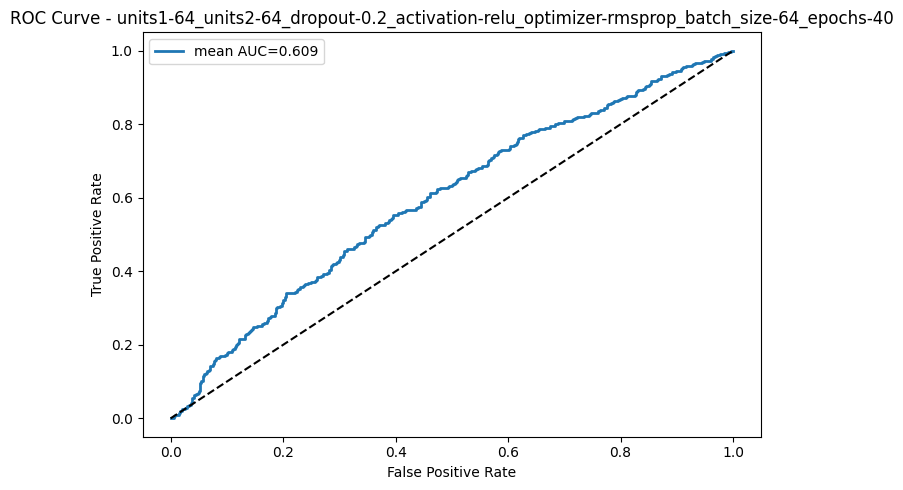

7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
Modelo hiperparams: units1-64_units2-64_dropout-0.2_activation-tanh_optimizer-adam_batch_size-16_epochs-40
AUC promedio en CV: 0.629


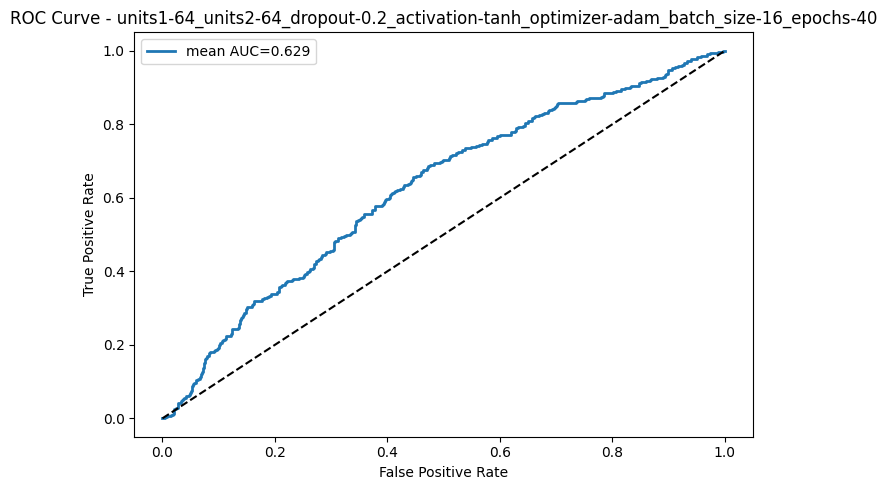

7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 
Modelo hiperparams: units1-64_units2-64_dropout-0.2_activation-tanh_optimizer-adam_batch_size-32_epochs-40
AUC promedio en CV: 0.636


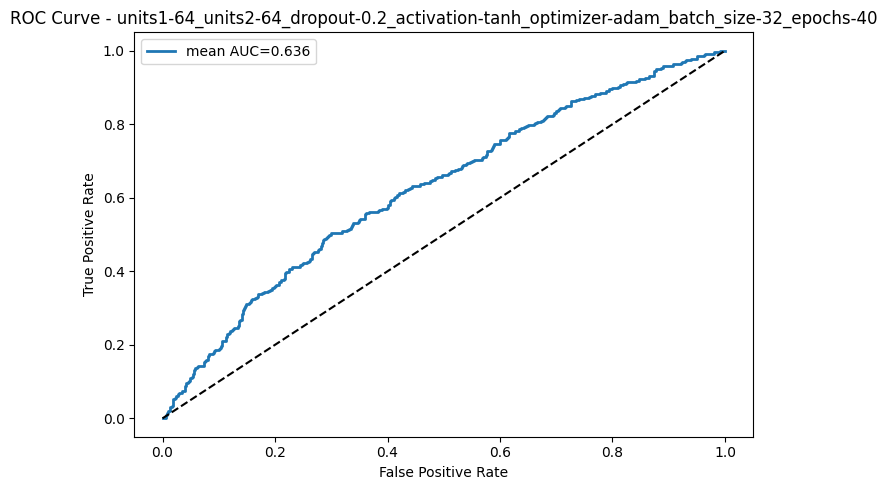

7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step 
Modelo hiperparams: units1-64_units2-64_dropout-0.2_activation-tanh_optimizer-adam_batch_size-64_epochs-40
AUC promedio en CV: 0.641


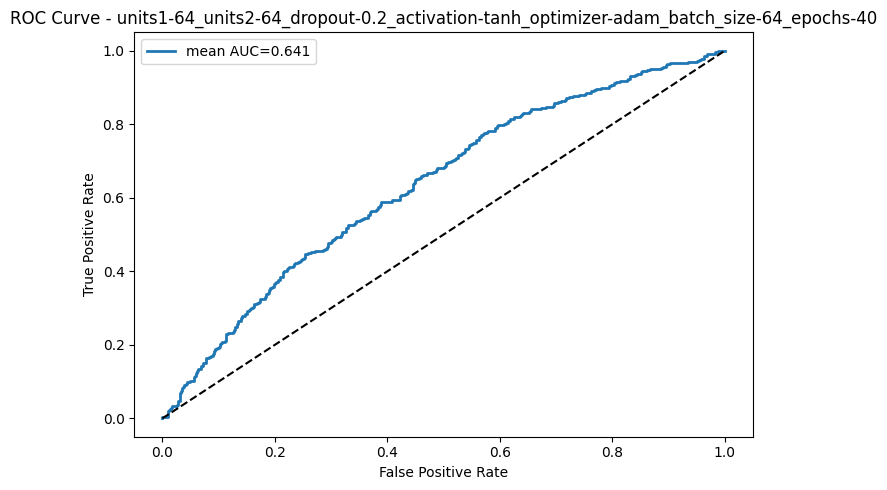

7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step 
Modelo hiperparams: units1-64_units2-64_dropout-0.2_activation-tanh_optimizer-rmsprop_batch_size-16_epochs-40
AUC promedio en CV: 0.635


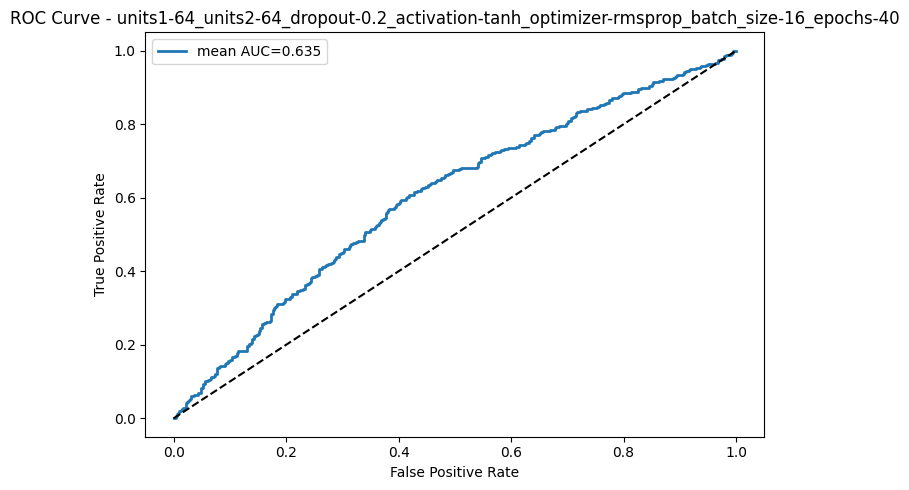

7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step 
Modelo hiperparams: units1-64_units2-64_dropout-0.2_activation-tanh_optimizer-rmsprop_batch_size-32_epochs-40
AUC promedio en CV: 0.635


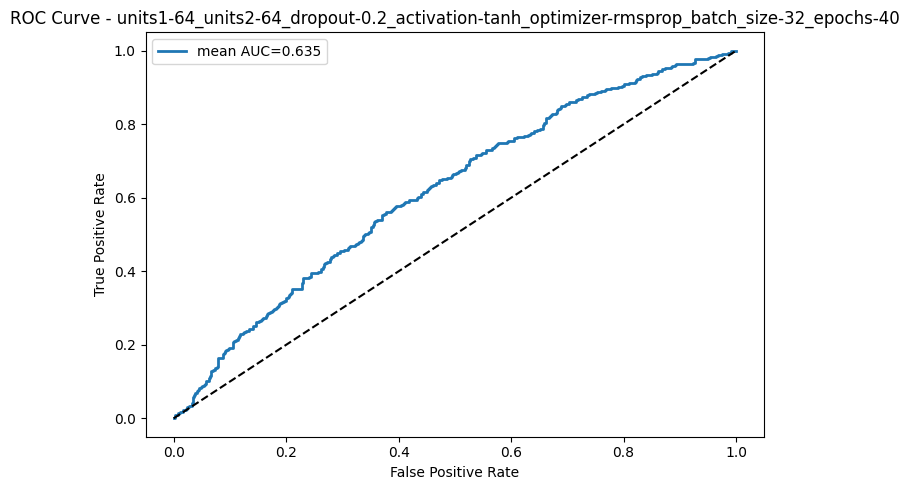

7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step 
Modelo hiperparams: units1-64_units2-64_dropout-0.2_activation-tanh_optimizer-rmsprop_batch_size-64_epochs-40
AUC promedio en CV: 0.624


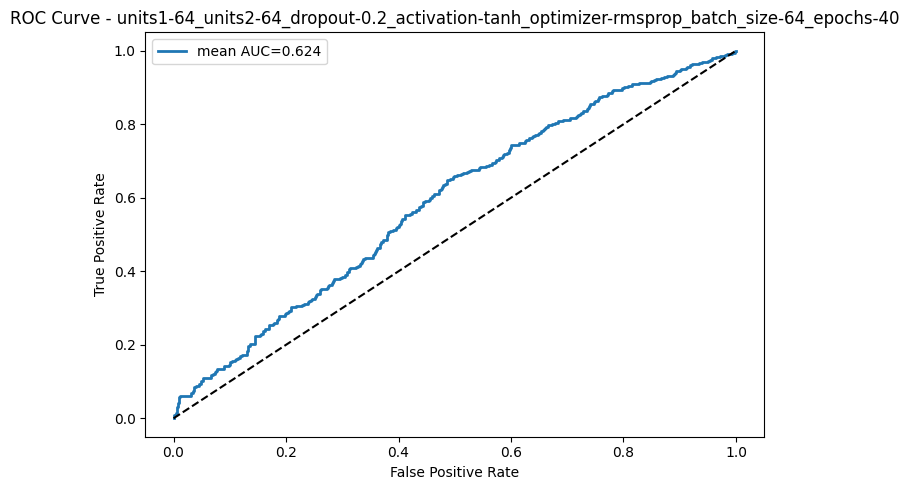

7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step 
Modelo hiperparams: units1-64_units2-64_dropout-0.2_activation-elu_optimizer-adam_batch_size-16_epochs-40
AUC promedio en CV: 0.643


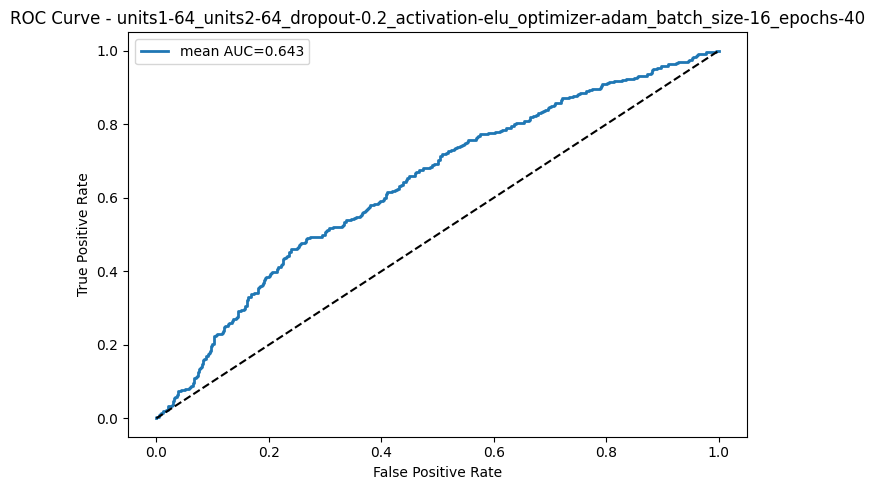

7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step 
Modelo hiperparams: units1-64_units2-64_dropout-0.2_activation-elu_optimizer-adam_batch_size-32_epochs-40
AUC promedio en CV: 0.636


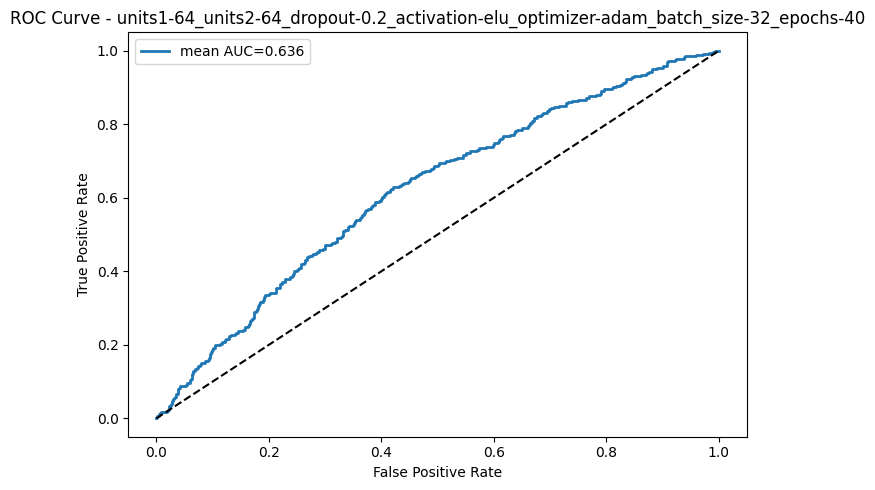

7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step
Modelo hiperparams: units1-64_units2-64_dropout-0.2_activation-elu_optimizer-adam_batch_size-64_epochs-40
AUC promedio en CV: 0.638


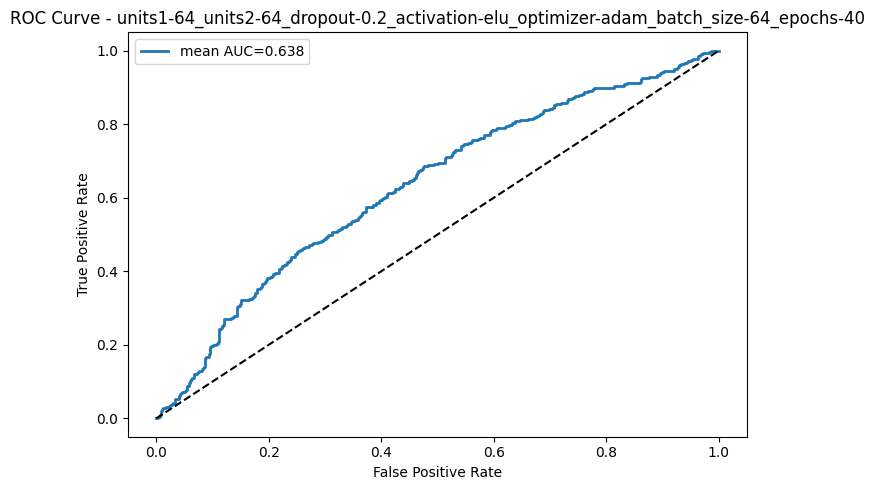

7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step 
Modelo hiperparams: units1-64_units2-64_dropout-0.2_activation-elu_optimizer-rmsprop_batch_size-16_epochs-40
AUC promedio en CV: 0.631


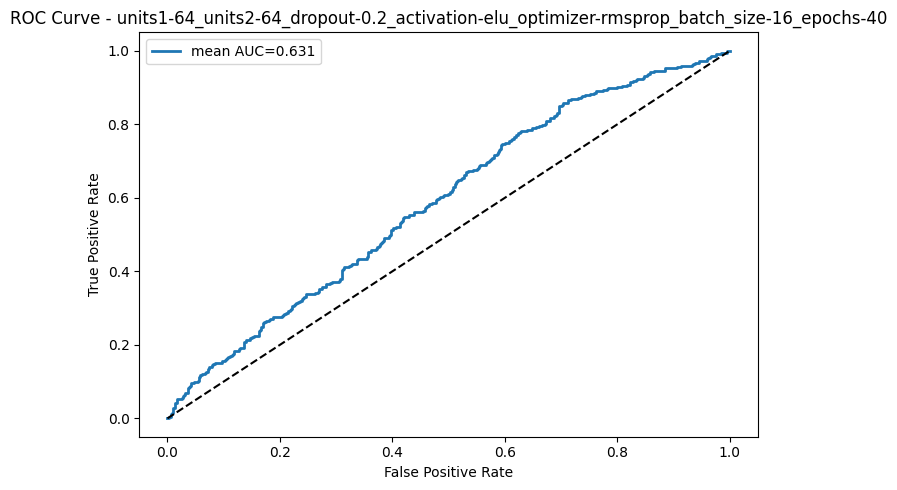

7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step 
Modelo hiperparams: units1-64_units2-64_dropout-0.2_activation-elu_optimizer-rmsprop_batch_size-32_epochs-40
AUC promedio en CV: 0.626


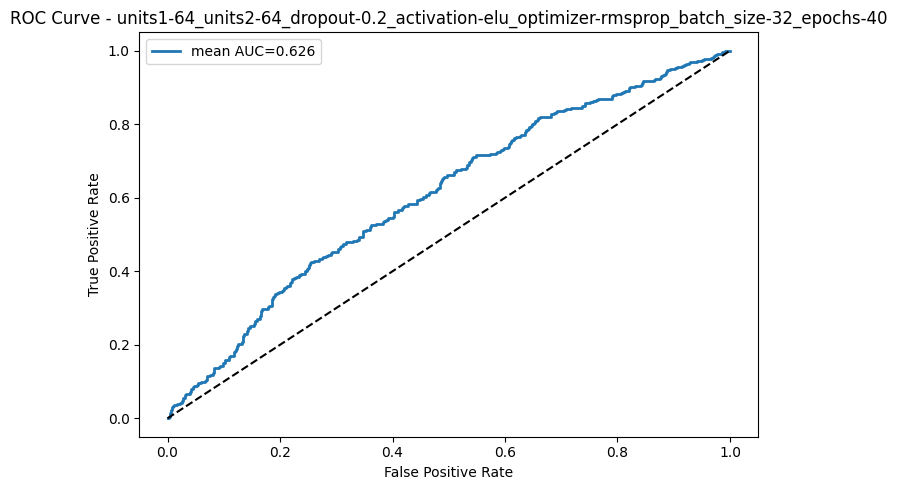

7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step 
Modelo hiperparams: units1-64_units2-64_dropout-0.2_activation-elu_optimizer-rmsprop_batch_size-64_epochs-40
AUC promedio en CV: 0.622


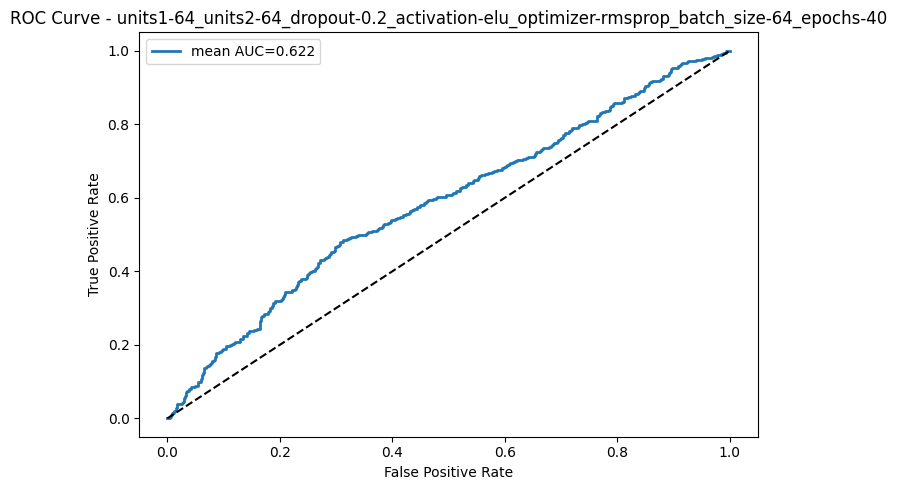

7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step 
Modelo hiperparams: units1-64_units2-64_dropout-0.5_activation-relu_optimizer-adam_batch_size-16_epochs-40
AUC promedio en CV: 0.558


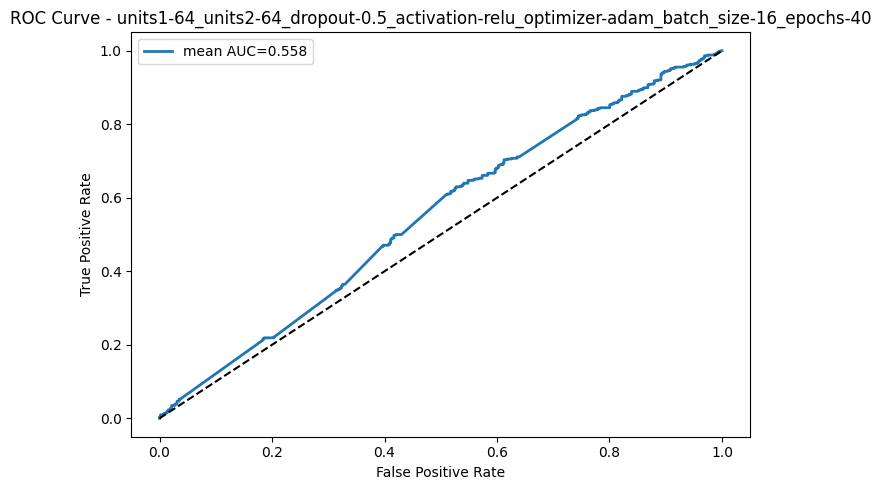

7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step 
Modelo hiperparams: units1-64_units2-64_dropout-0.5_activation-relu_optimizer-adam_batch_size-32_epochs-40
AUC promedio en CV: 0.587


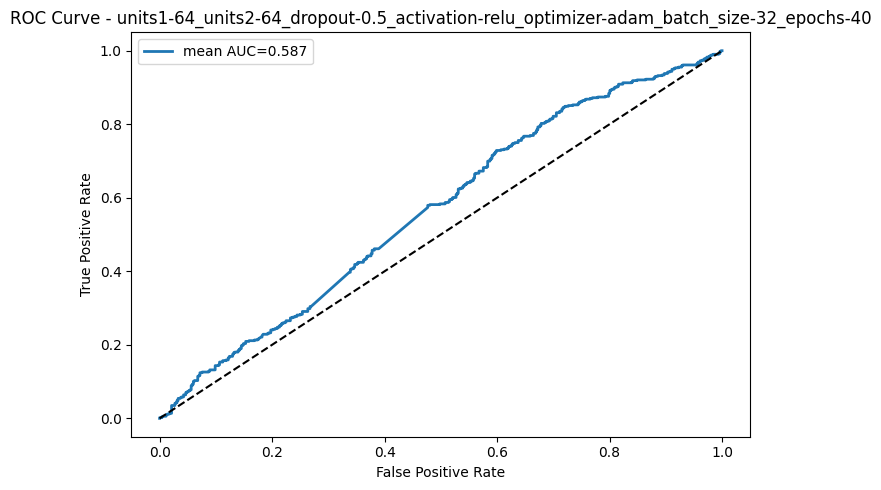

7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step 
Modelo hiperparams: units1-64_units2-64_dropout-0.5_activation-relu_optimizer-adam_batch_size-64_epochs-40
AUC promedio en CV: 0.584


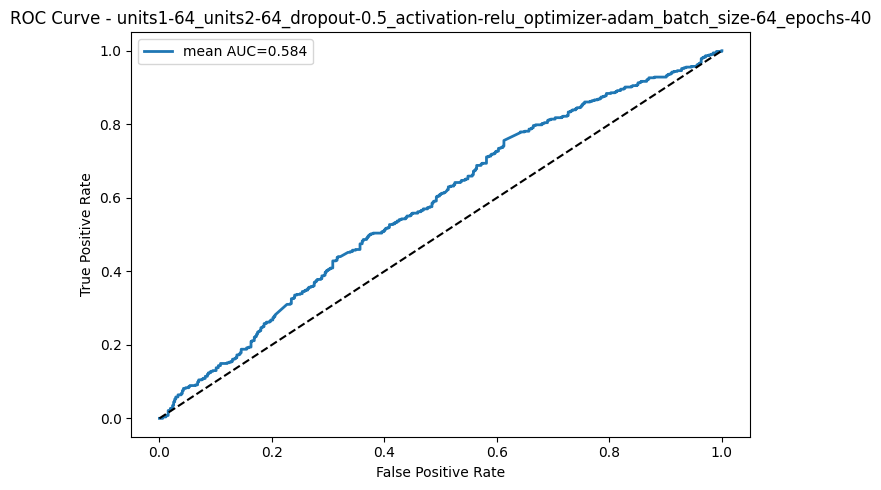

7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step 
Modelo hiperparams: units1-64_units2-64_dropout-0.5_activation-relu_optimizer-rmsprop_batch_size-16_epochs-40
AUC promedio en CV: 0.601


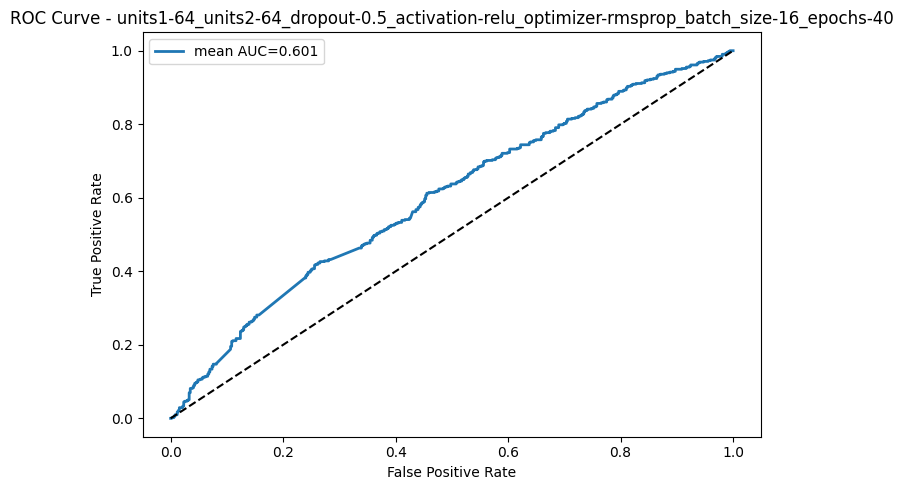

7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step 
Modelo hiperparams: units1-64_units2-64_dropout-0.5_activation-relu_optimizer-rmsprop_batch_size-32_epochs-40
AUC promedio en CV: 0.569


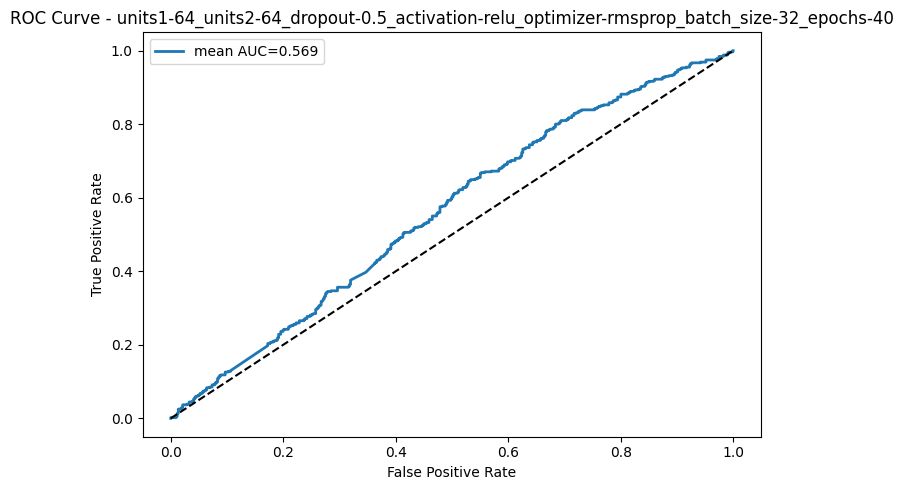

7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step 
Modelo hiperparams: units1-64_units2-64_dropout-0.5_activation-relu_optimizer-rmsprop_batch_size-64_epochs-40
AUC promedio en CV: 0.602


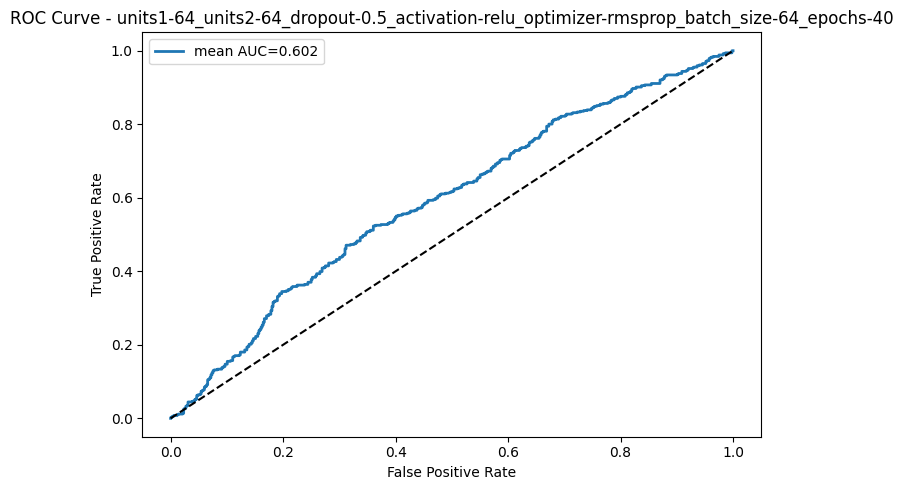

7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step 
Modelo hiperparams: units1-64_units2-64_dropout-0.5_activation-tanh_optimizer-adam_batch_size-16_epochs-40
AUC promedio en CV: 0.606


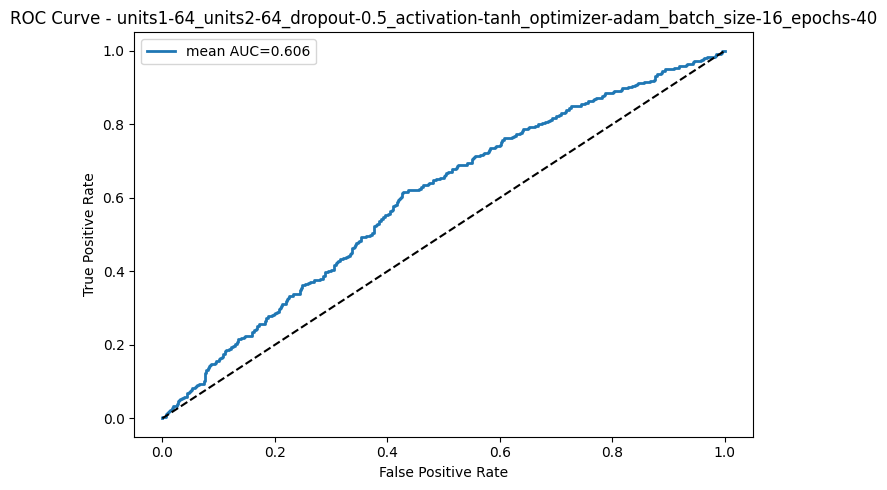

7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step 
Modelo hiperparams: units1-64_units2-64_dropout-0.5_activation-tanh_optimizer-adam_batch_size-32_epochs-40
AUC promedio en CV: 0.609


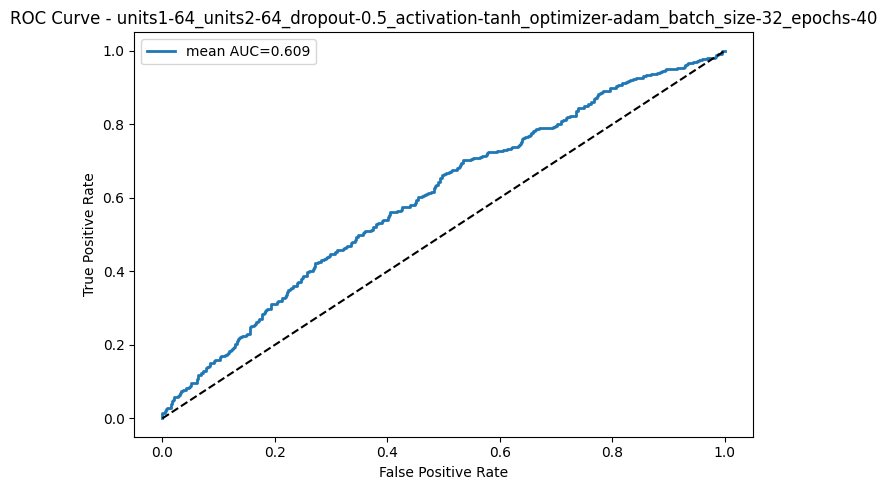

7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step 
Modelo hiperparams: units1-64_units2-64_dropout-0.5_activation-tanh_optimizer-adam_batch_size-64_epochs-40
AUC promedio en CV: 0.618


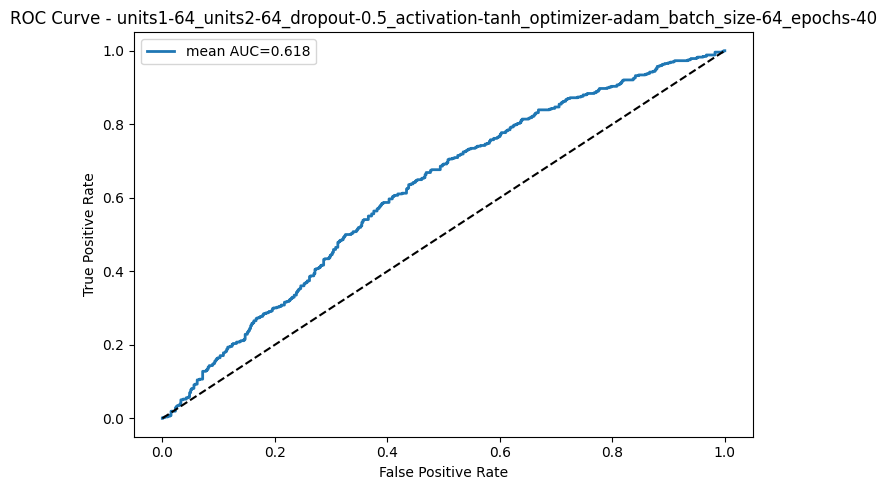

7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step 
Modelo hiperparams: units1-64_units2-64_dropout-0.5_activation-tanh_optimizer-rmsprop_batch_size-16_epochs-40
AUC promedio en CV: 0.614


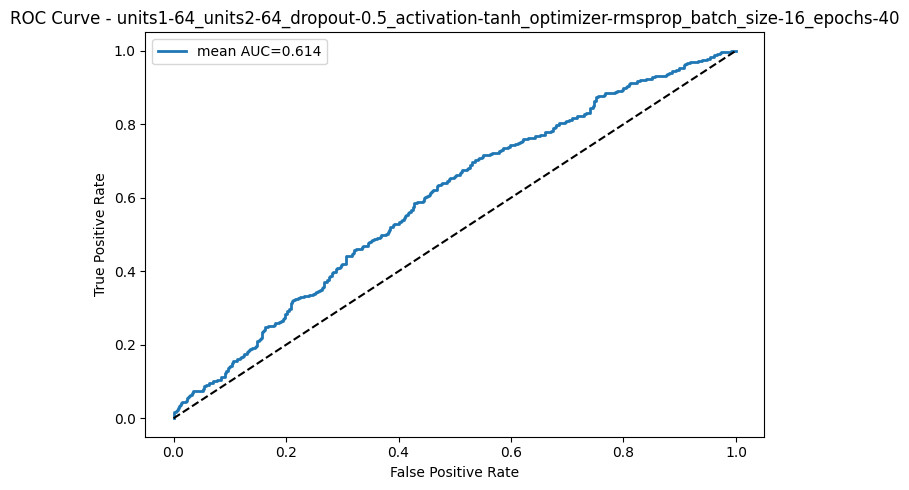

7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step 
Modelo hiperparams: units1-64_units2-64_dropout-0.5_activation-tanh_optimizer-rmsprop_batch_size-32_epochs-40
AUC promedio en CV: 0.607


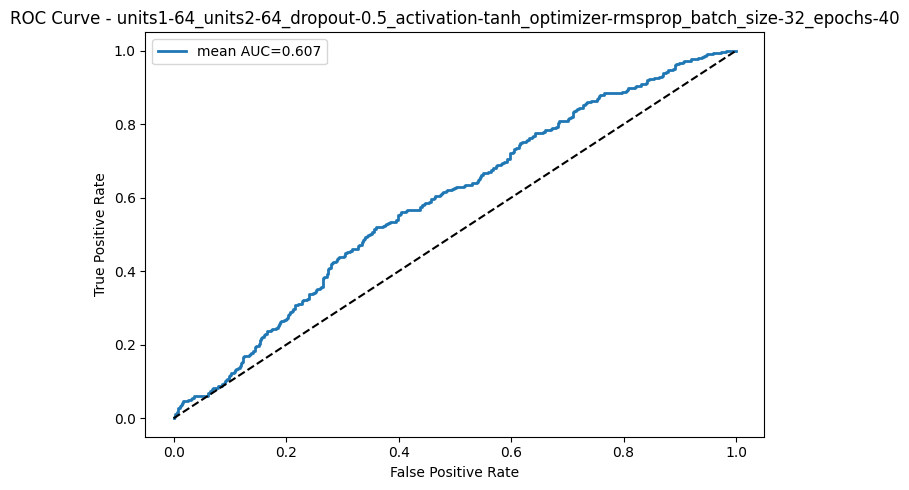

7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step 
Modelo hiperparams: units1-64_units2-64_dropout-0.5_activation-tanh_optimizer-rmsprop_batch_size-64_epochs-40
AUC promedio en CV: 0.608


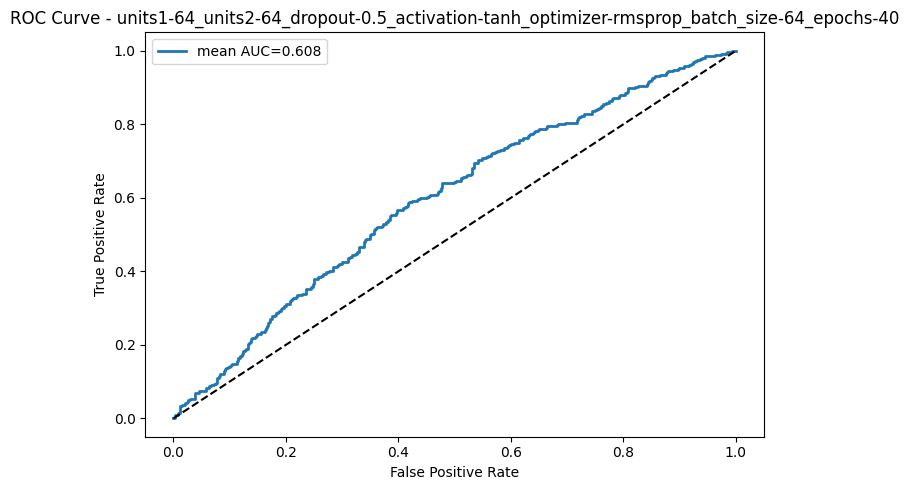

7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step 
Modelo hiperparams: units1-64_units2-64_dropout-0.5_activation-elu_optimizer-adam_batch_size-16_epochs-40
AUC promedio en CV: 0.628


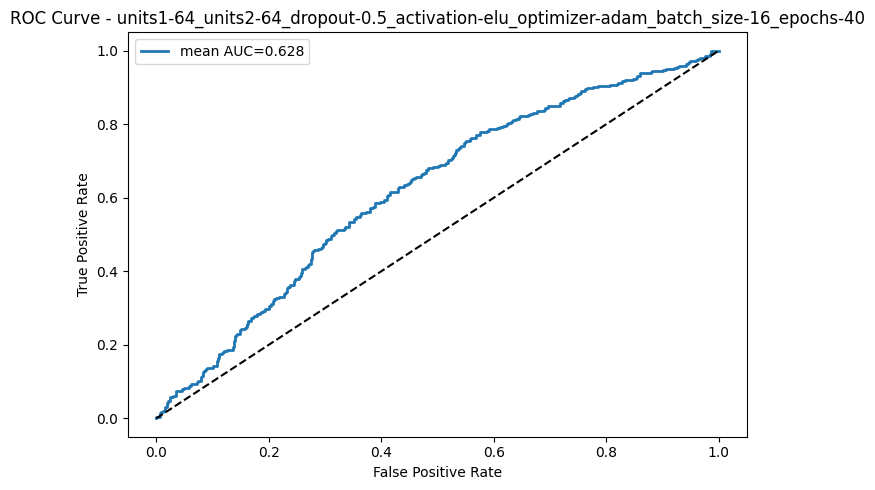

7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step 
Modelo hiperparams: units1-64_units2-64_dropout-0.5_activation-elu_optimizer-adam_batch_size-32_epochs-40
AUC promedio en CV: 0.616


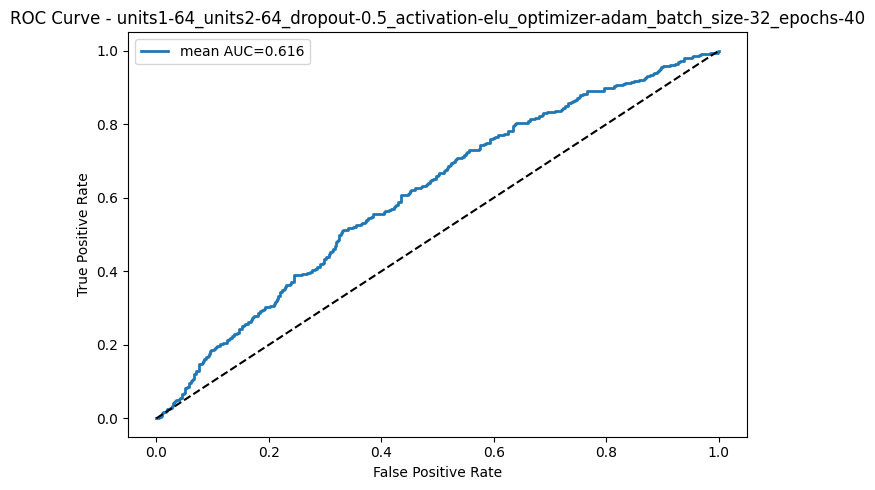

7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step 
Modelo hiperparams: units1-64_units2-64_dropout-0.5_activation-elu_optimizer-adam_batch_size-64_epochs-40
AUC promedio en CV: 0.607


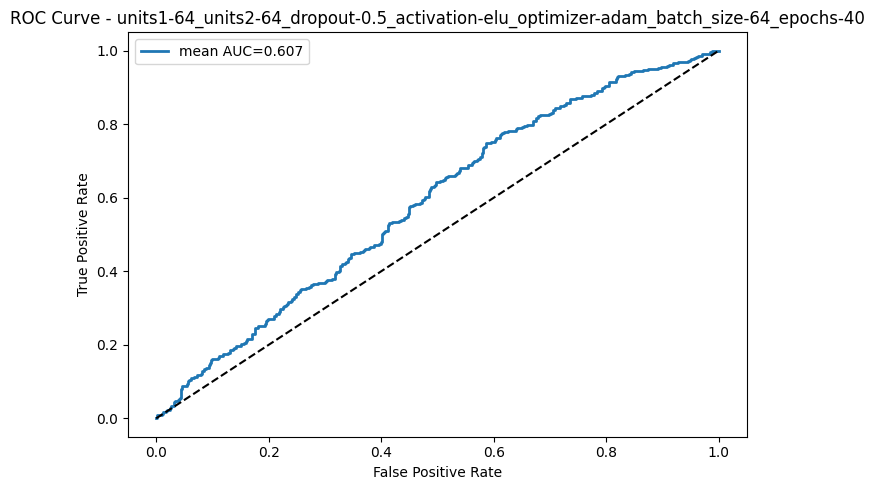

7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step 
Modelo hiperparams: units1-64_units2-64_dropout-0.5_activation-elu_optimizer-rmsprop_batch_size-16_epochs-40
AUC promedio en CV: 0.615


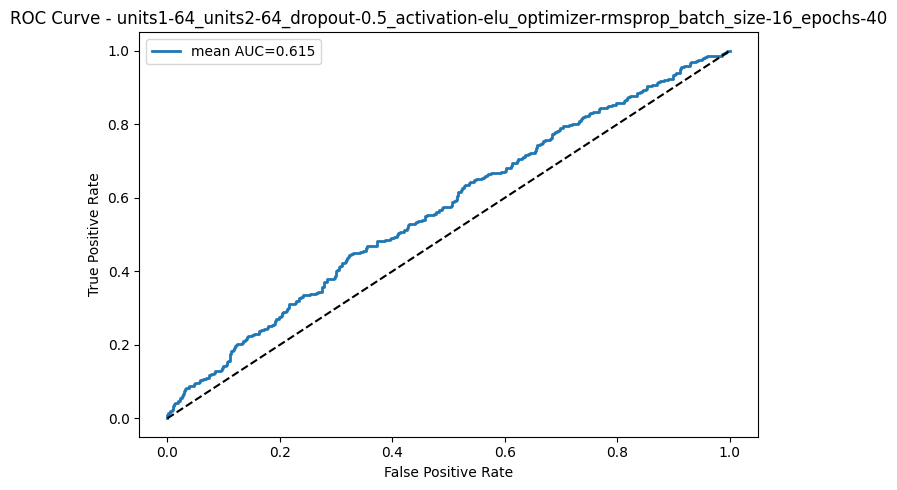

7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 
Modelo hiperparams: units1-64_units2-64_dropout-0.5_activation-elu_optimizer-rmsprop_batch_size-32_epochs-40
AUC promedio en CV: 0.628


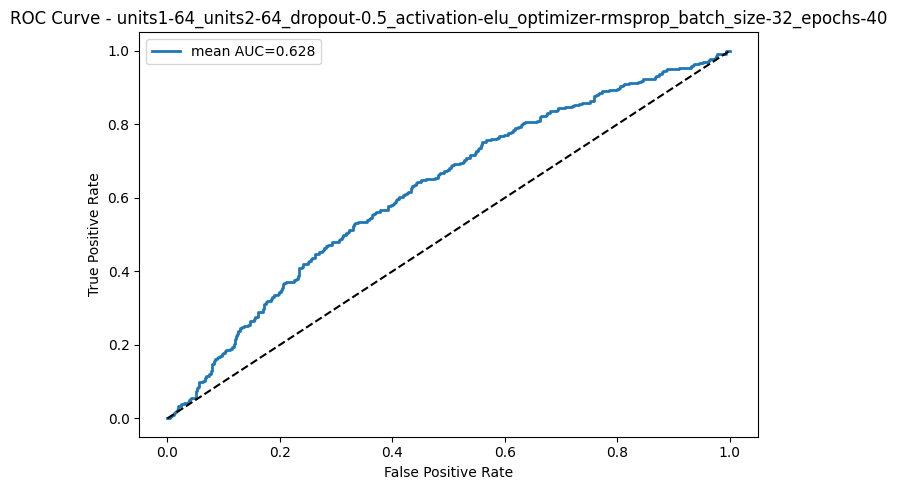

7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step 
Modelo hiperparams: units1-64_units2-64_dropout-0.5_activation-elu_optimizer-rmsprop_batch_size-64_epochs-40
AUC promedio en CV: 0.619


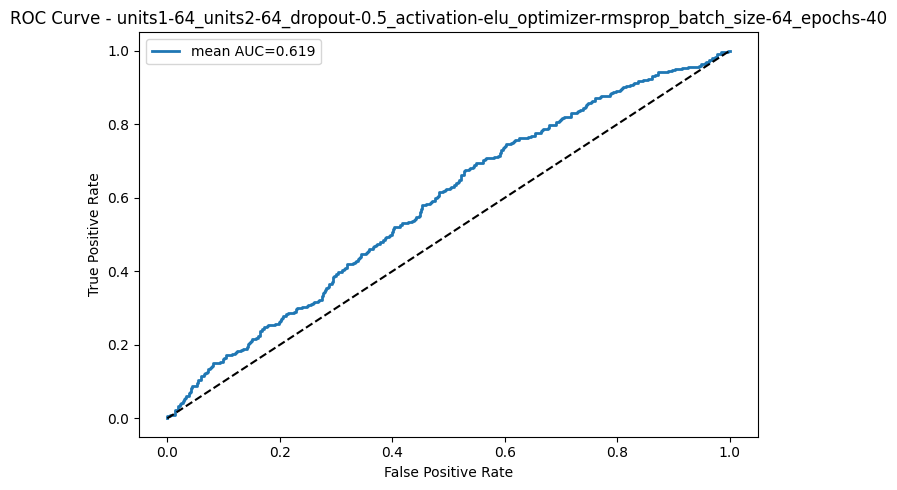

7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step 
Modelo hiperparams: units1-128_units2-16_dropout-0.2_activation-relu_optimizer-adam_batch_size-16_epochs-40
AUC promedio en CV: 0.584


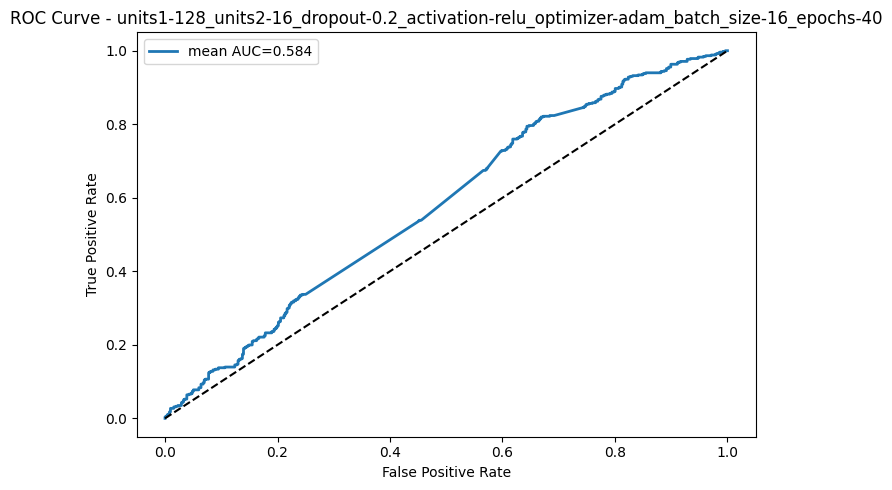

7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step 
Modelo hiperparams: units1-128_units2-16_dropout-0.2_activation-relu_optimizer-adam_batch_size-32_epochs-40
AUC promedio en CV: 0.588


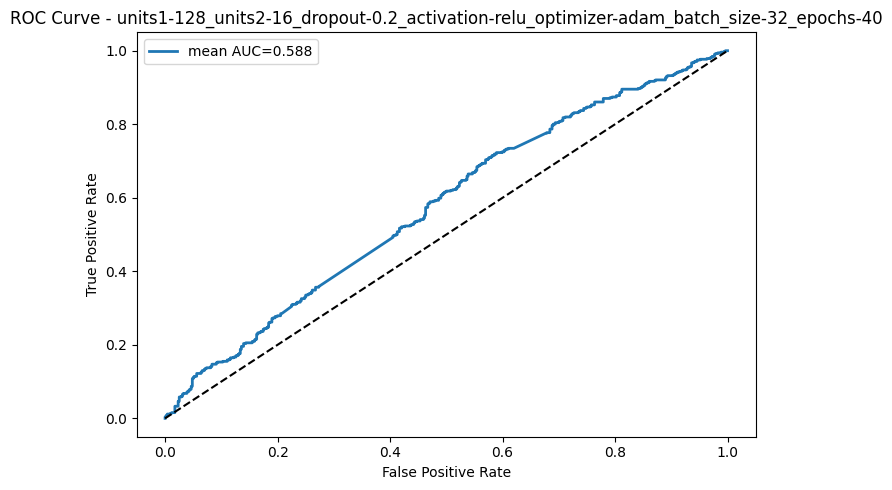

7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step 
Modelo hiperparams: units1-128_units2-16_dropout-0.2_activation-relu_optimizer-adam_batch_size-64_epochs-40
AUC promedio en CV: 0.588


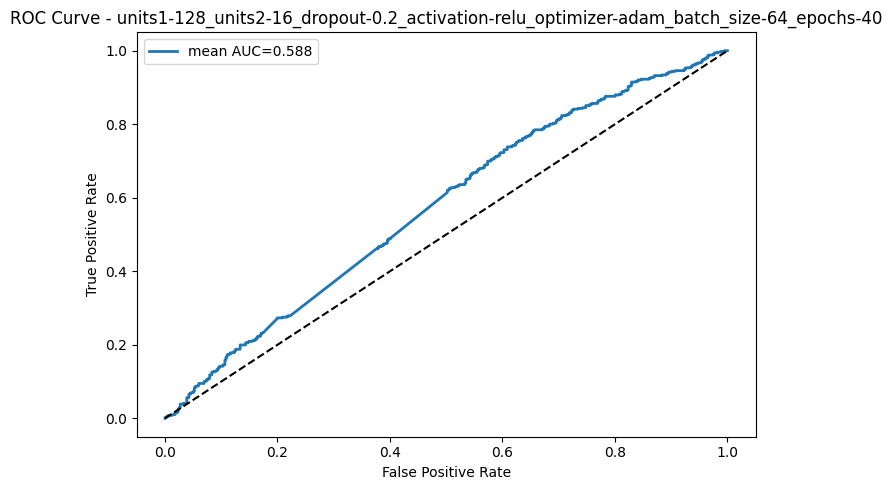

7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step 
Modelo hiperparams: units1-128_units2-16_dropout-0.2_activation-relu_optimizer-rmsprop_batch_size-16_epochs-40
AUC promedio en CV: 0.572


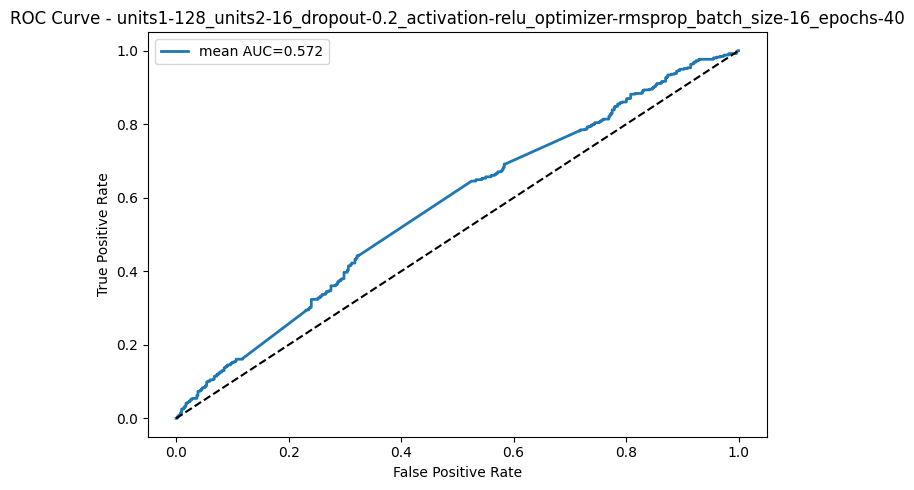

7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 
Modelo hiperparams: units1-128_units2-16_dropout-0.2_activation-relu_optimizer-rmsprop_batch_size-32_epochs-40
AUC promedio en CV: 0.587


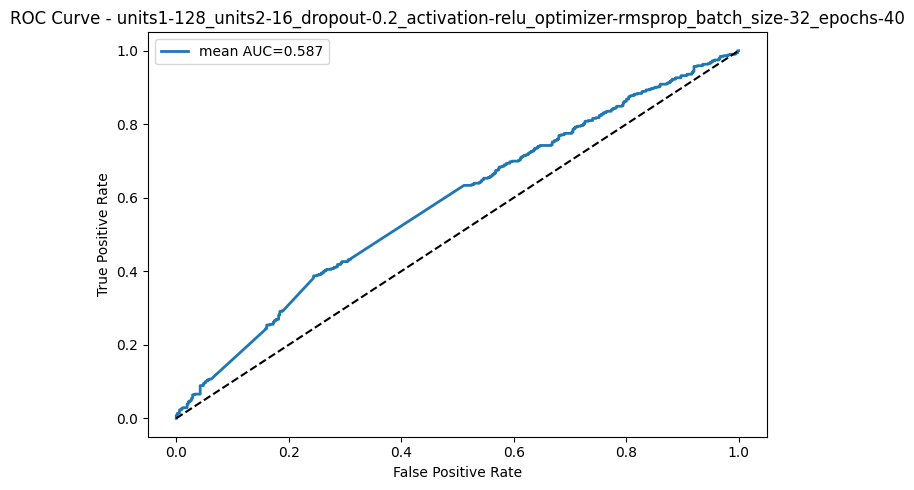

7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step 
Modelo hiperparams: units1-128_units2-16_dropout-0.2_activation-relu_optimizer-rmsprop_batch_size-64_epochs-40
AUC promedio en CV: 0.583


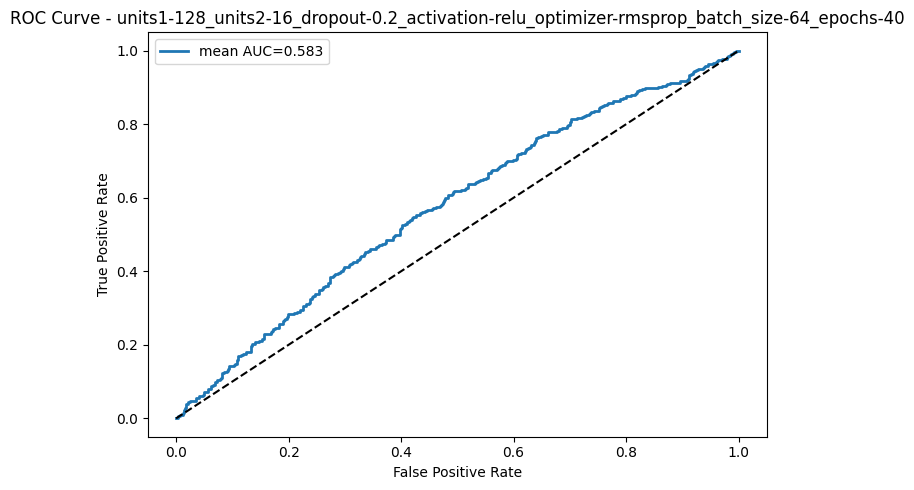

7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step 
Modelo hiperparams: units1-128_units2-16_dropout-0.2_activation-tanh_optimizer-adam_batch_size-16_epochs-40
AUC promedio en CV: 0.638


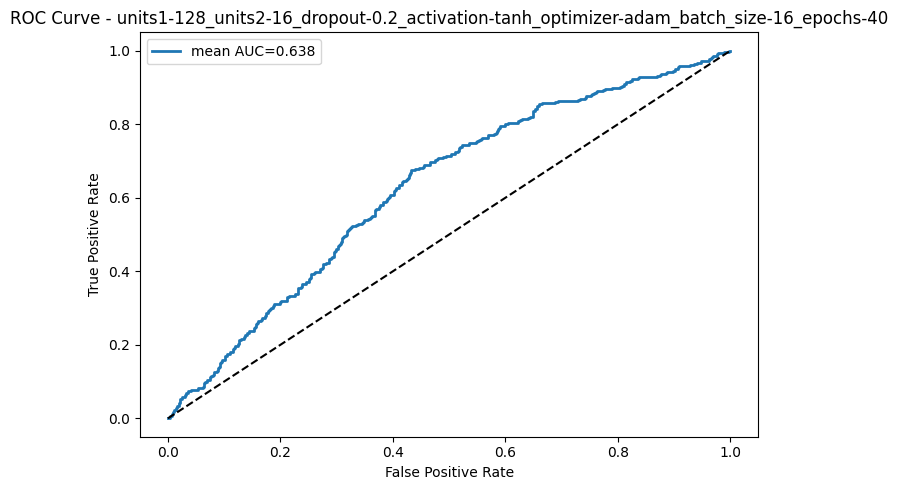

7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 
Modelo hiperparams: units1-128_units2-16_dropout-0.2_activation-tanh_optimizer-adam_batch_size-32_epochs-40
AUC promedio en CV: 0.631


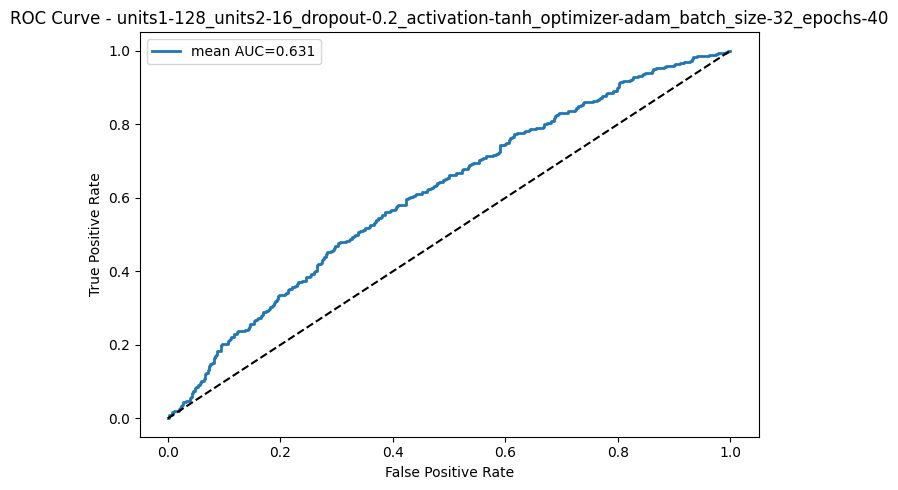

7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step 
Modelo hiperparams: units1-128_units2-16_dropout-0.2_activation-tanh_optimizer-adam_batch_size-64_epochs-40
AUC promedio en CV: 0.626


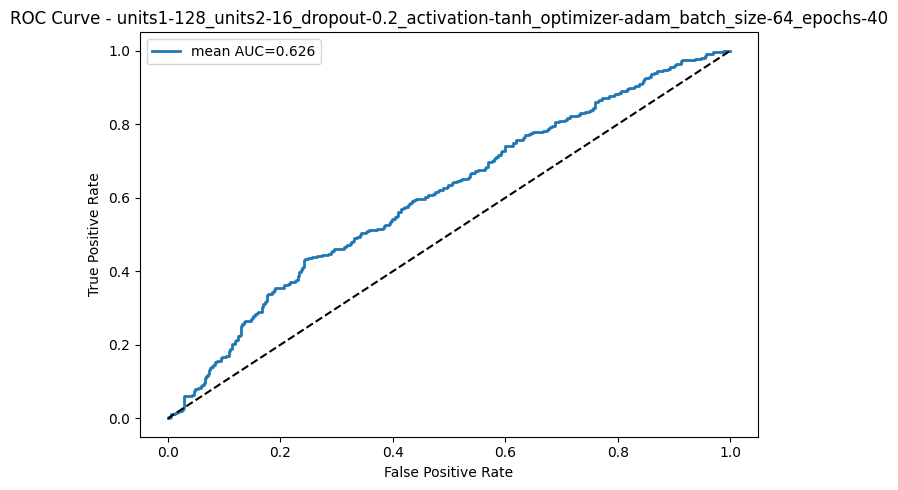

7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step 
Modelo hiperparams: units1-128_units2-16_dropout-0.2_activation-tanh_optimizer-rmsprop_batch_size-16_epochs-40
AUC promedio en CV: 0.629


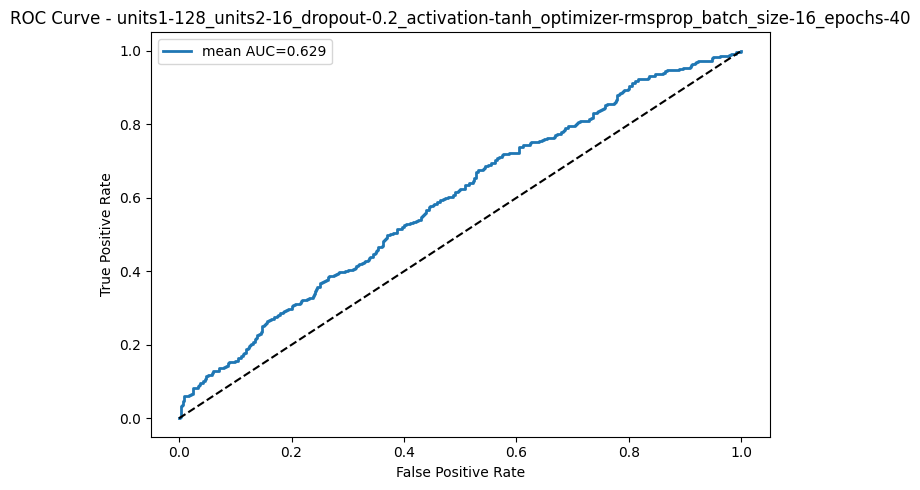

7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step 
Modelo hiperparams: units1-128_units2-16_dropout-0.2_activation-tanh_optimizer-rmsprop_batch_size-32_epochs-40
AUC promedio en CV: 0.625


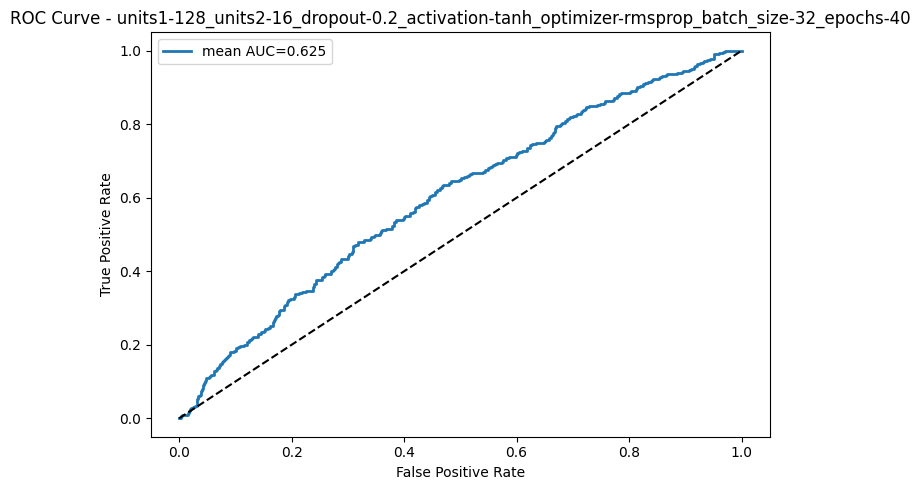

7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step 
Modelo hiperparams: units1-128_units2-16_dropout-0.2_activation-tanh_optimizer-rmsprop_batch_size-64_epochs-40
AUC promedio en CV: 0.621


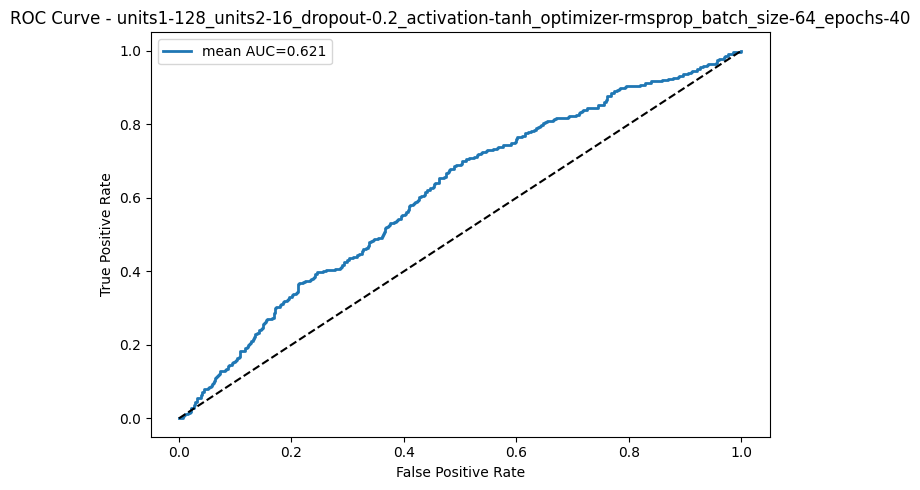

7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step 


In [ ]:
import numpy as np
import tensorflow as tf
from sklearn.model_selection import StratifiedKFold
from sklearn.metrics import roc_auc_score, roc_curve
from itertools import product
import os
import json
import matplotlib.pyplot as plt

# --- Configuración ---
result_dir = "model_results"
os.makedirs(result_dir, exist_ok=True)

param_grid = {
    "units1": [32, 64, 128],
    "units2": [16, 32, 64],
    "dropout": [0.2, 0.5],
    "activation": ["relu", "tanh", "elu"],
    "optimizer": ["adam", "rmsprop"],
    "batch_size": [16, 32, 64],
    "epochs": [40]
}
cv = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)

def param_id(param_dict):
    """String identificador único del set de hiperparámetros para archivos."""
    return "_".join([f"{k}-{v}" for k, v in param_dict.items()])

best_auc = 0
best_params = None

# --- BÚSQUEDA MANUAL ---
for params in product(*param_grid.values()):
    param_dict = dict(zip(param_grid.keys(), params))
    save_id = param_id(param_dict)
    result_path = os.path.join(result_dir, f"{save_id}.json")
    plot_path = os.path.join(result_dir, f"{save_id}_roc.png")
    model_path = os.path.join(result_dir, f"{save_id}_keras_model.keras")
    
    # Si ya existe el resultado, sáltalo
    if os.path.exists(result_path):
        print(f"\033[93mModelo ya existente: {save_id}. Saltando...\033[0m")
        continue

    aucs = []
    history_list = []
    all_true = []
    all_pred = []
    for fold, (train_idx, test_idx) in enumerate(cv.split(X, y)):
        model = tf.keras.Sequential([
            tf.keras.Input(shape=(X.shape[1],)),
            tf.keras.layers.Dense(param_dict["units1"], activation=param_dict["activation"]),
            tf.keras.layers.Dropout(param_dict["dropout"]),
            tf.keras.layers.Dense(param_dict["units2"], activation=param_dict["activation"]),
            tf.keras.layers.Dropout(param_dict["dropout"]),
            tf.keras.layers.Dense(1, activation="sigmoid")
        ])
        model.compile(optimizer=param_dict["optimizer"], loss="binary_crossentropy", metrics=["AUC"])
        history = model.fit(X[train_idx], y[train_idx], epochs=param_dict["epochs"],
                            batch_size=param_dict["batch_size"], verbose=0, validation_data=(X[test_idx], y[test_idx]))
        preds = model.predict(X[test_idx]).flatten()
        auc = roc_auc_score(y[test_idx], preds)
        aucs.append(auc)
        history_list.append(history.history)
        all_true += list(y[test_idx])
        all_pred += list(preds)
        # Guarda el modelo solo del último fold para referencia
        if fold == cv.n_splits - 1:
            model.save(model_path)

    mean_auc = float(np.mean(aucs))
    print(f"\033[1mModelo hiperparams: {save_id}\nAUC promedio en CV: {mean_auc:.3f}\033[0m")

    # --- Guardar resultados ---
    results = {
        "param_dict": param_dict,
        "mean_auc": mean_auc,
        "fold_aucs": [float(a) for a in aucs],
        "history": history_list
    }
    with open(result_path, "w") as f:
        json.dump(results, f, indent=2)

    # --- Graficar ROC ---
    fpr, tpr, _ = roc_curve(all_true, all_pred)
    plt.figure(figsize=(7,5))
    plt.plot(fpr, tpr, label=f"mean AUC={mean_auc:.3f}", lw=2)
    plt.plot([0, 1], [0, 1], 'k--')
    plt.xlabel("False Positive Rate")
    plt.ylabel("True Positive Rate")
    plt.title(f"ROC Curve - {save_id}")
    plt.legend()
    plt.tight_layout()
    plt.savefig(plot_path)
    plt.show()

    # --- Actualizar mejor modelo ---
    if mean_auc > best_auc:
        best_auc = mean_auc
        best_params = param_dict

# Resumen final
print("\n\033[92mMejores hiperparámetros encontrados:\033[0m", best_params)
print(f"\033[1mMejor AUC promedio: {best_auc:.3f}\033[0m")


## Optimizados

Mejores hiperparámetros Gradient Boosting: {'learning_rate': 0.2, 'max_depth': 6, 'max_features': 'sqrt', 'min_samples_leaf': 1, 'min_samples_split': 5, 'n_estimators': 300, 'subsample': 0.8}
AUC ROC promedio Gradient Boosting optimizado: 0.7128 ± 0.0242

Mejores hiperparámetros XGBoost: {'colsample_bytree': 1.0, 'gamma': 0.1, 'learning_rate': 0.2, 'max_depth': 8, 'n_estimators': 100, 'subsample': 1.0}
AUC ROC promedio XGBoost optimizado: 0.7064 ± 0.0295

Mejores hiperparámetros: {'bootstrap': False, 'max_depth': None, 'max_features': 0.3, 'min_samples_leaf': 2, 'min_samples_split': 5, 'n_estimators': 100}
AUC ROC promedio Random Forest optimizado: 0.7247 ± 0.0168

AUC ROC promedio LightGBM (grid search): 0.6968 ± 0.0164